In [7]:
import torch
import matplotlib.pyplot as plt

def heatmap_q_k_cnt(state):
    ks = state['ks']
    q_timber = state['q_timber']
    k = state['k']
    v = state['v']
    mask_k = state['mask_k']
    block_size_q = state['block_size_q']
    block_size_k = state['block_size_k']
    ensemble = state['ensemble'],
    ensemble_model_setting = state['ensemble_model_setting' ]
    ensemble_method = state['ensemble_method'],
    ensemble_method_final = state['ensemble_method_final']
    ensemble_per_layer_n = state['ensemble_per_layer_n']
    ensemble_per_attn_iter_n = state['ensemble_per_attn_iter_n']
    ensemble_model_n = state['ensemble_model_n']
    ensemble_particular_layer = state['ensemble_particular_layer']
    layer_id = state['layer_id']

    ensemble_attn_mask_per_layer = state['ensemble_attn_mask_per_layer']
    per_query_token_cnt_diclist = state['per_query_token_cnt_diclist']
    ensembled_indices = state['ensembled_indices']
    origin_sparsity = state['origin_sparsity']
    sparsity_per_layer = state['sparsity_per_layer']
    sparsity_ratio = state['sparse_ratio']

    N_H, TDST, HID = q_timber.shape
    _, TSRC, _ = k.shape
    assert len(per_query_token_cnt_diclist) == N_H * TDST//block_size_q
    per_head_token_cnt_dic2list = [per_query_token_cnt_diclist[i:i+(TDST//block_size_q)] for i in range(0, len(per_query_token_cnt_diclist), TDST//block_size_q)]

    for h in range(N_H):
        print(f"plot h : ", {})

        N = 1
        print(f"N hardcoded to : N={N}")
        q_k_map_h = torch.zeros((TDST//block_size_q, TSRC))

        for i, per_query_cnt in enumerate(per_head_token_cnt_dic2list[h]):
            for idx, count in per_query_cnt.items():
                if idx >= TSRC:
                    continue
                q_k_map_h[i, idx] = count

        print(q_k_map_h)
        # Visualization
        plt.figure(figsize=(15, 6))
        plt.imshow(q_k_map_h, cmap='hot', interpolation='nearest', aspect='auto')
        plt.colorbar()
        plt.title(f'# of common token selection btw models : l_{layer_id}_h{N*h}')
        plt.xlabel('TSRC')
        plt.ylabel('TDST_BQ')
        plt.show()


In [10]:
def plot_per_layer(l):
    ensemble_model_setting = "random_pruning"
    ensemble_method = "final_attn"
    ensemble_method_final = "all_agree"
    ensemble_model_n = 5
    ensemble_per_attn_iter_n = 5

    layer_ids = [0, 5, 20, 30, 39]
    ensemble_per_layer_n = 1

    layer_id = l
    ensemble_particular_layer = l

    ###
    path = f'../../../../cache/ensemble/llama13b_chat/method/{ensemble_model_setting}_{ensemble_method}_{ensemble_method_final}/l_{layer_id}_m_{ensemble_model_n}_pl_{ensemble_per_layer_n}_pat{ensemble_per_attn_iter_n}_ln{ensemble_particular_layer}.pth'
    ###
    state = torch.load(path, map_location='cpu')

    heatmap_q_k_cnt(state)

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 2., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


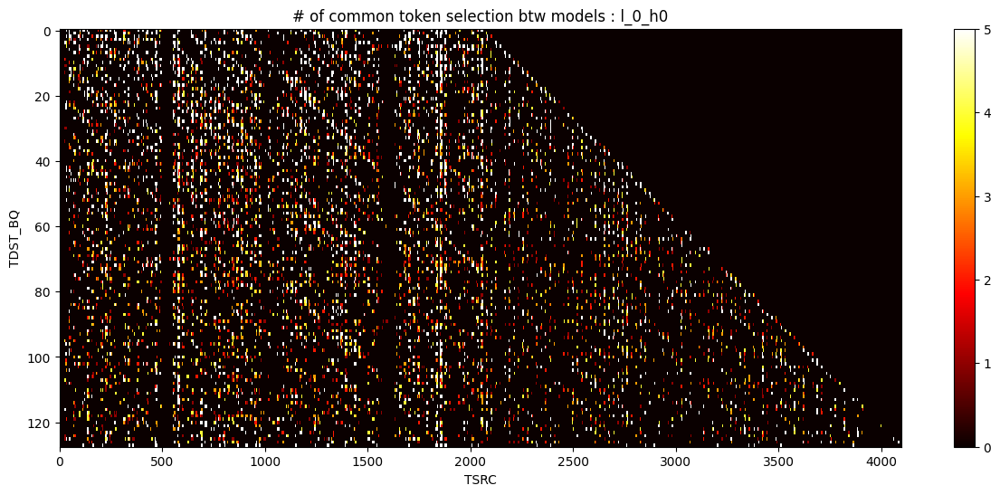

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


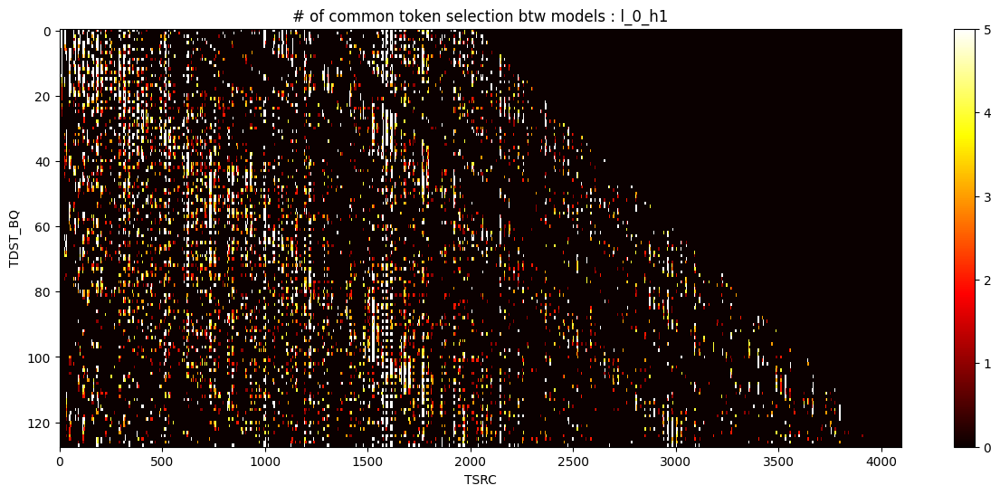

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


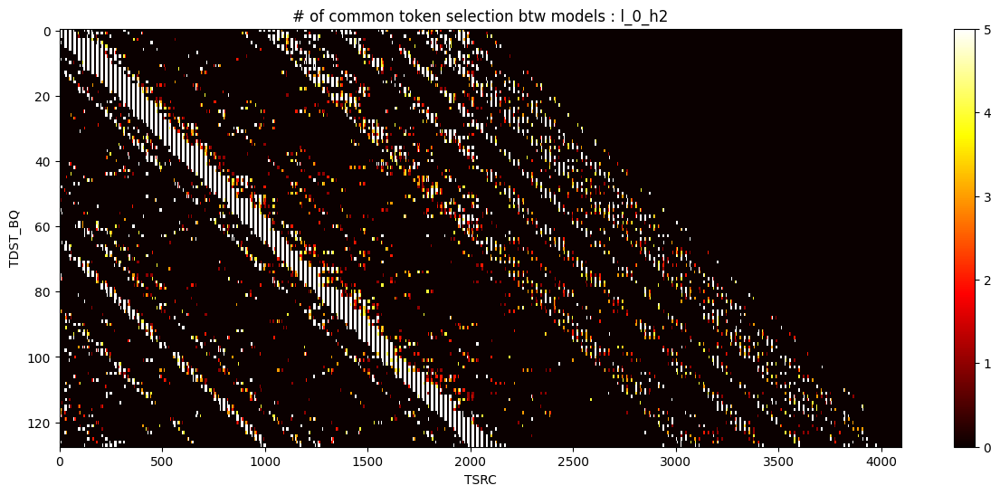

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


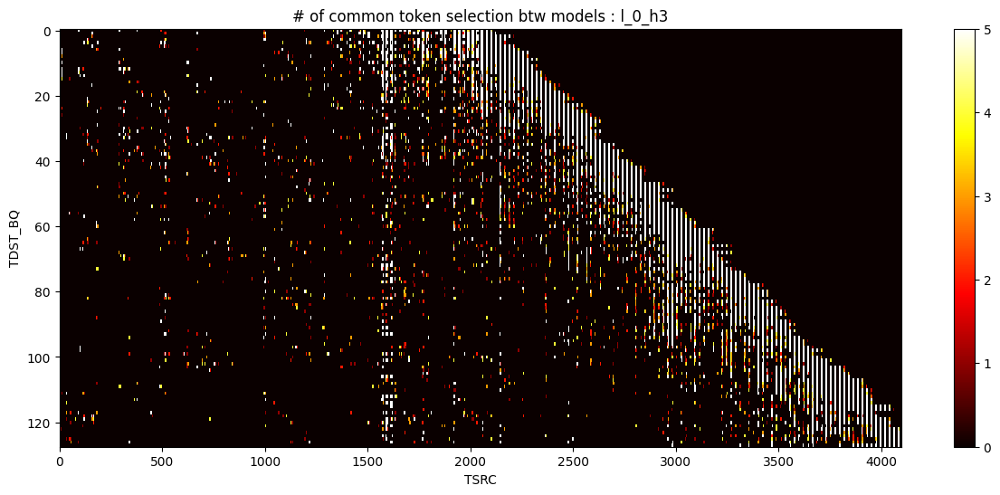

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


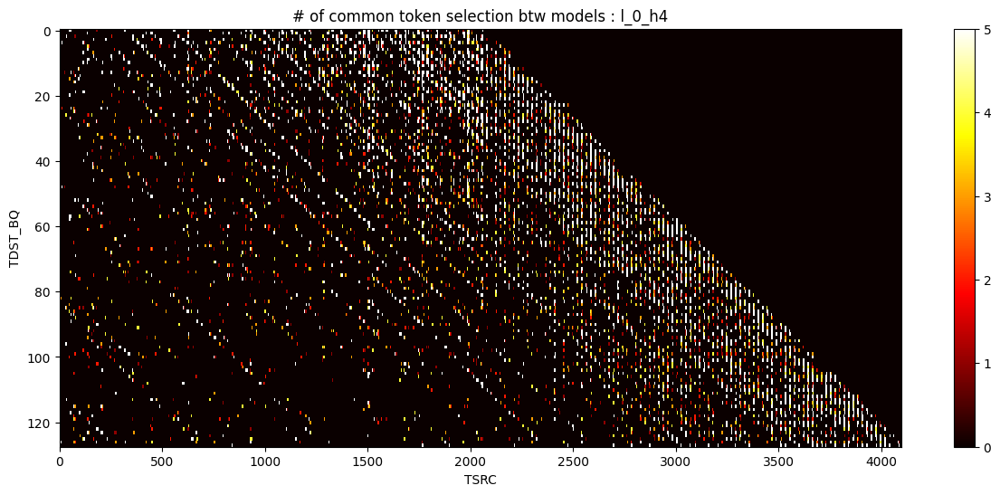

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


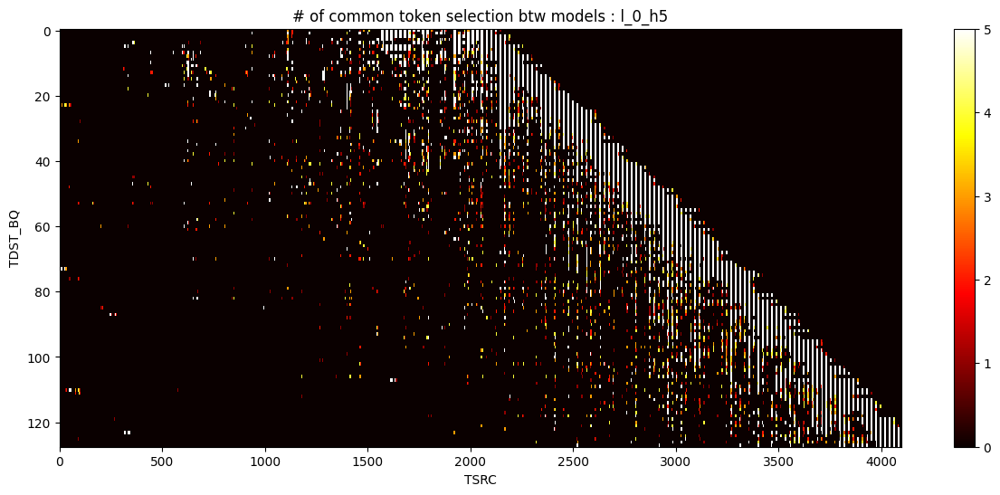

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [4., 0., 4.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


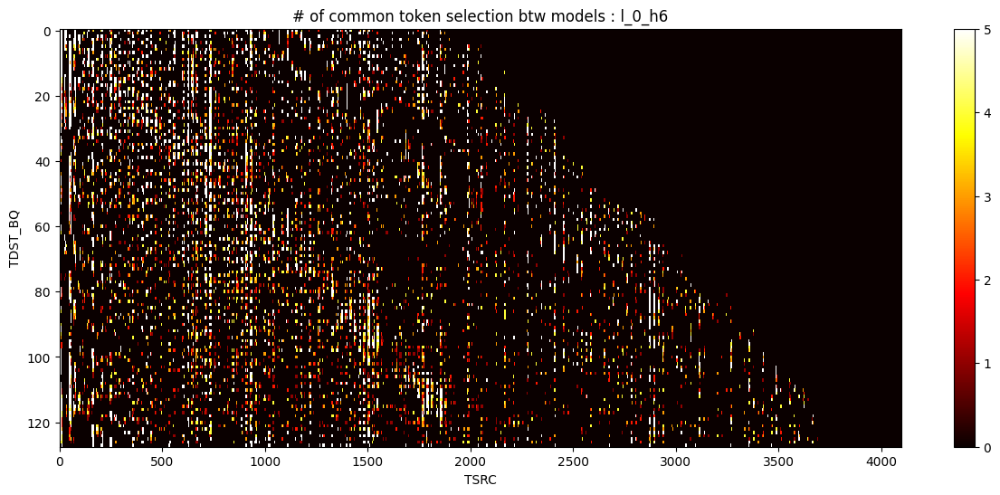

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


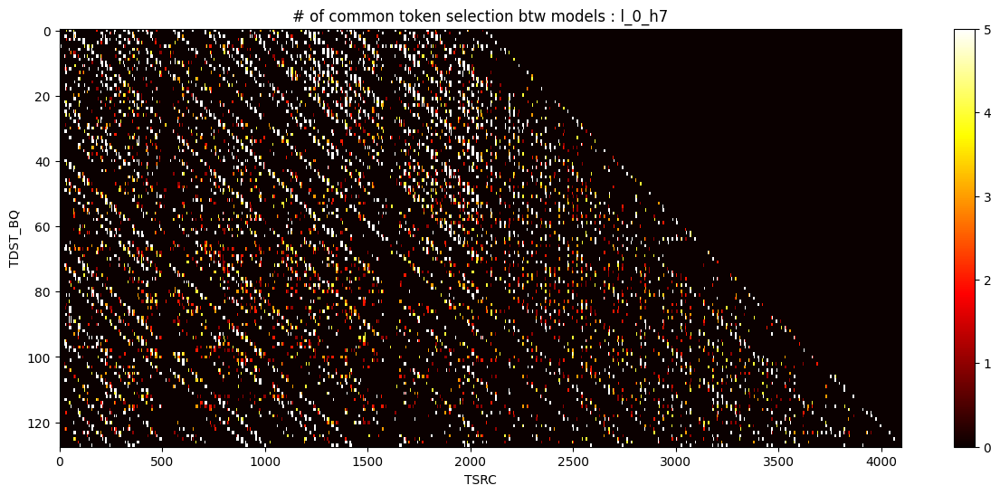

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 1.,  ..., 0., 5., 0.],
        [0., 0., 1.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


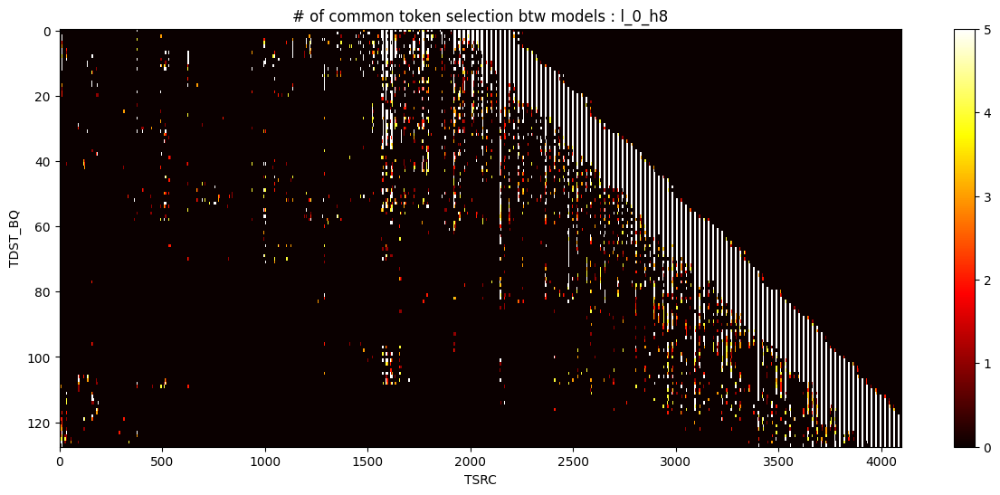

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


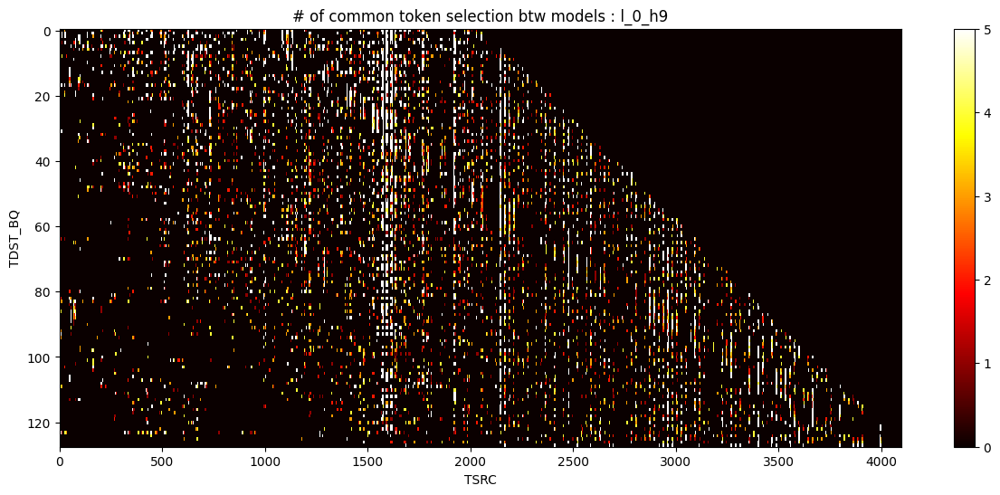

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


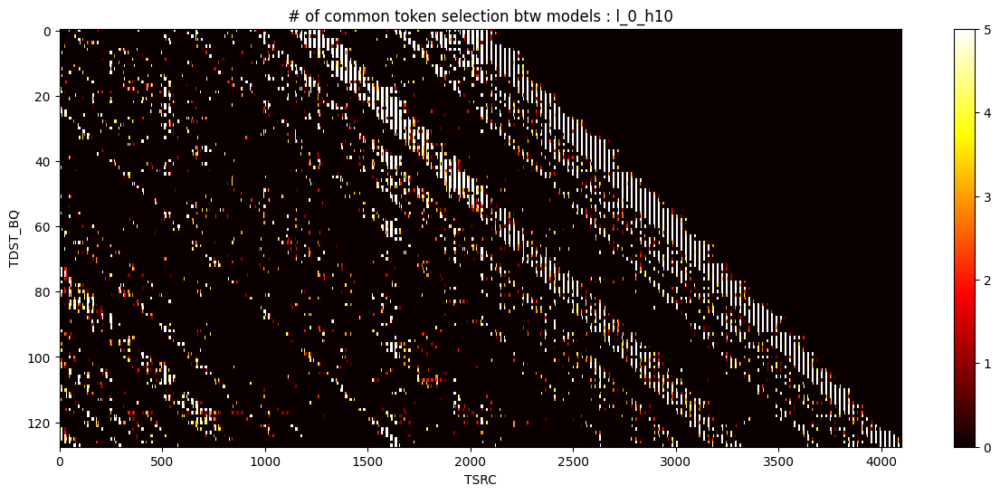

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


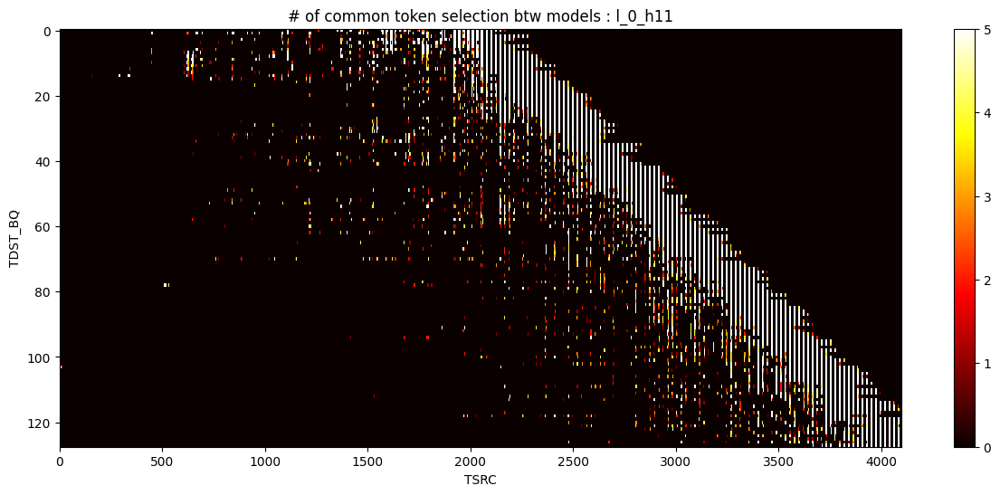

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


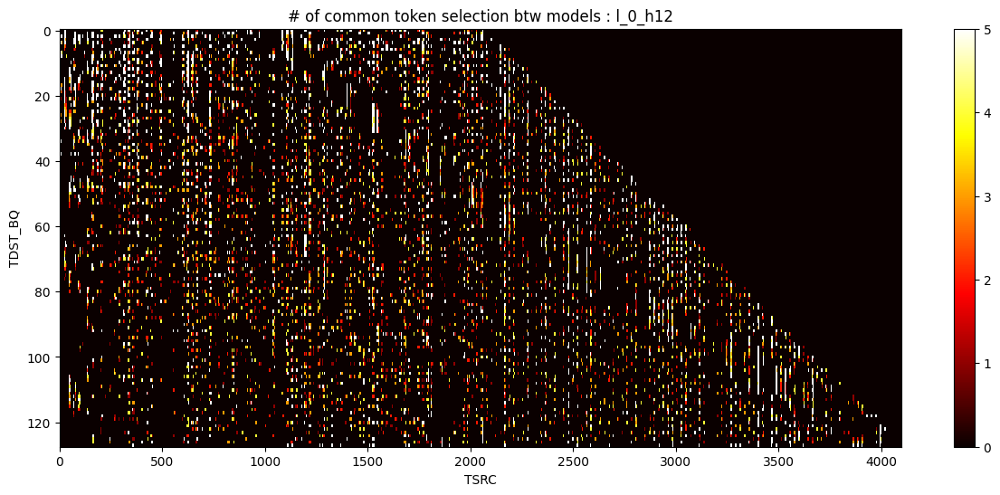

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


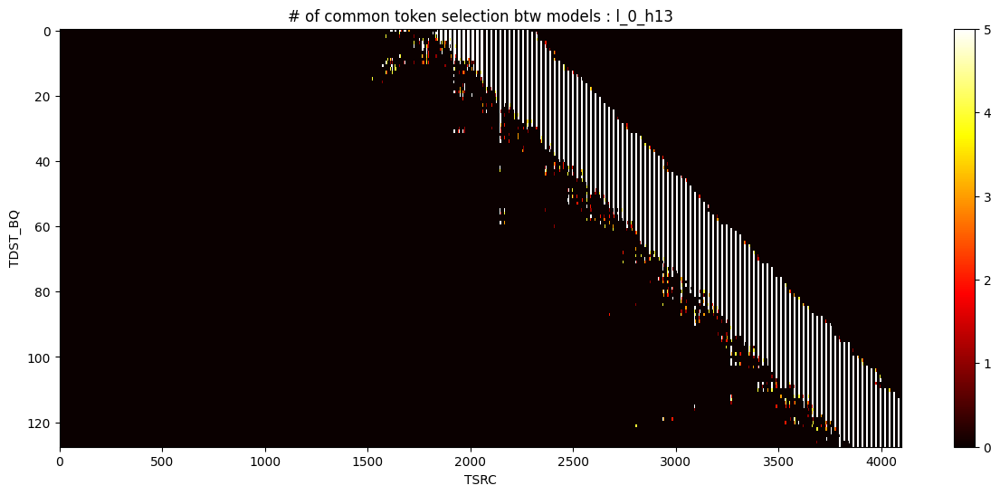

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


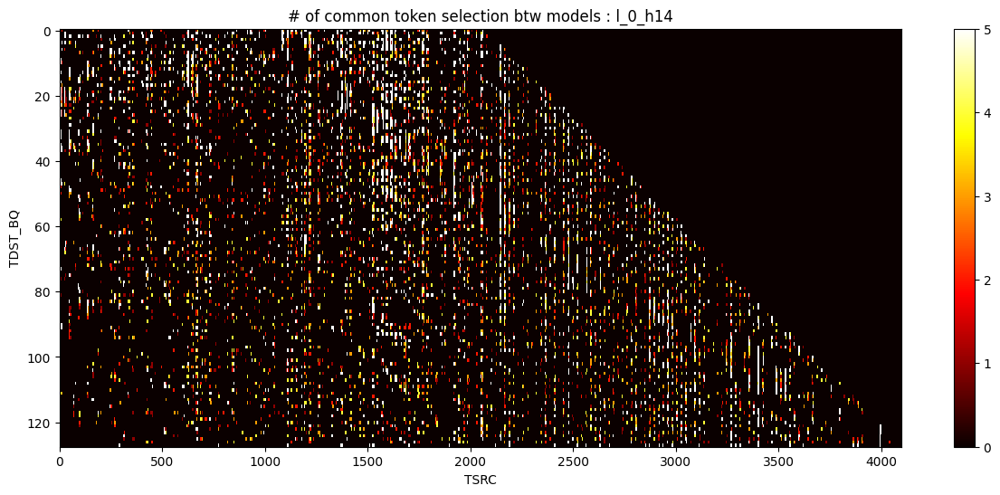

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.]])


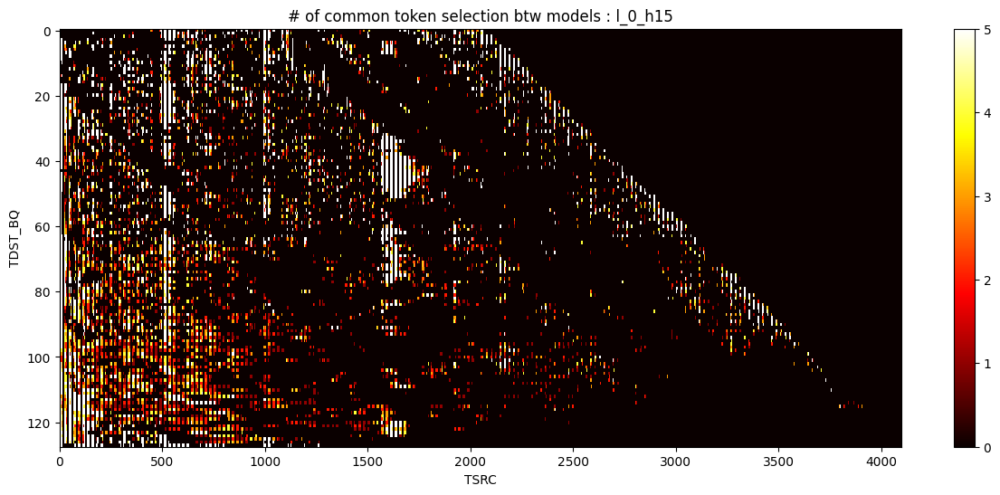

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


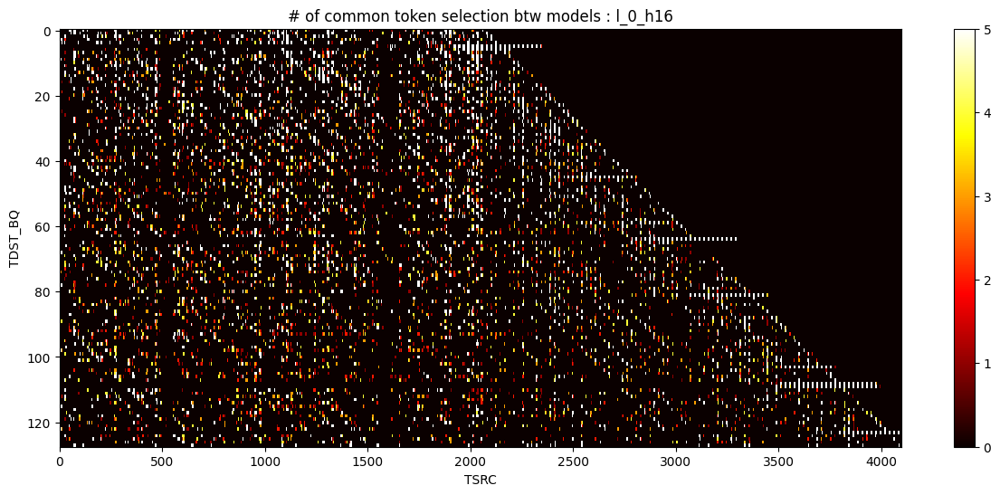

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 4., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


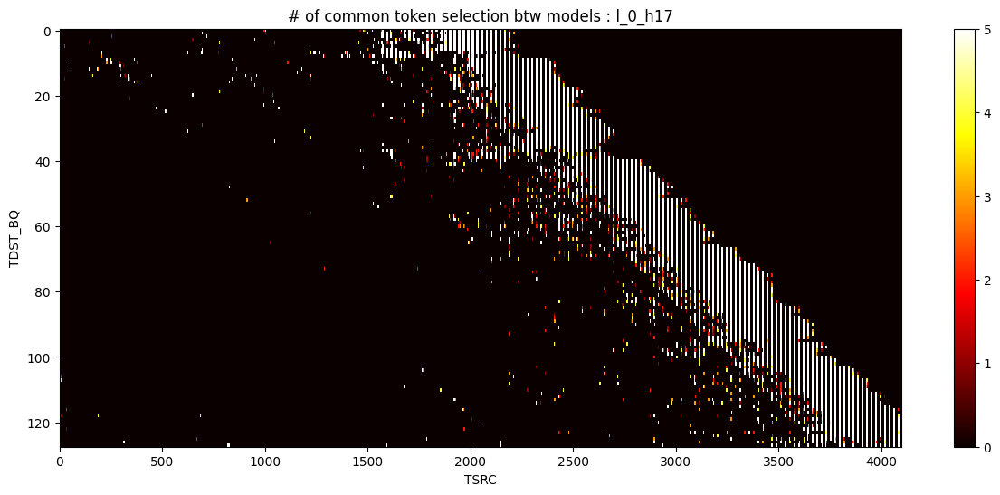

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


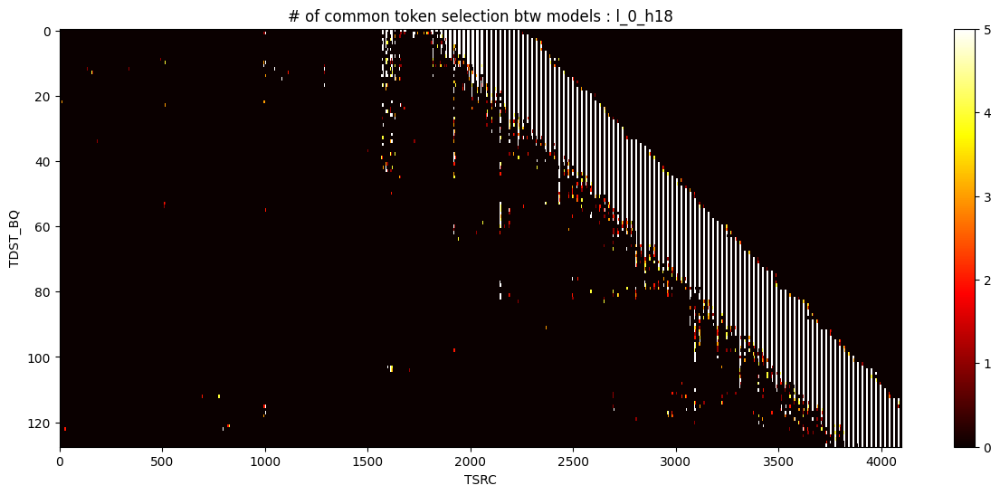

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


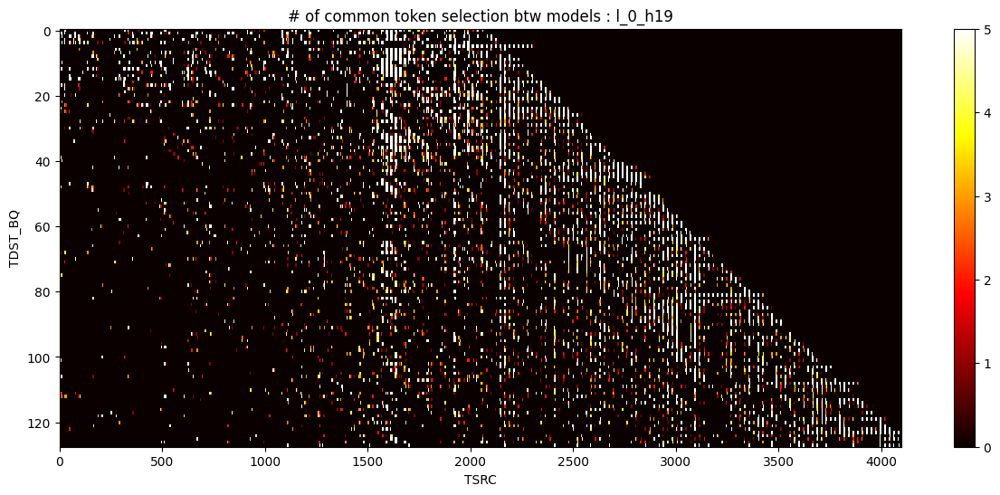

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


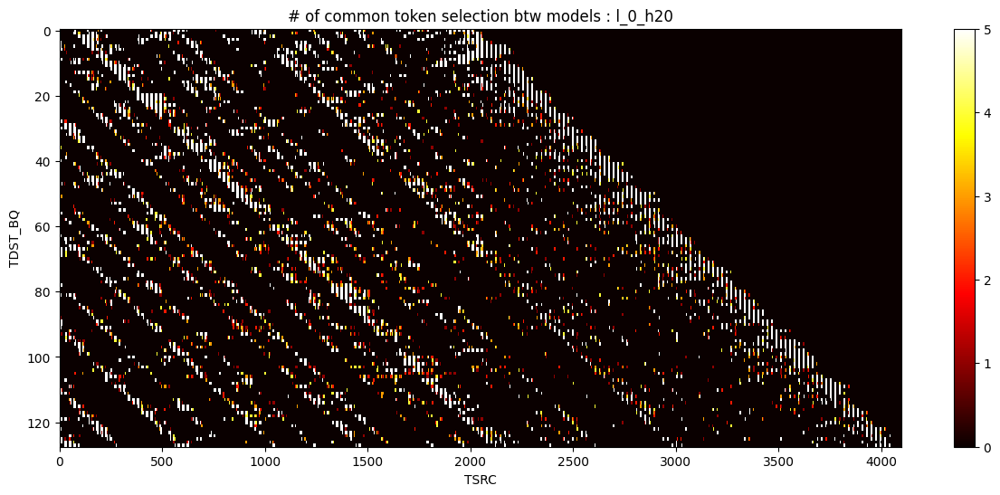

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


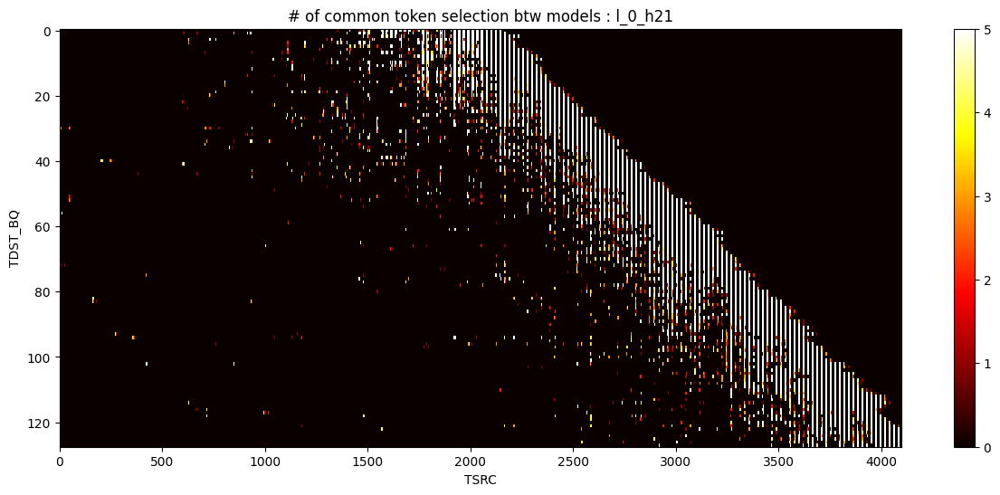

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


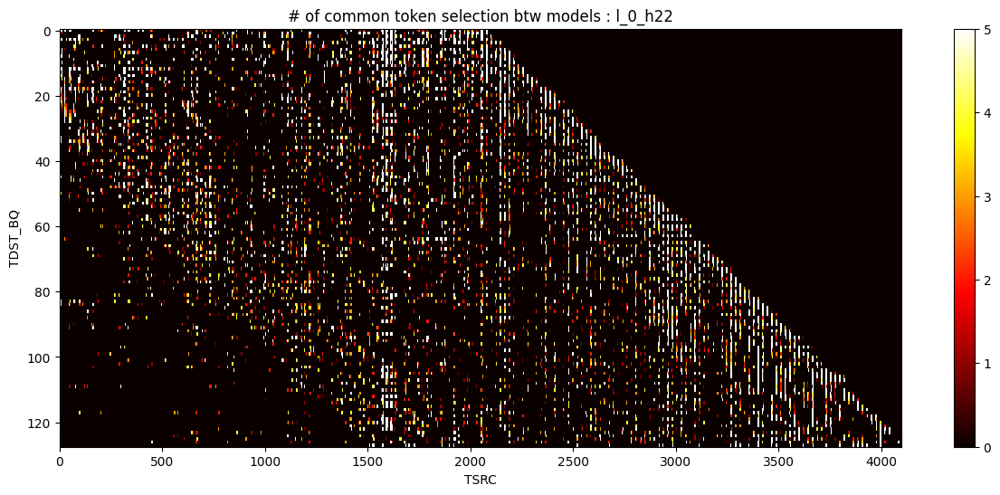

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


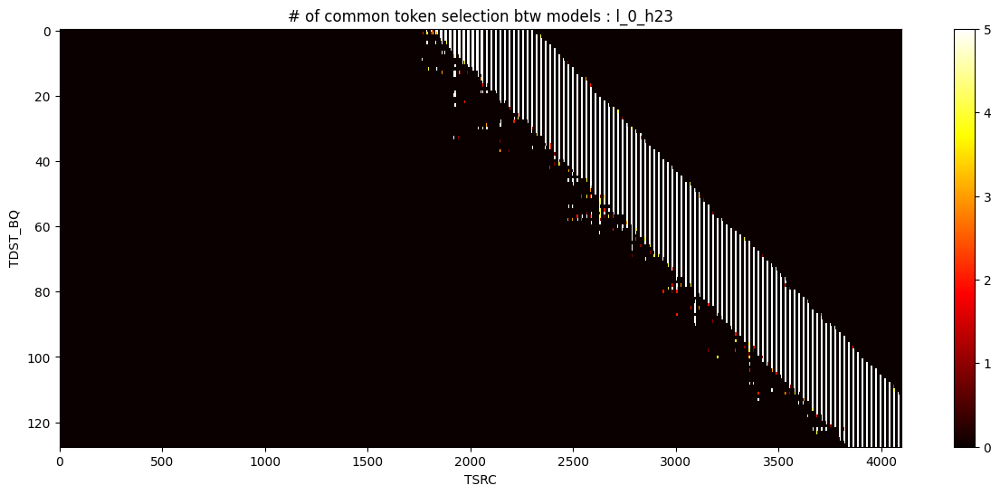

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


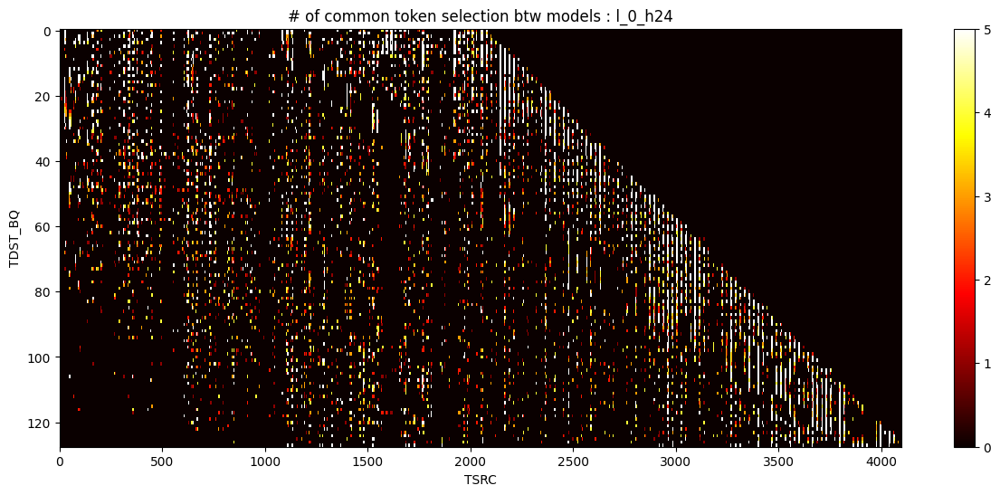

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


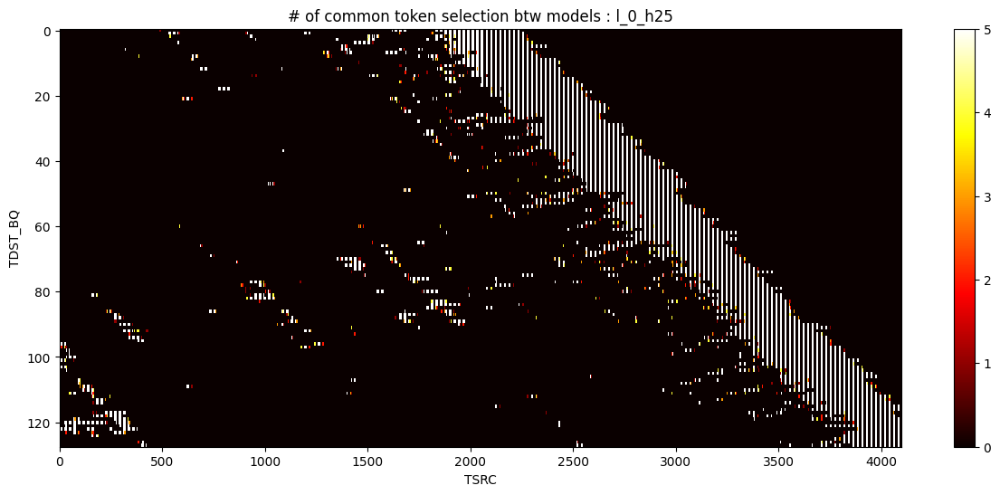

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


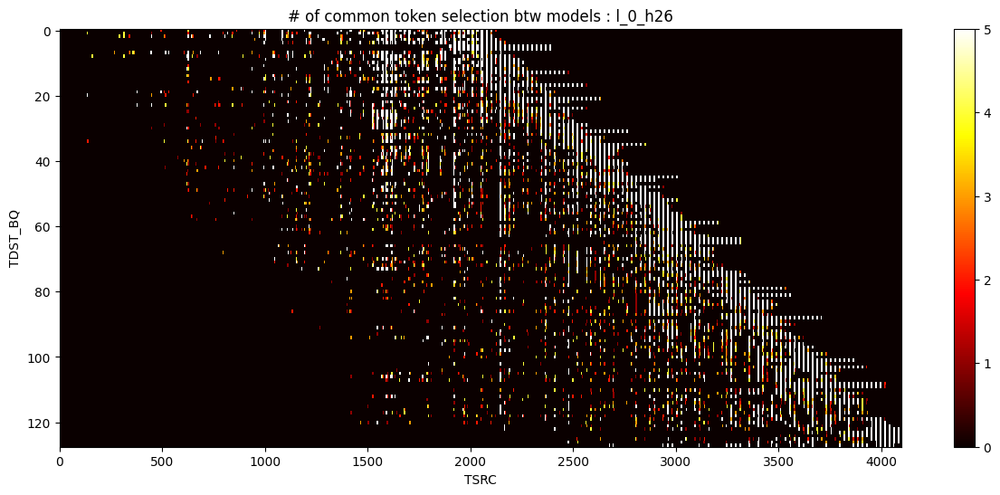

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


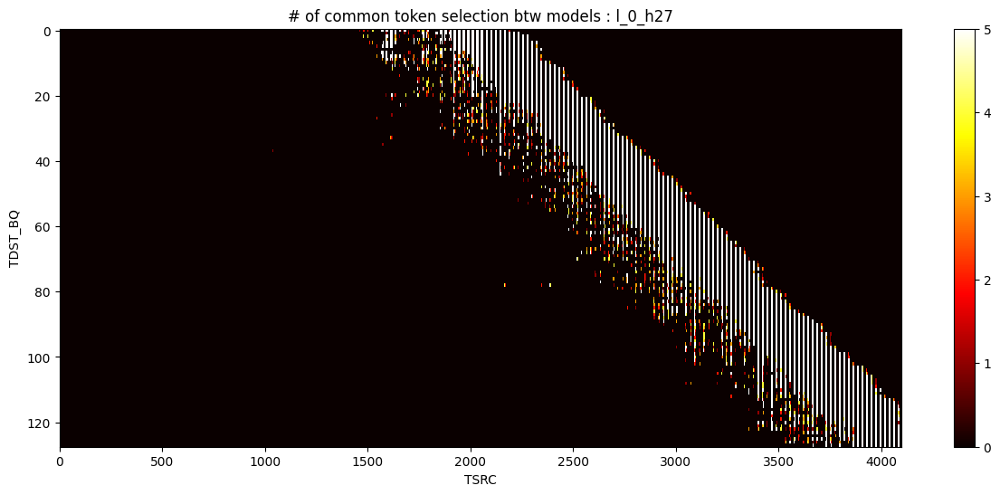

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


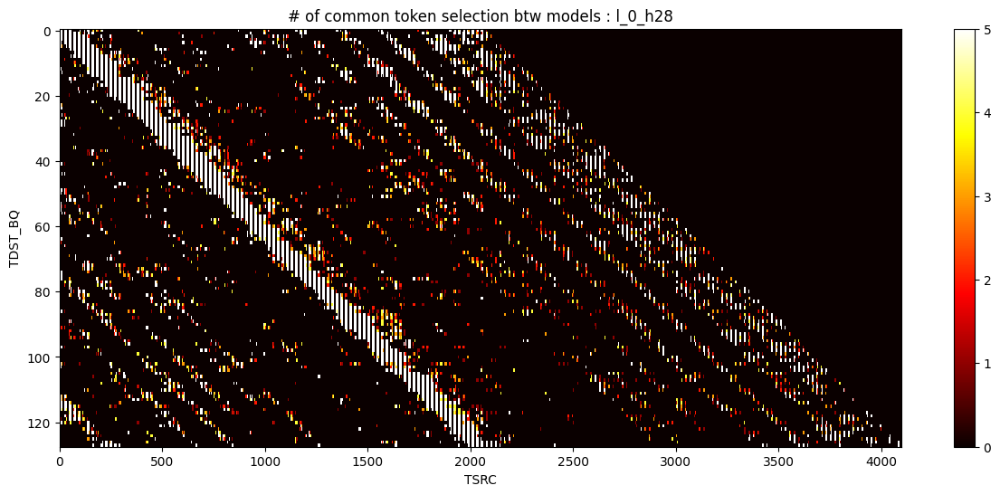

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


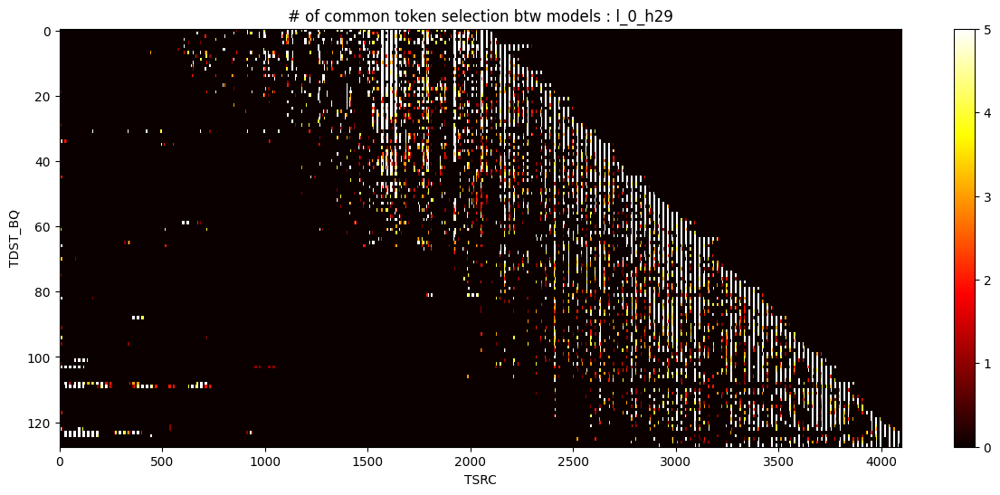

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


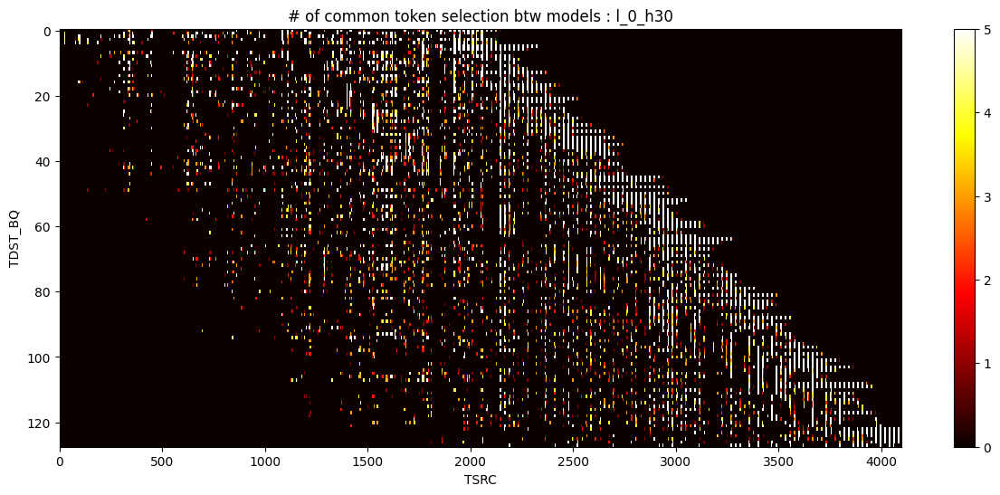

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 1., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


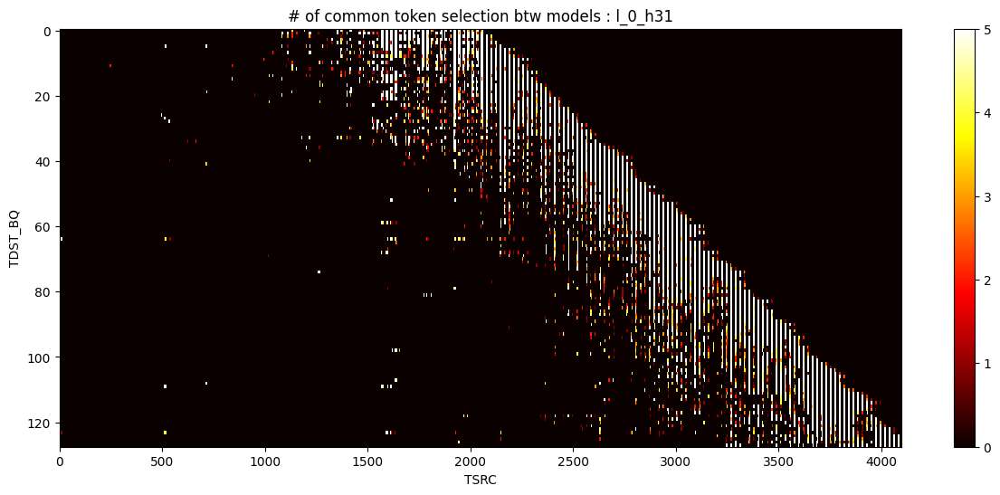

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


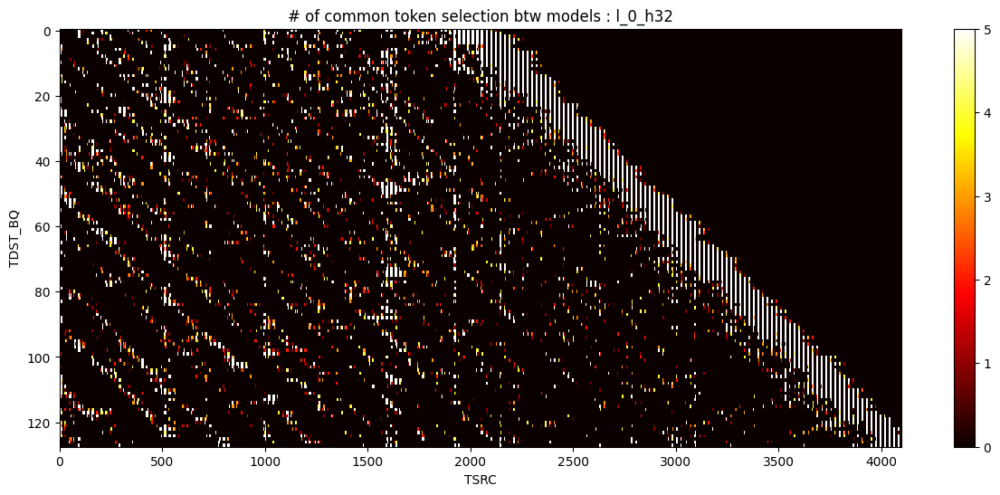

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


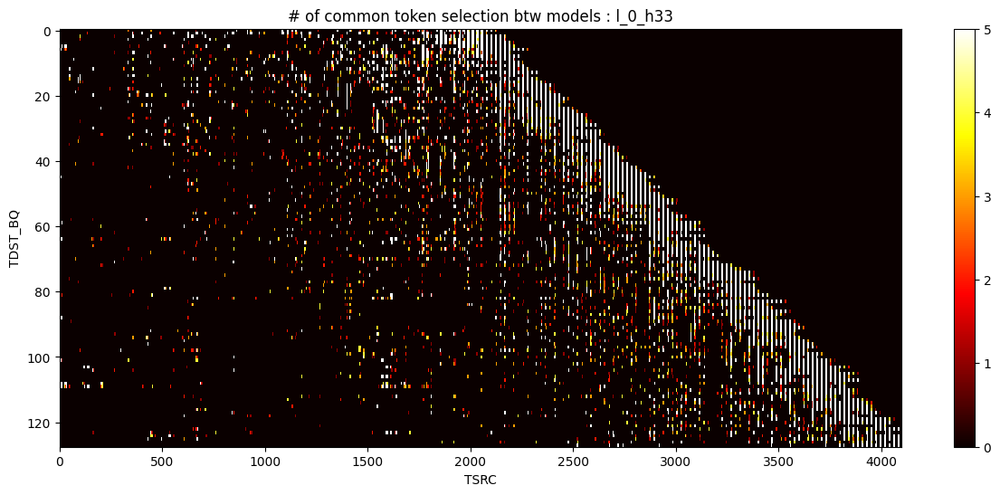

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


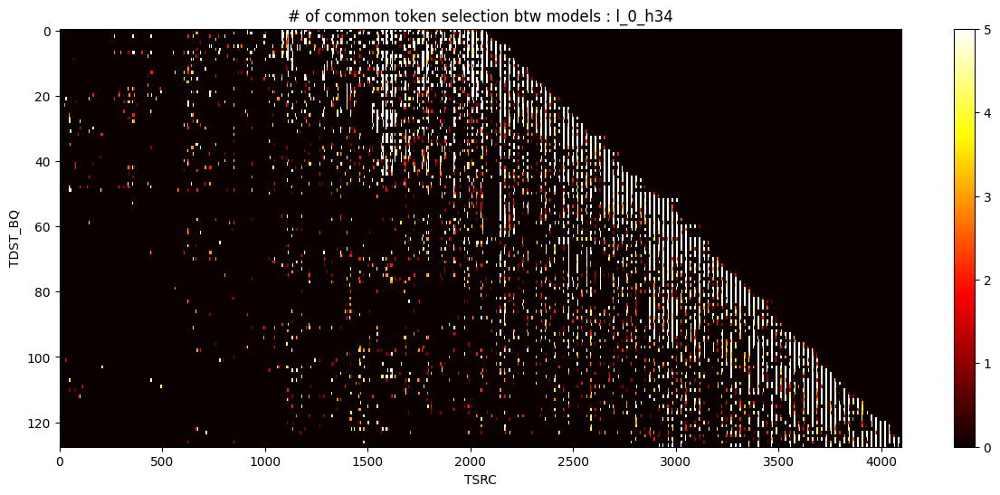

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


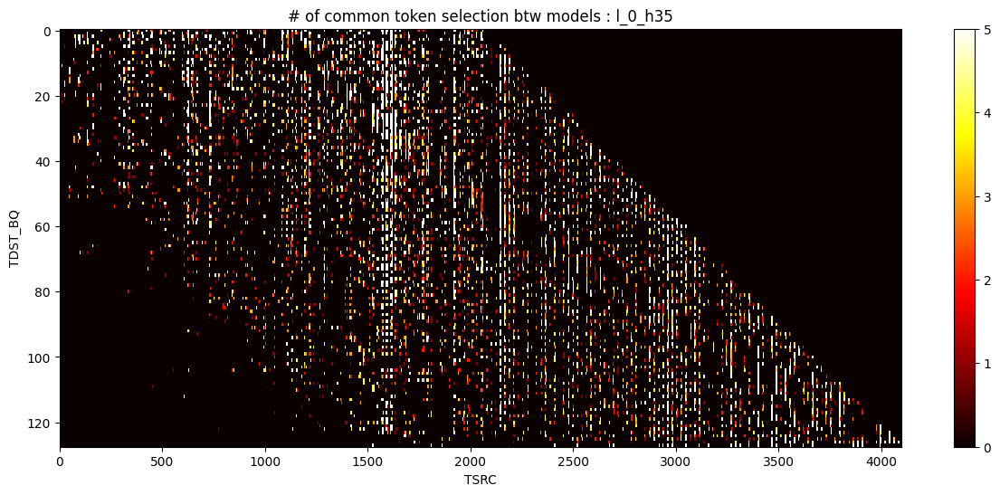

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


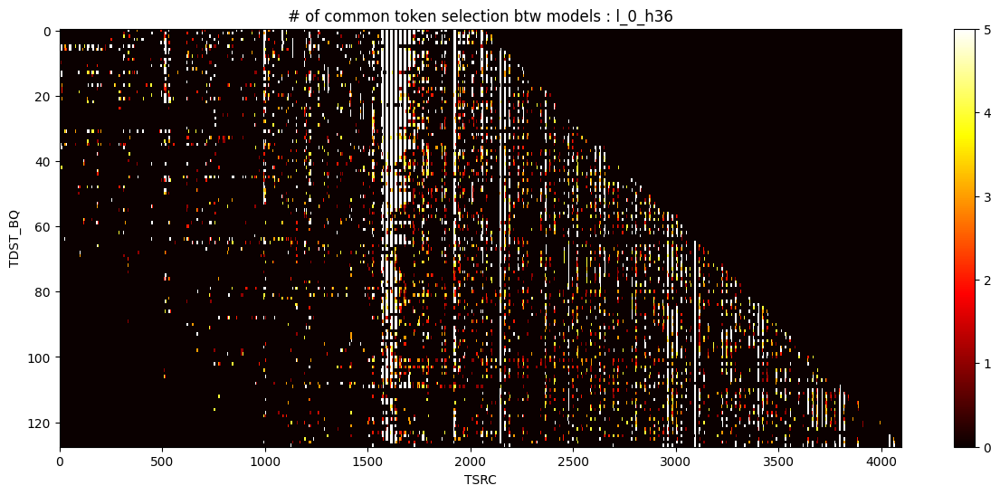

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


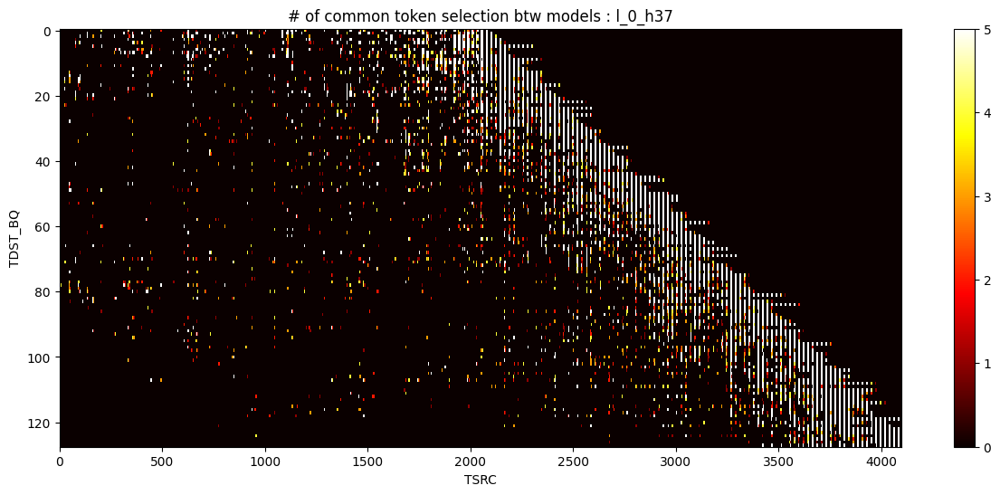

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


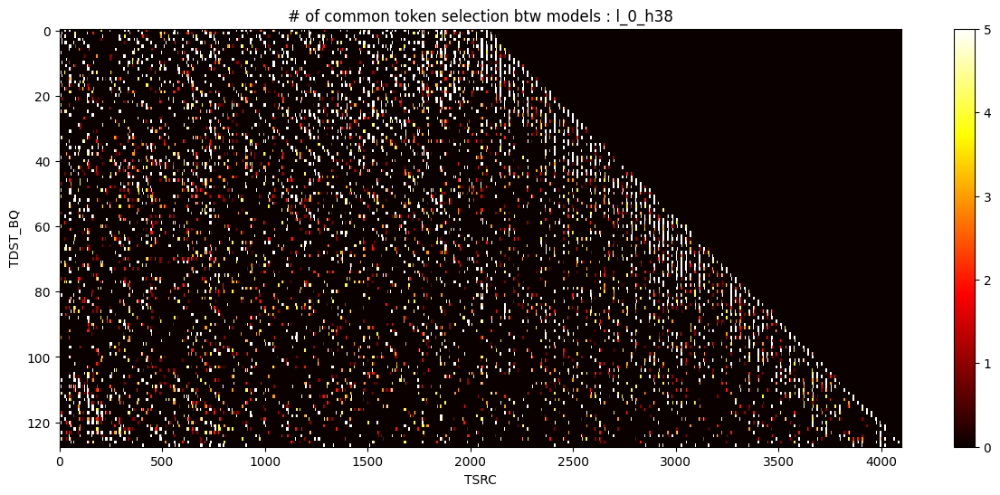

plot h :  {}
N hardcoded to : N=1
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.],
        [0., 0., 0.,  ..., 0., 5., 0.]])


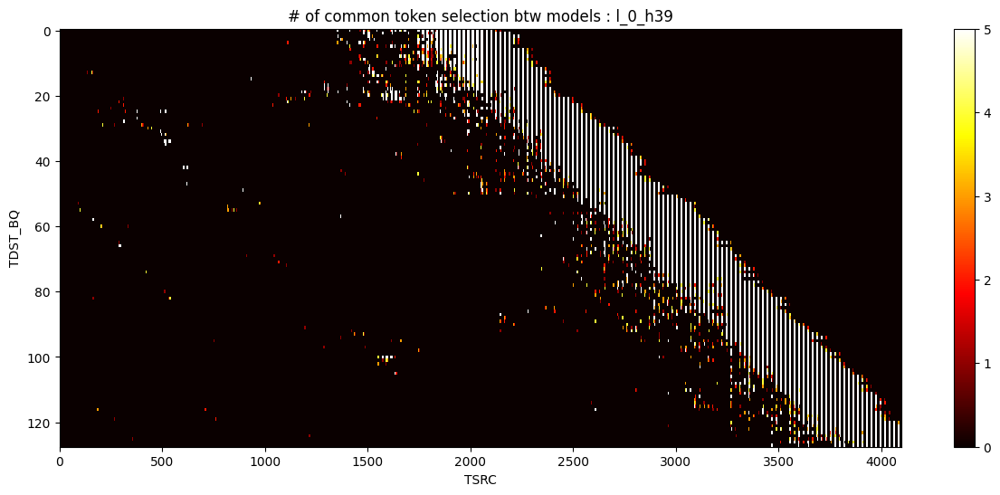

In [16]:
plot_per_layer(0)


plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


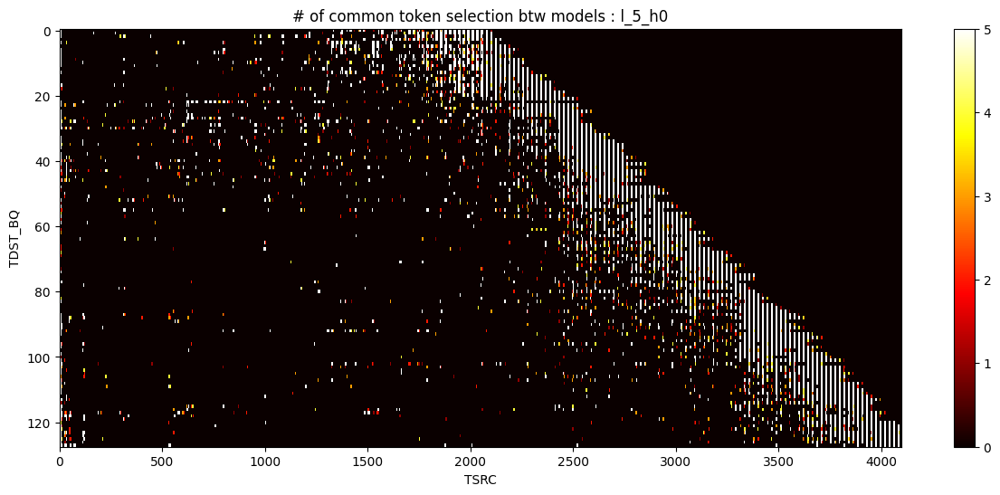

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


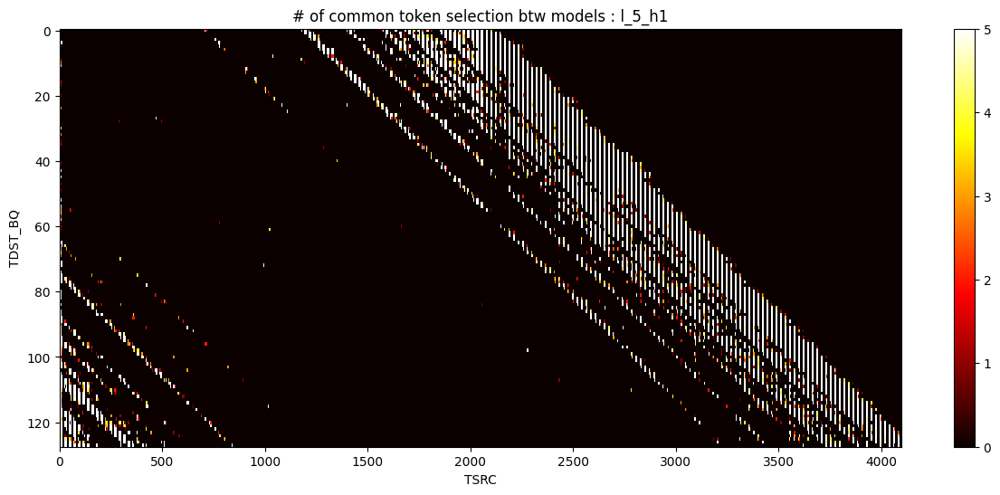

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


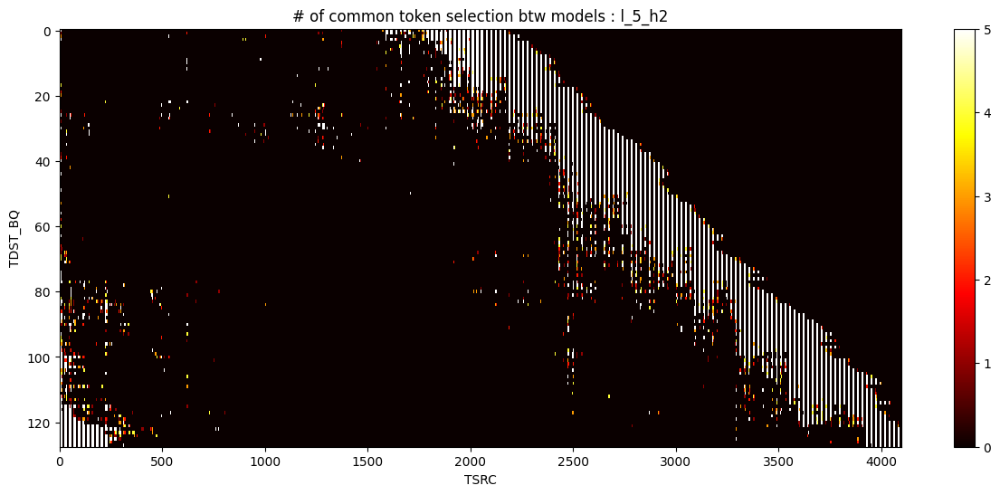

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


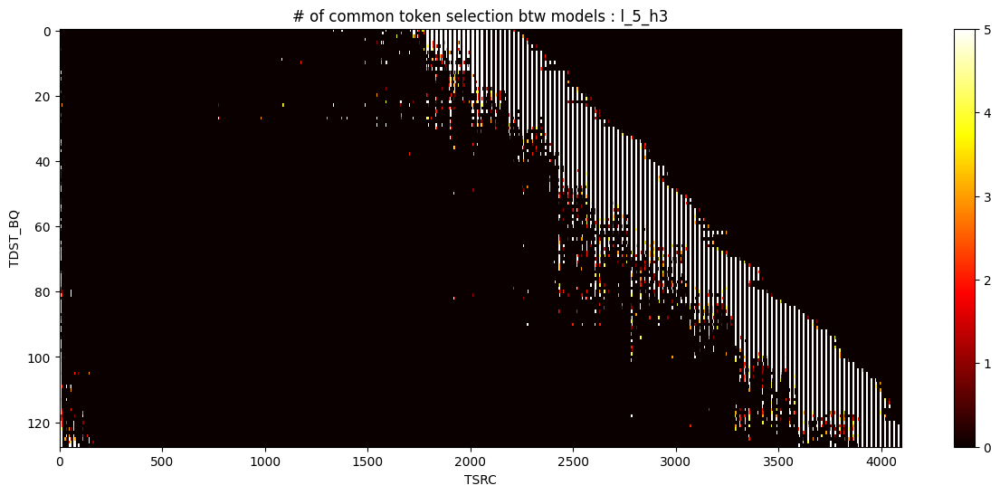

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


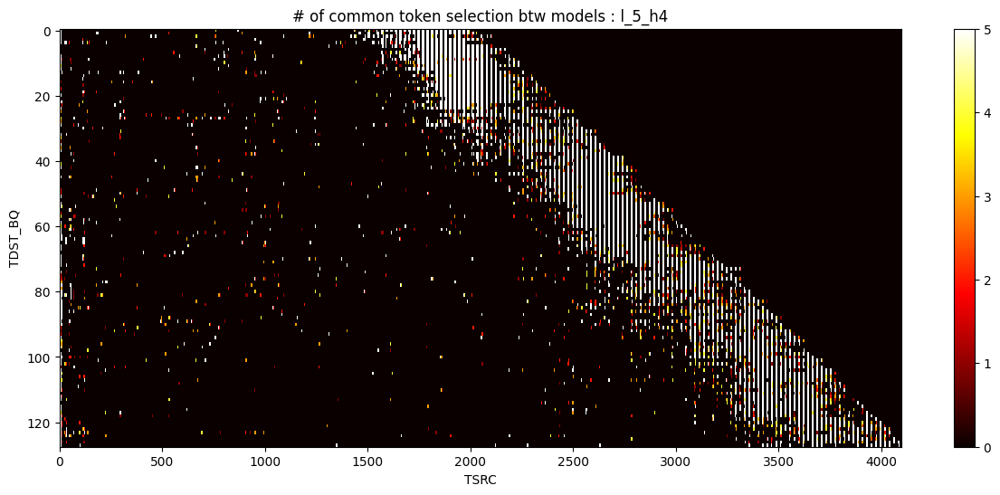

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


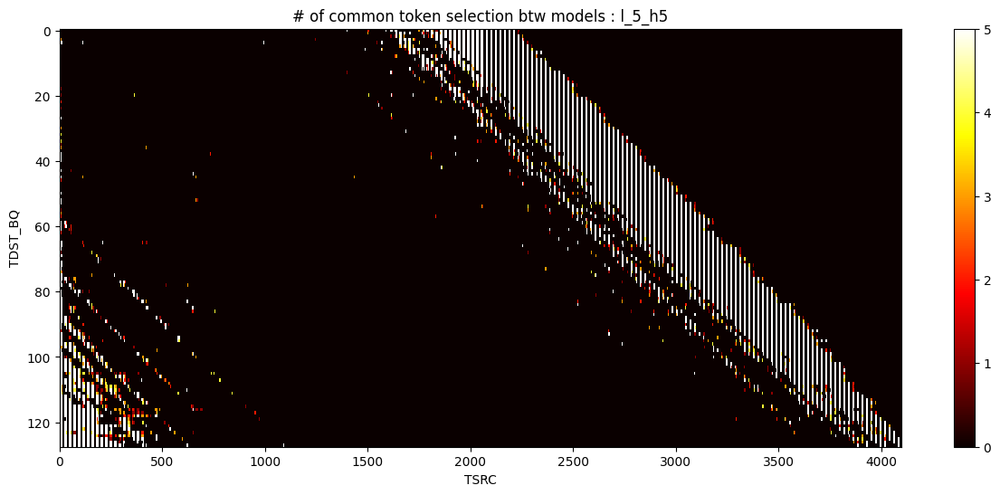

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


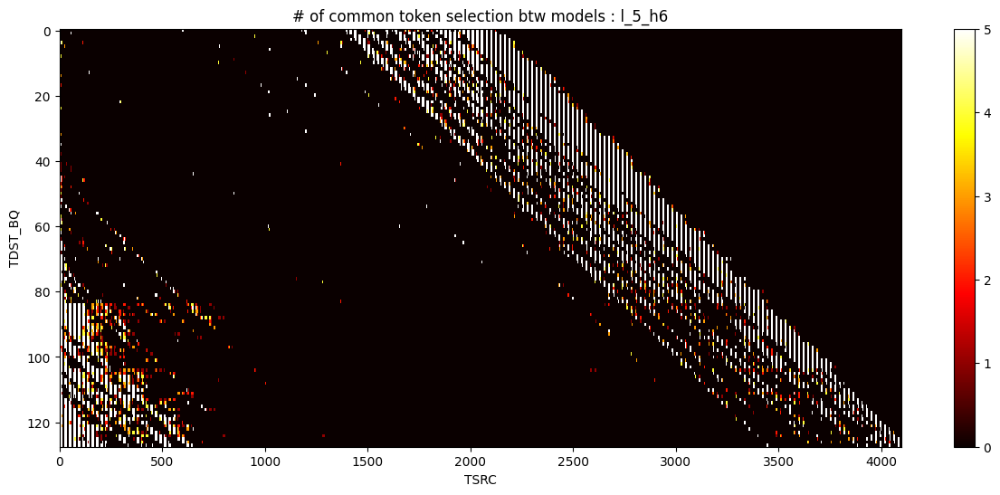

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


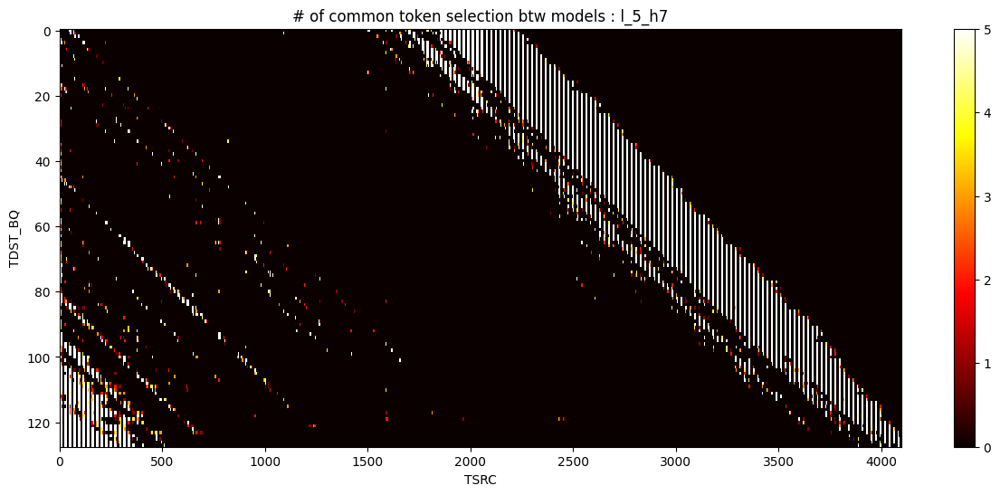

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


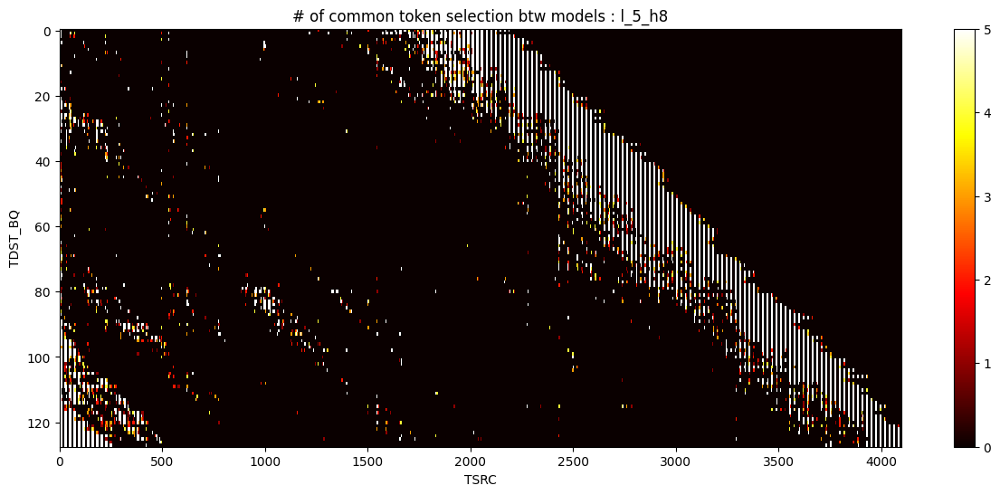

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


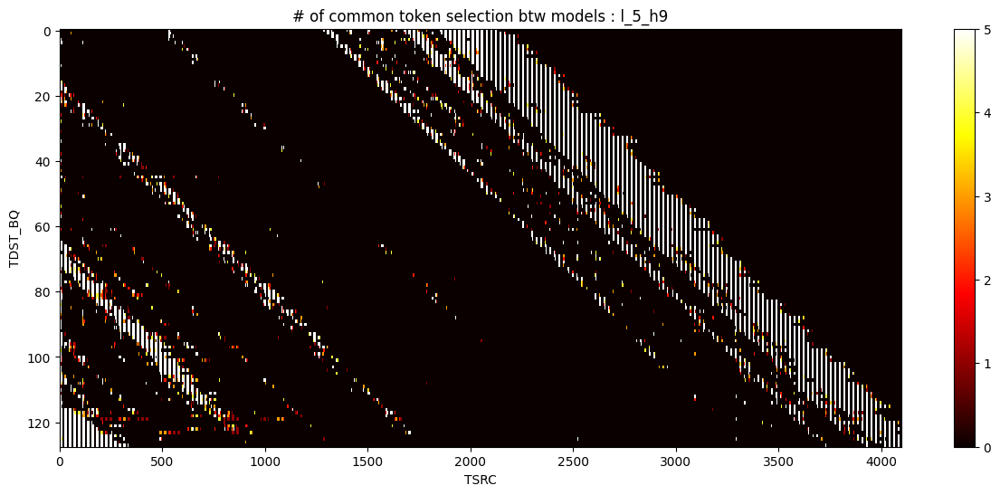

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


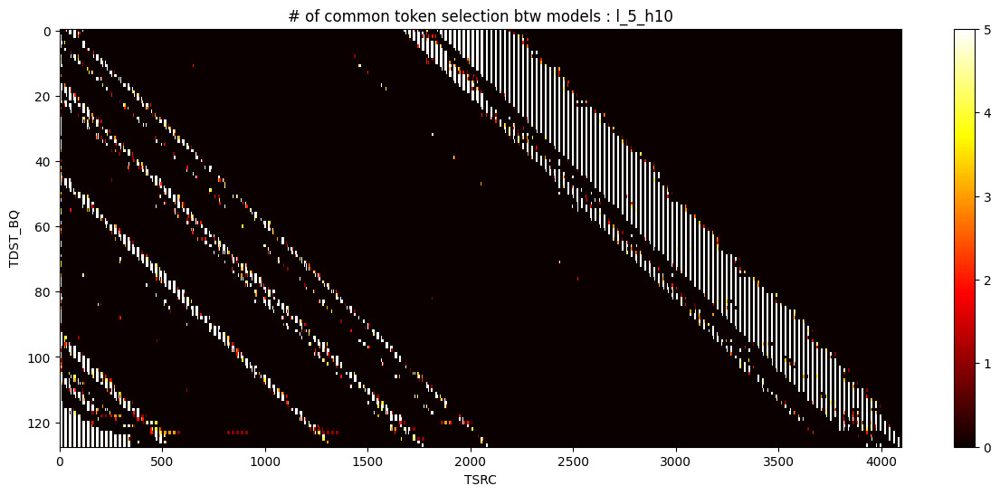

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


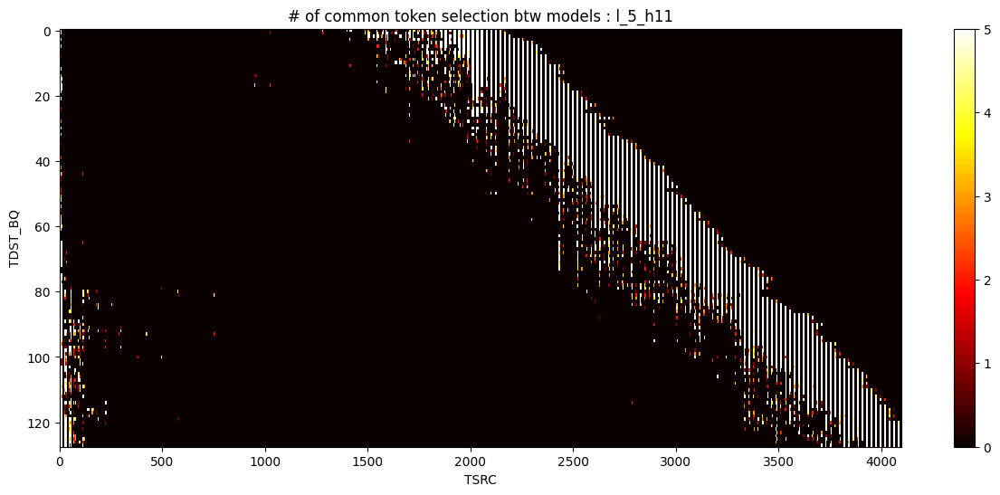

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


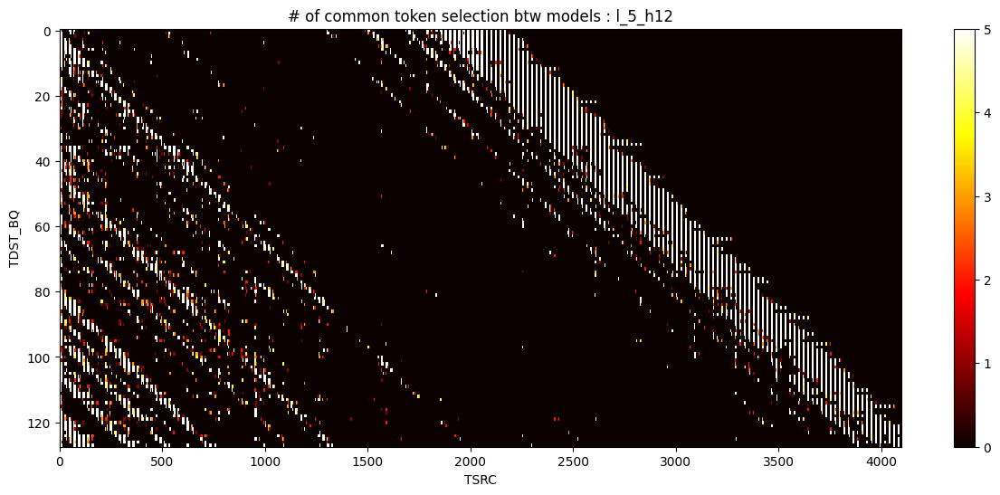

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


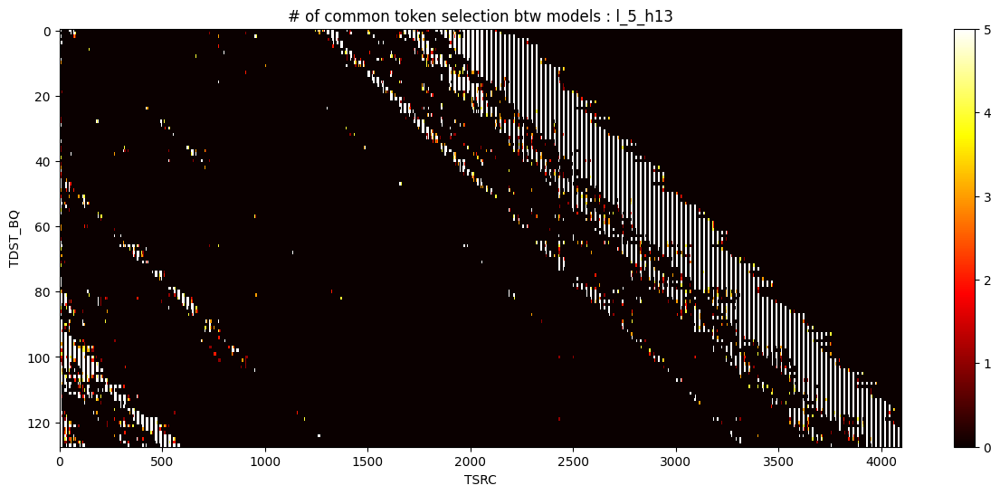

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.]])


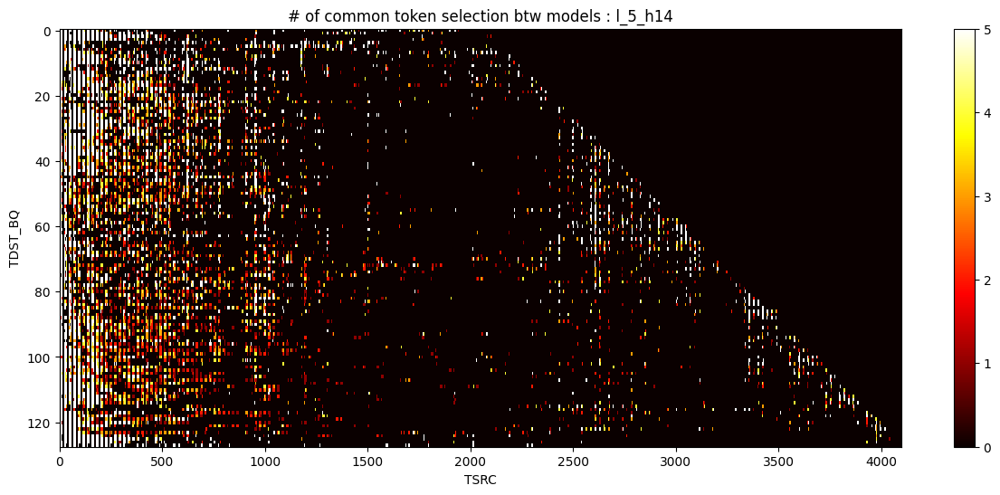

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


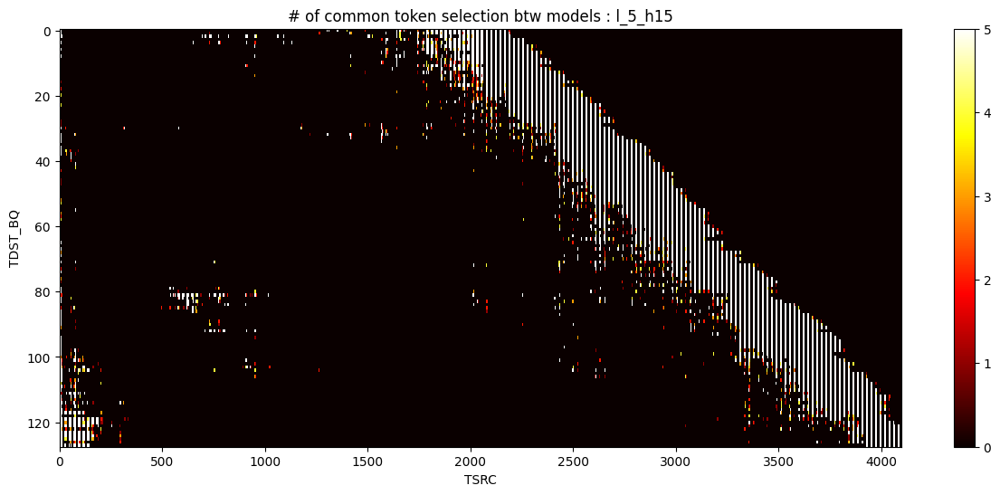

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 2., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


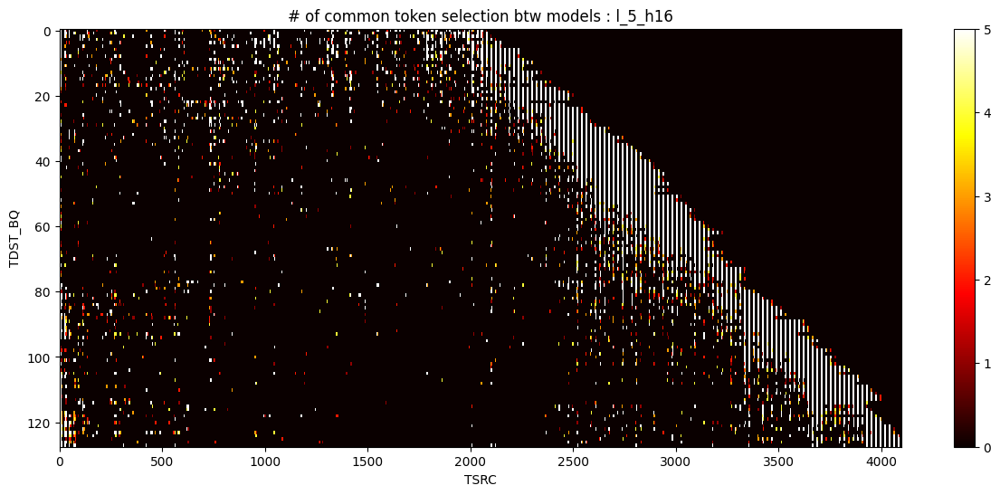

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


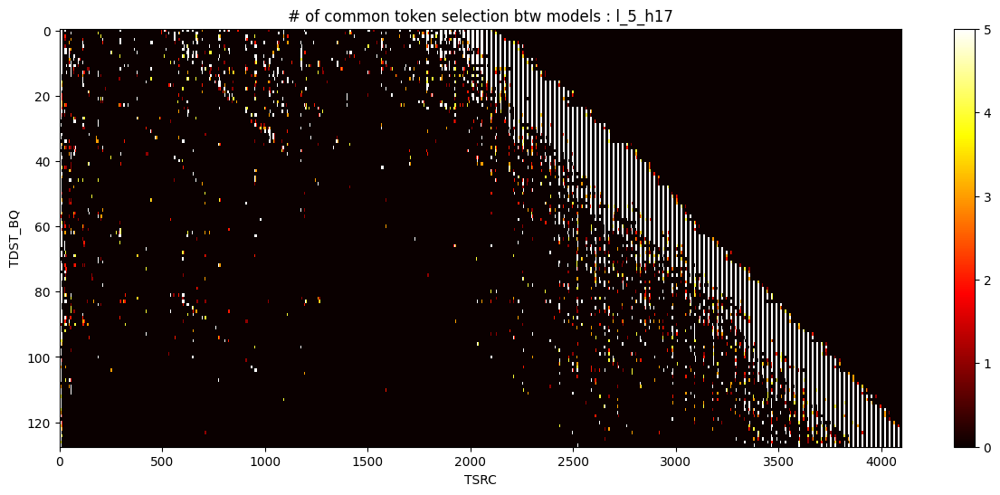

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


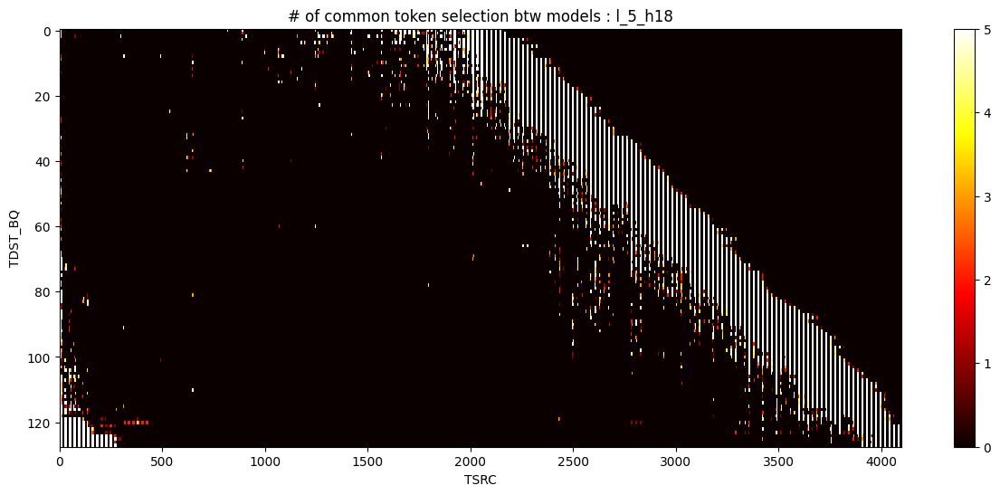

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


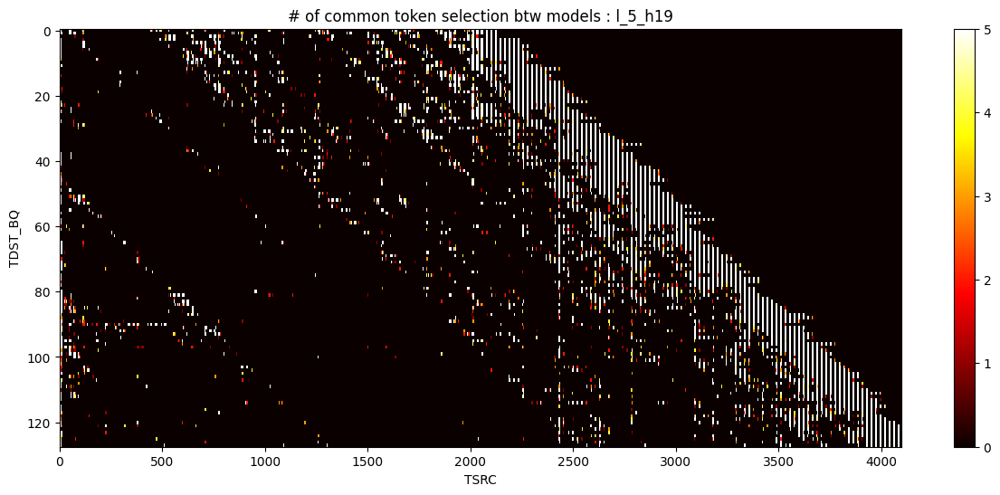

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


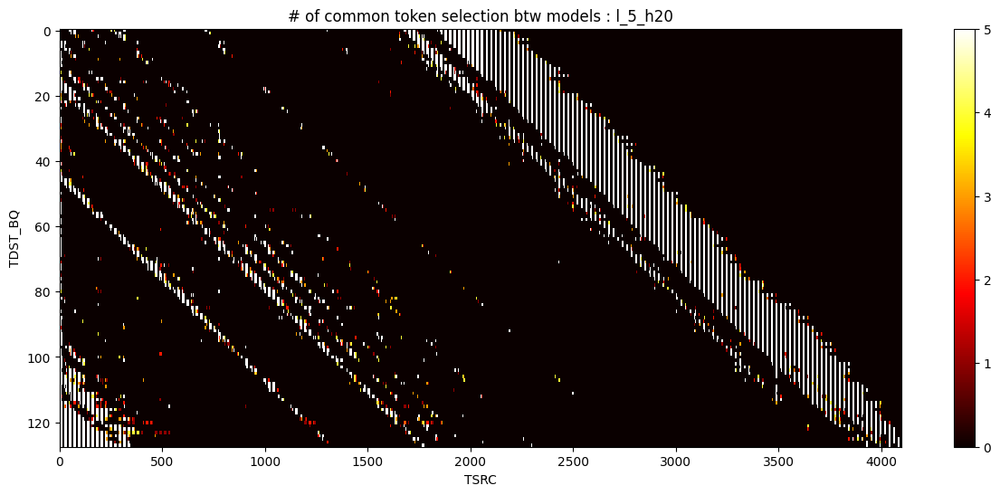

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


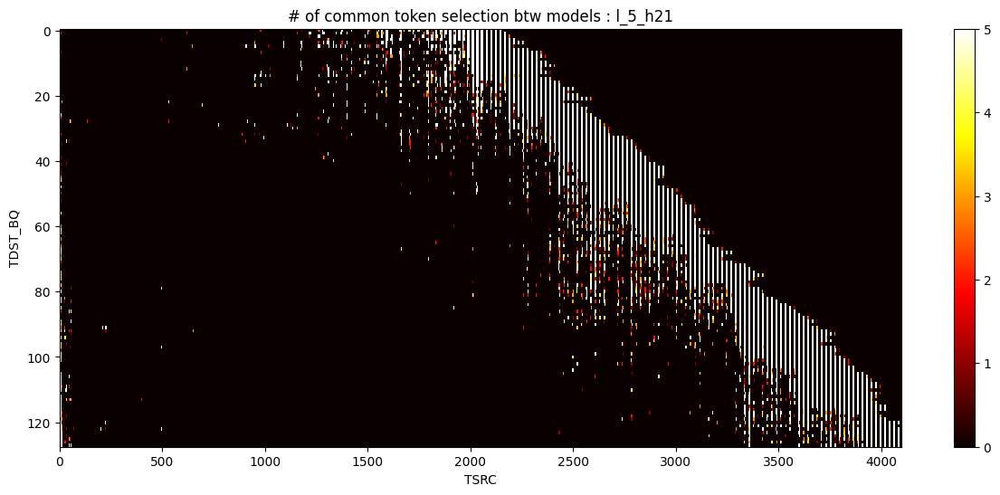

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


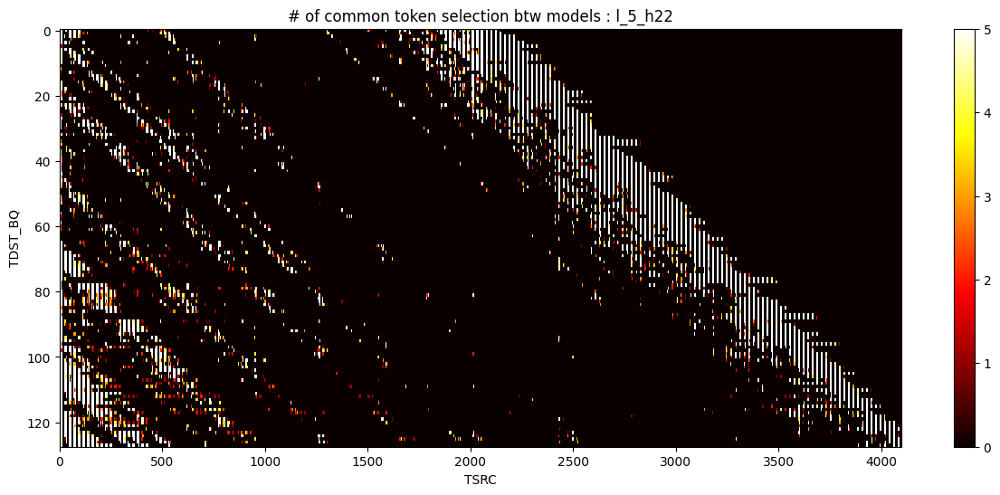

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


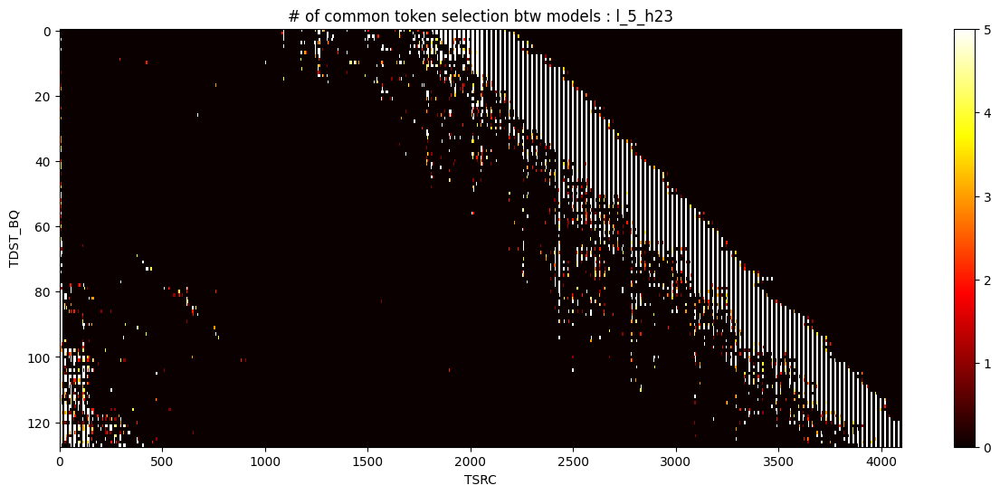

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


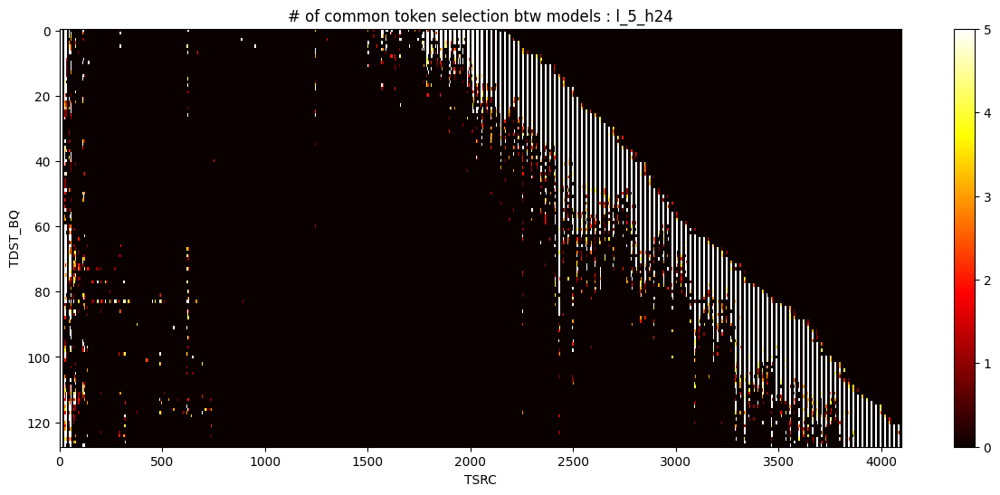

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


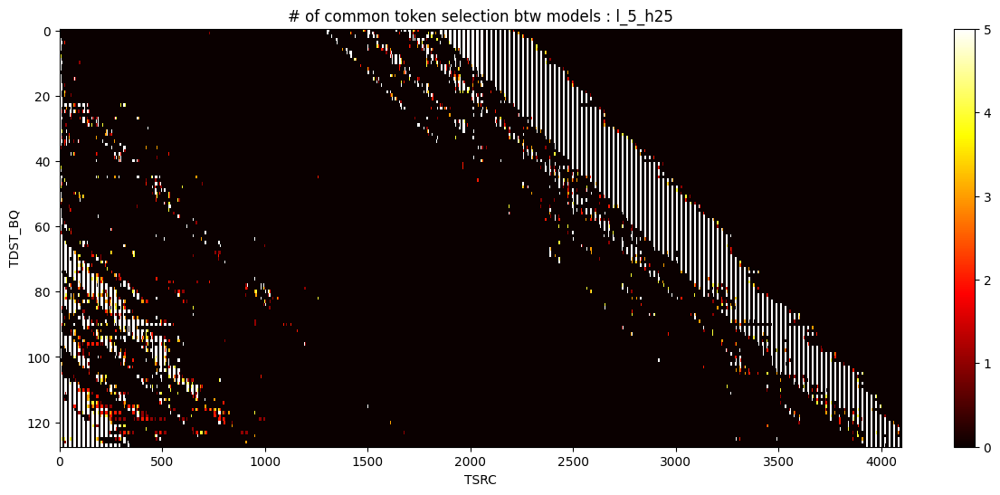

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


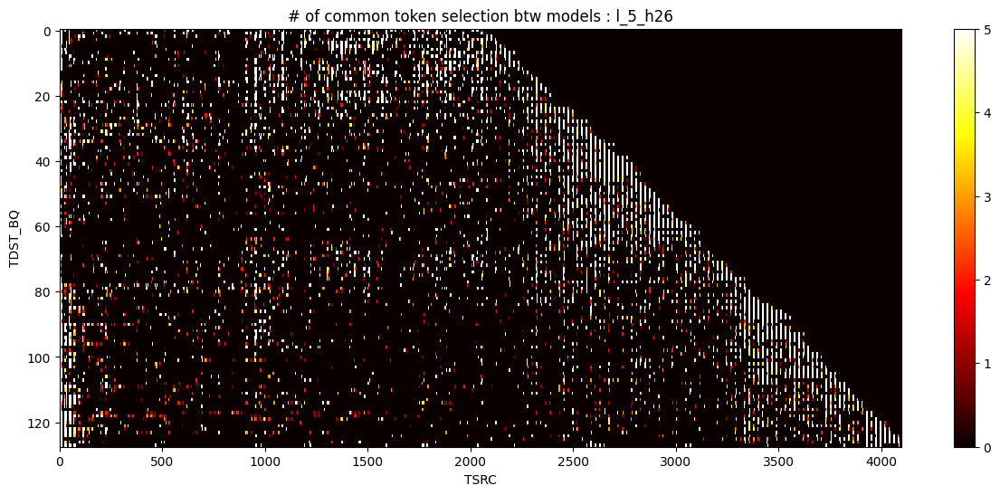

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.]])


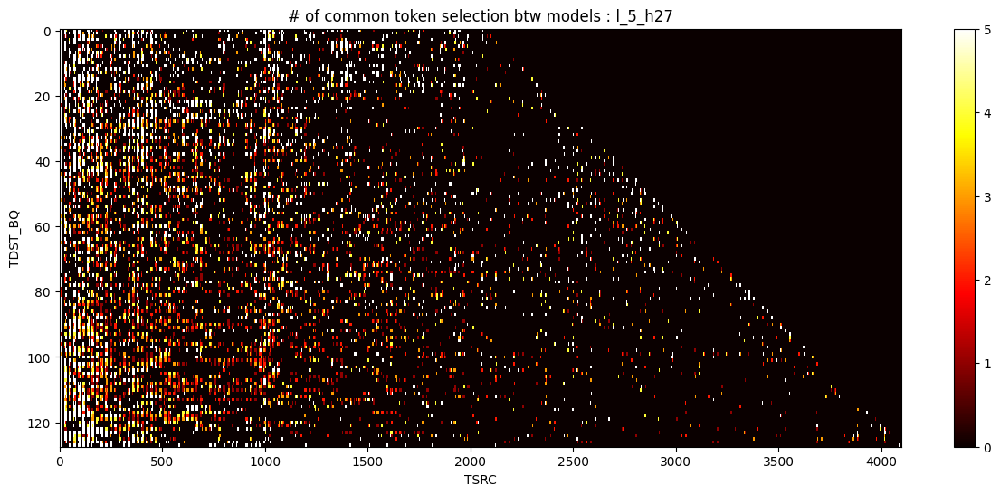

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.]])


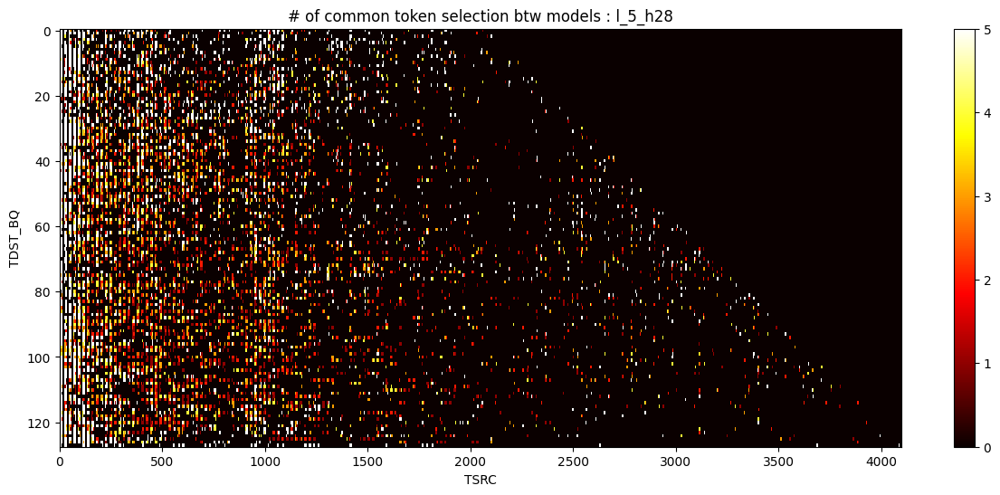

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


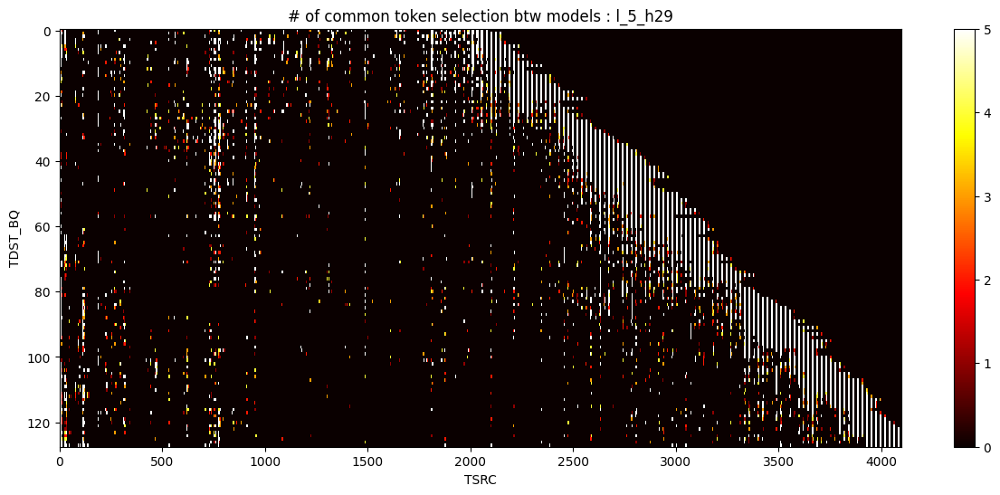

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


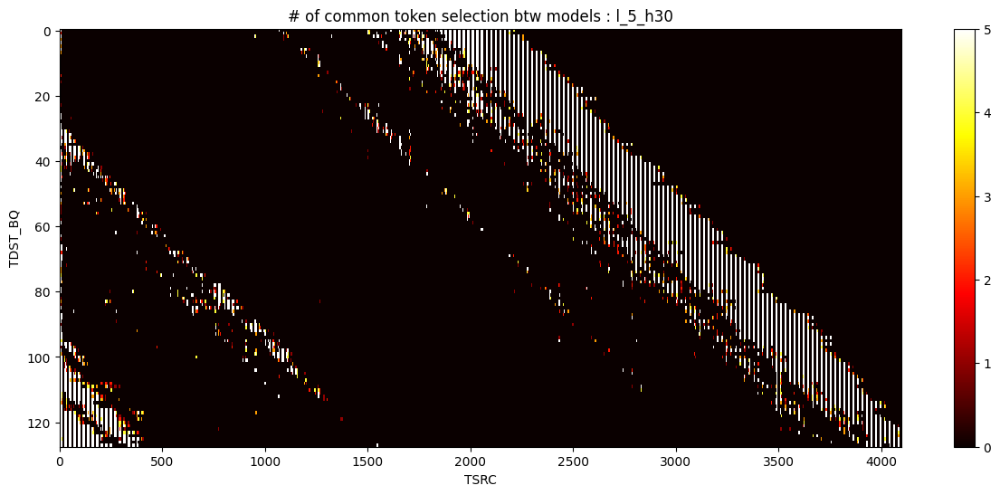

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


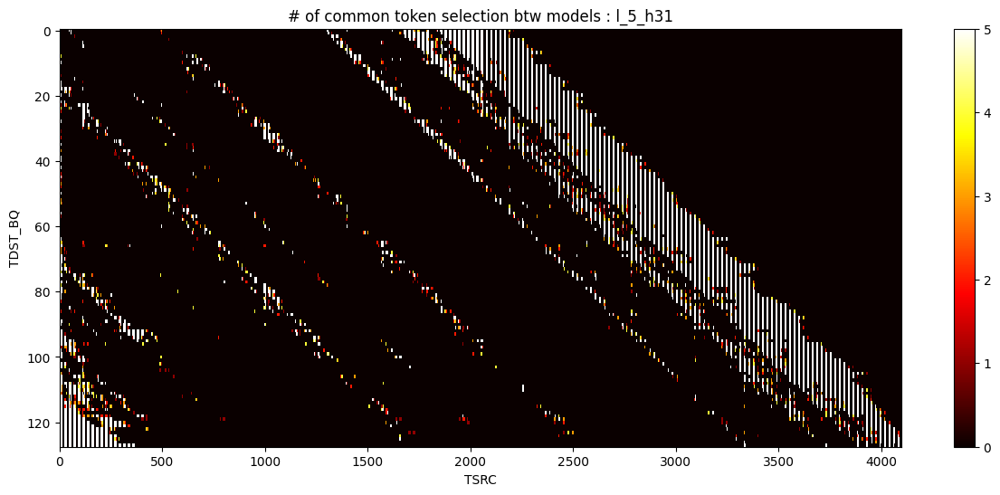

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


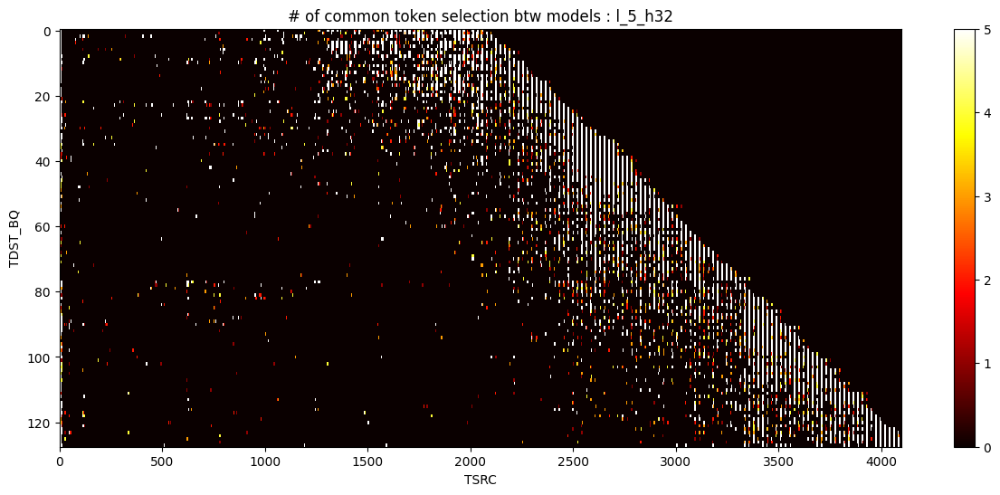

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


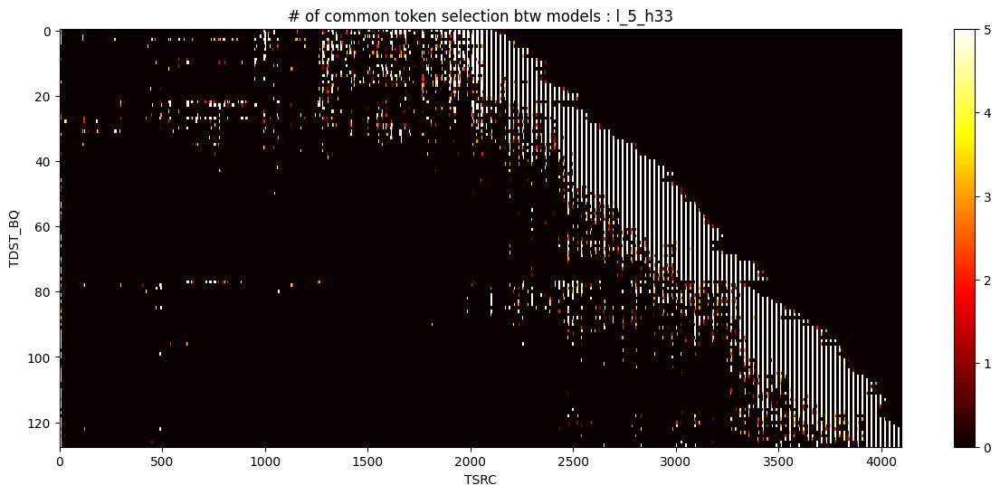

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


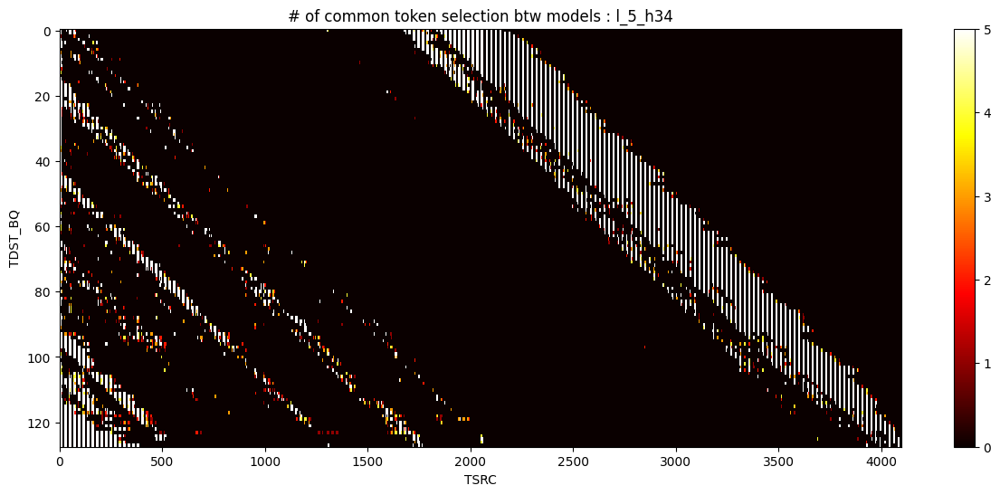

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


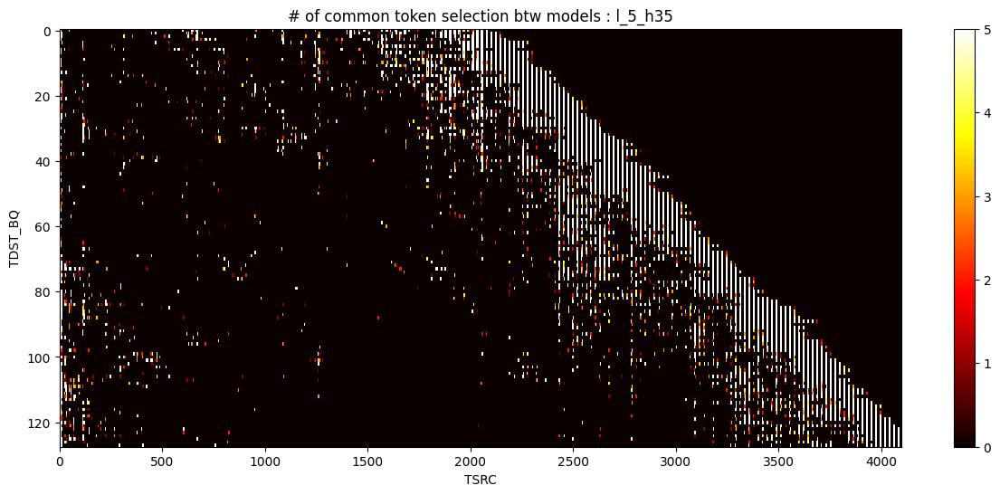

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


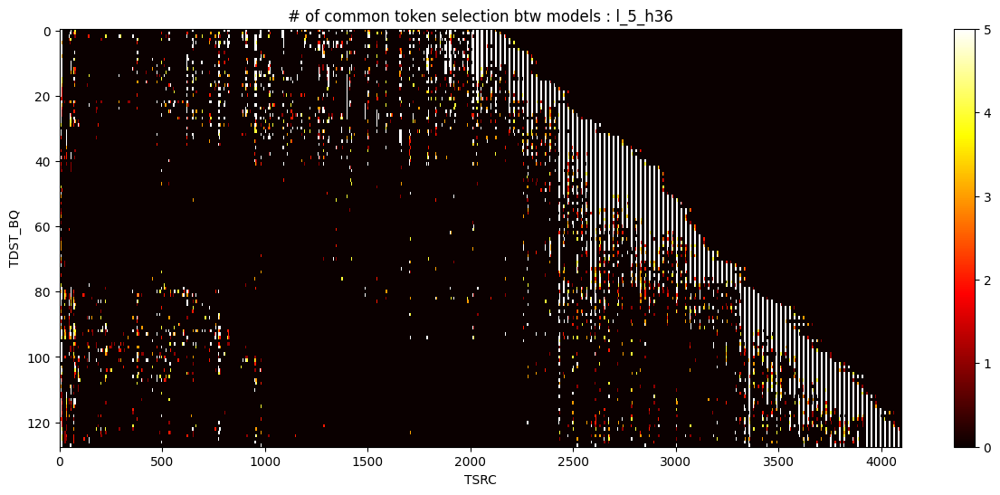

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


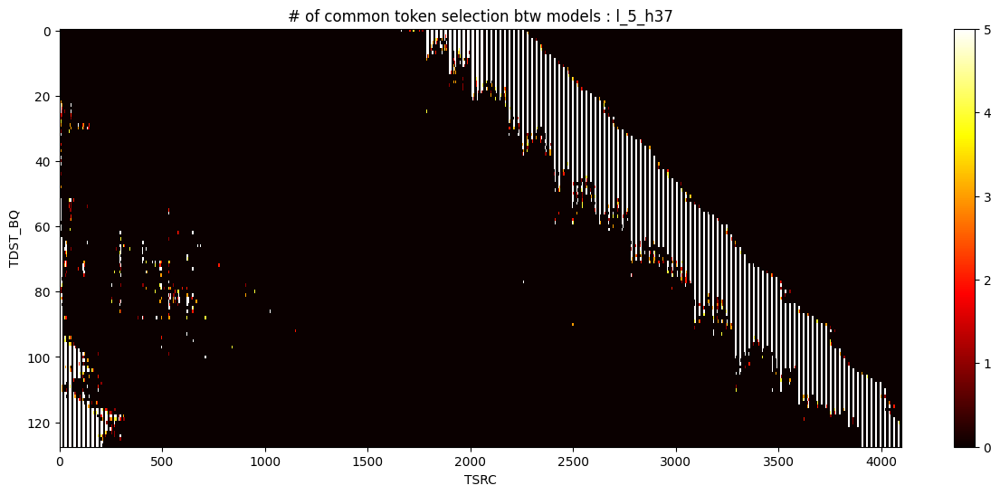

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


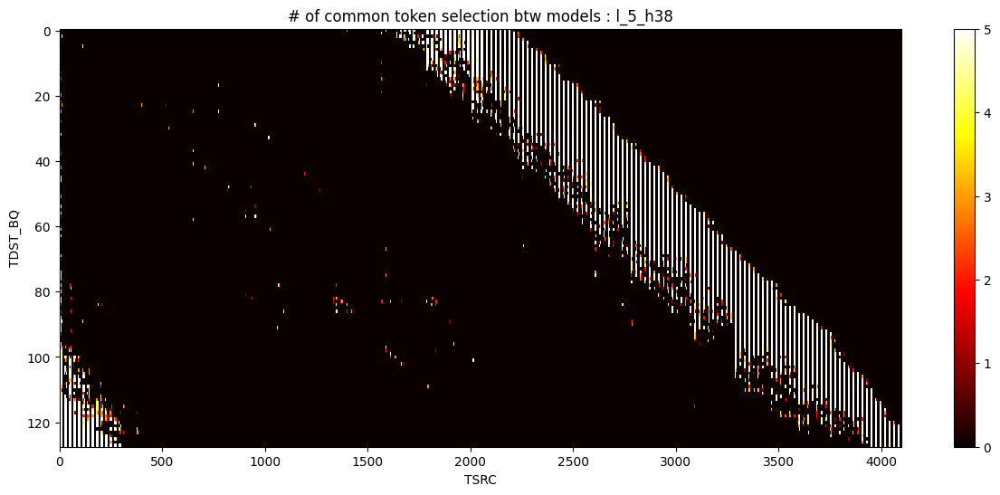

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


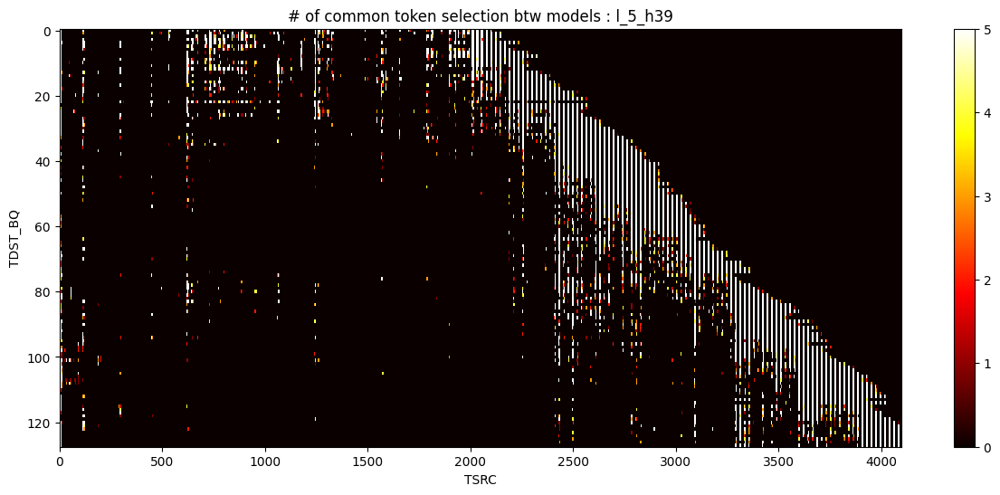

In [11]:
# for i in [0]: # , 5, 20, 30, 39
plot_per_layer(5)

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


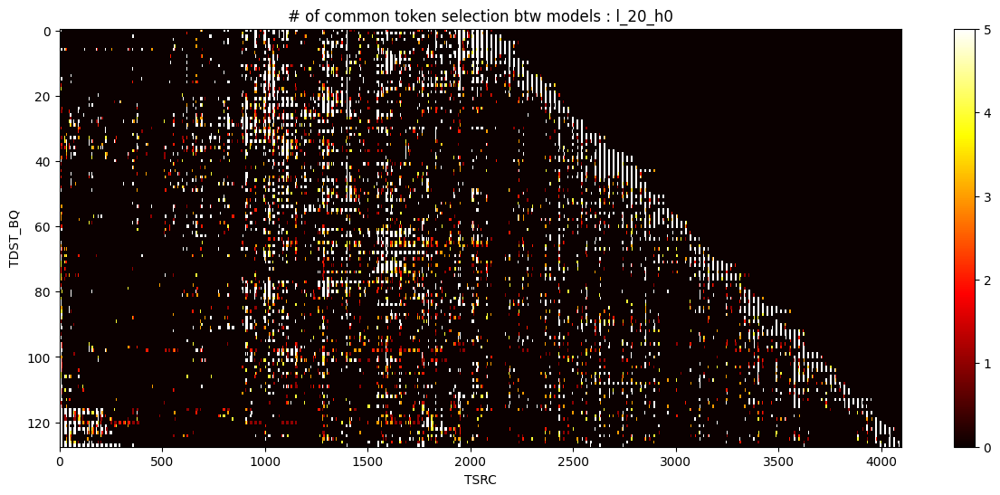

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


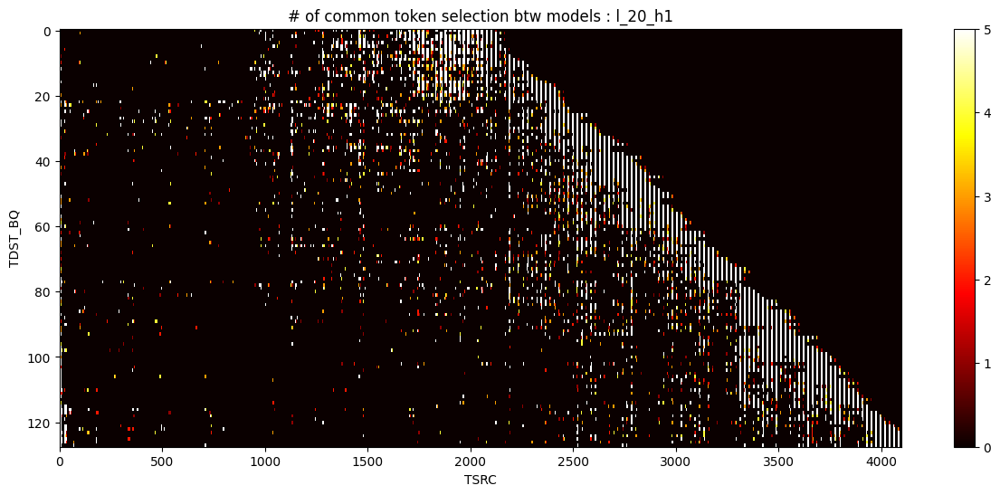

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


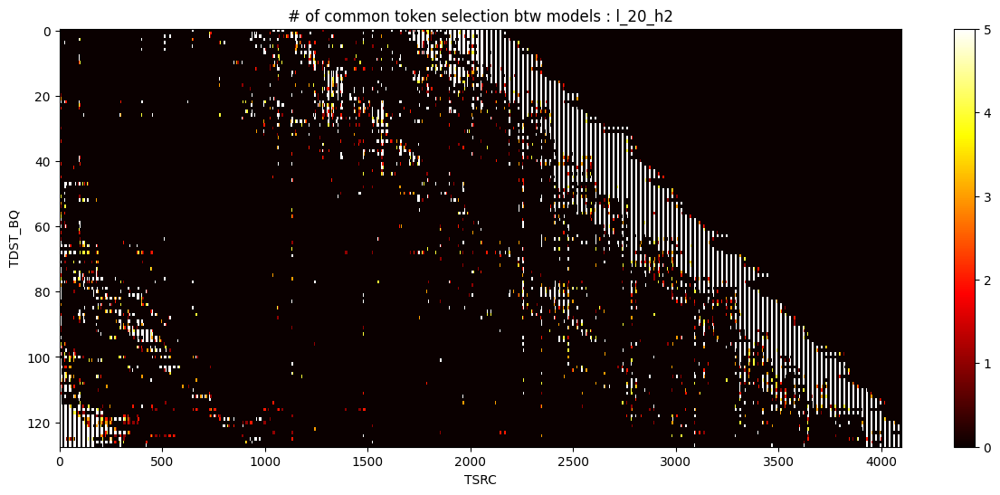

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


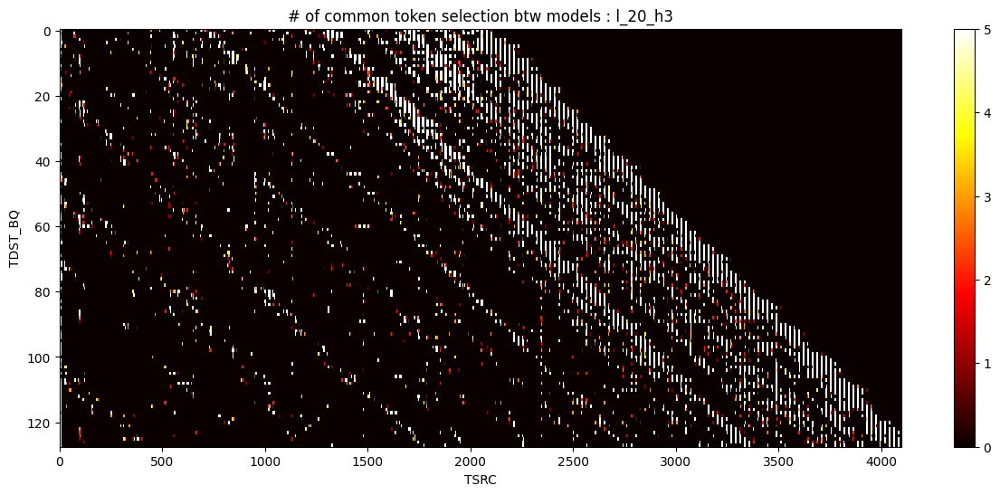

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


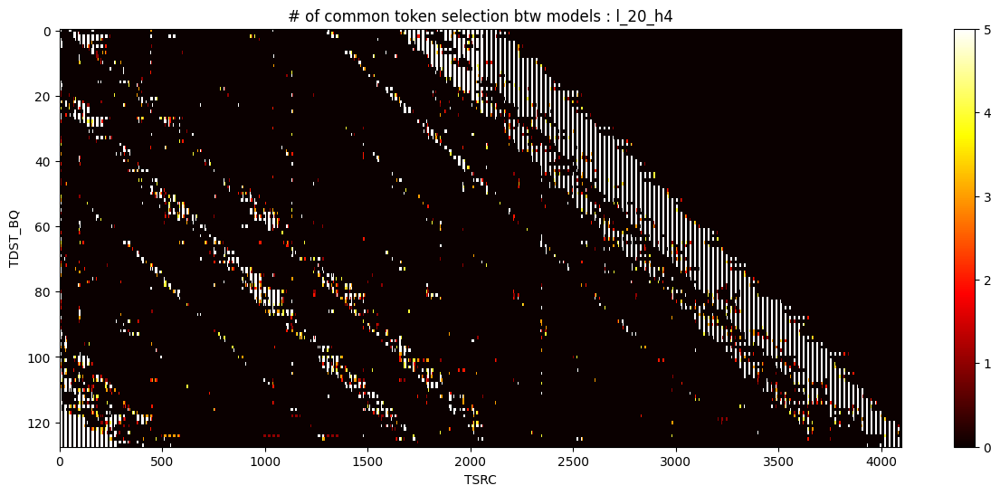

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


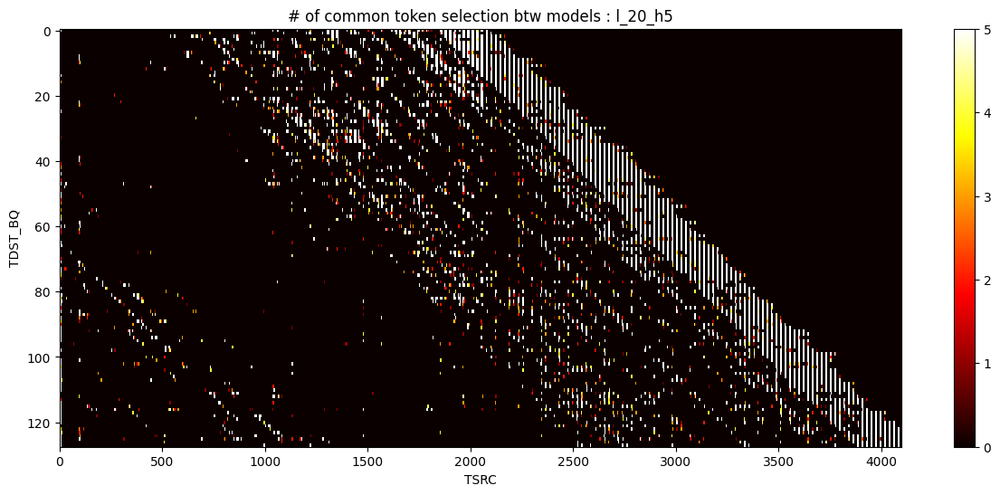

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


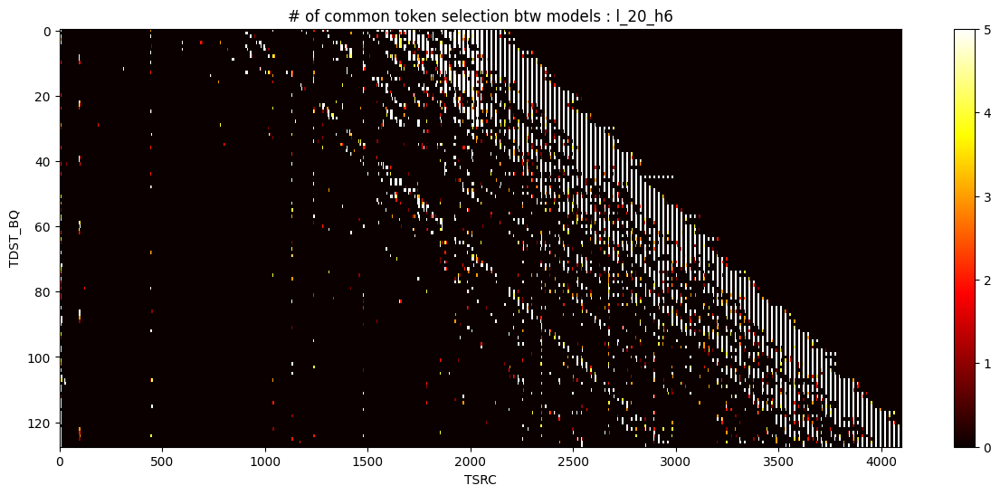

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


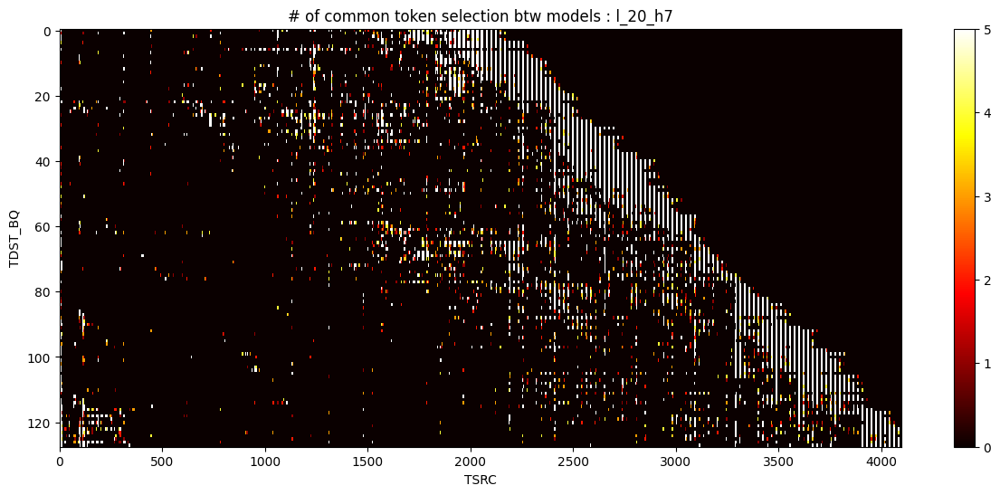

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


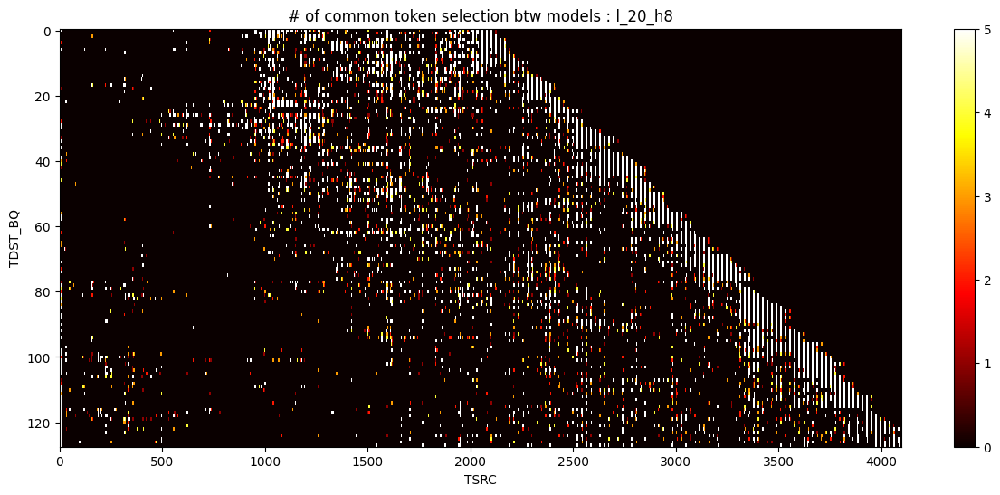

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


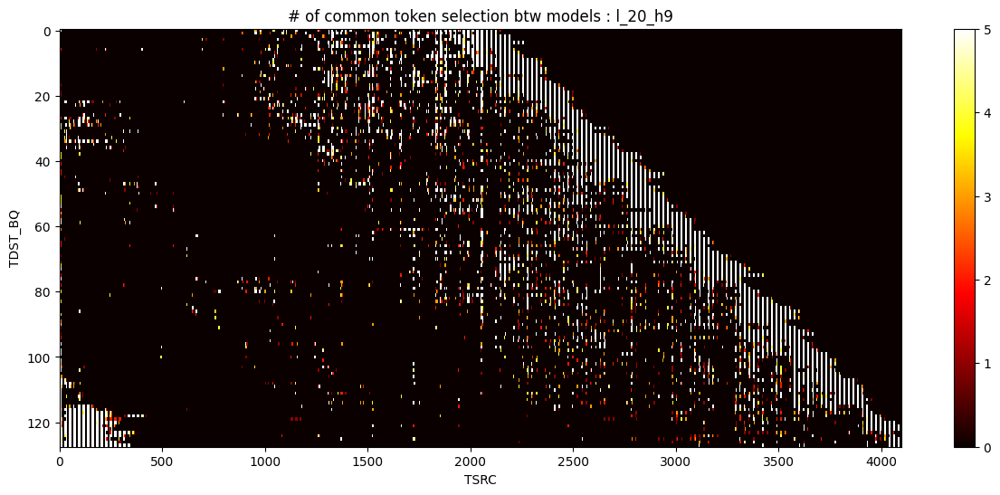

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


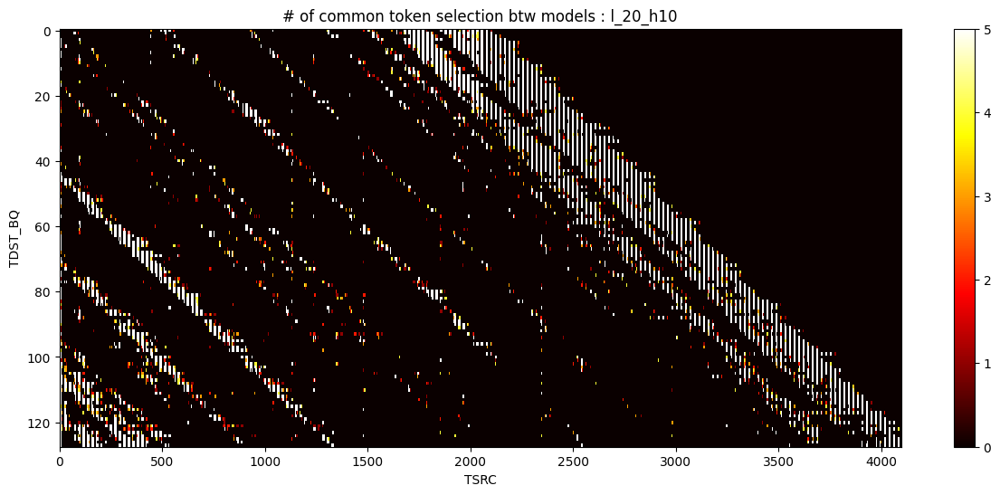

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


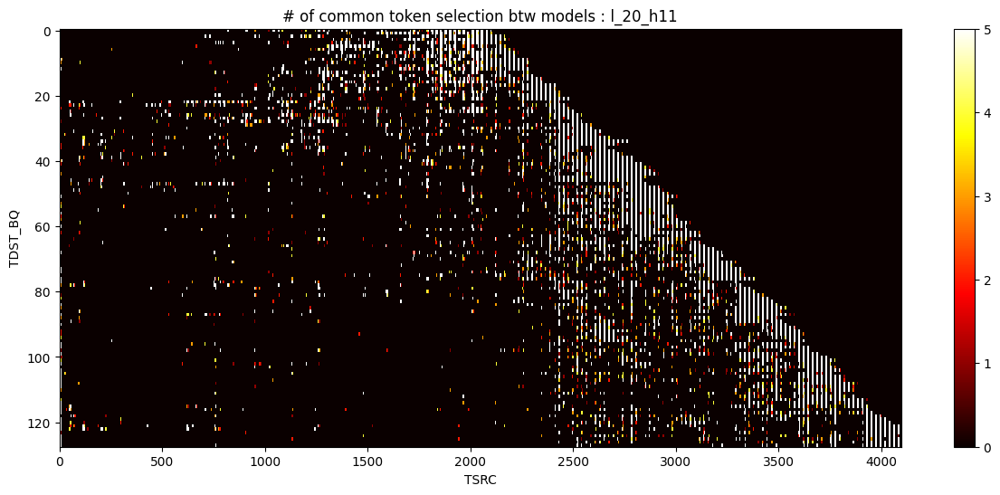

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


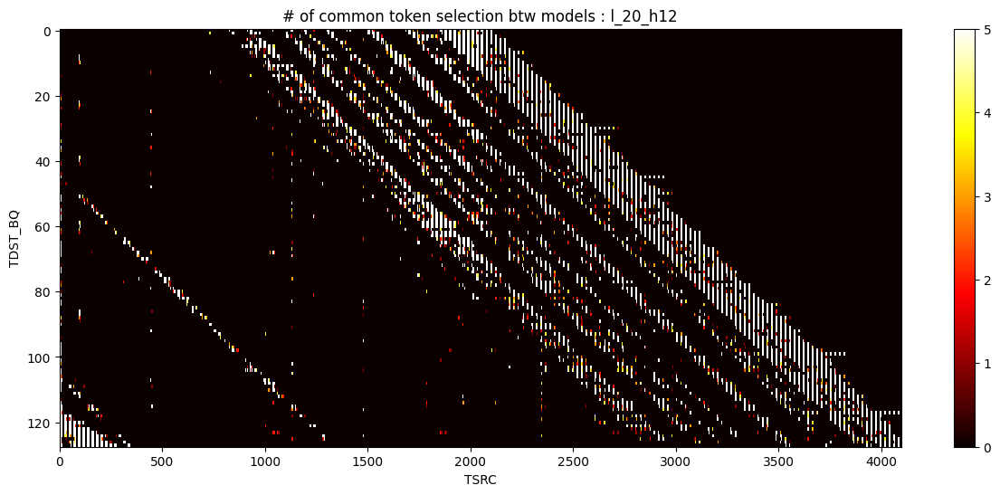

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


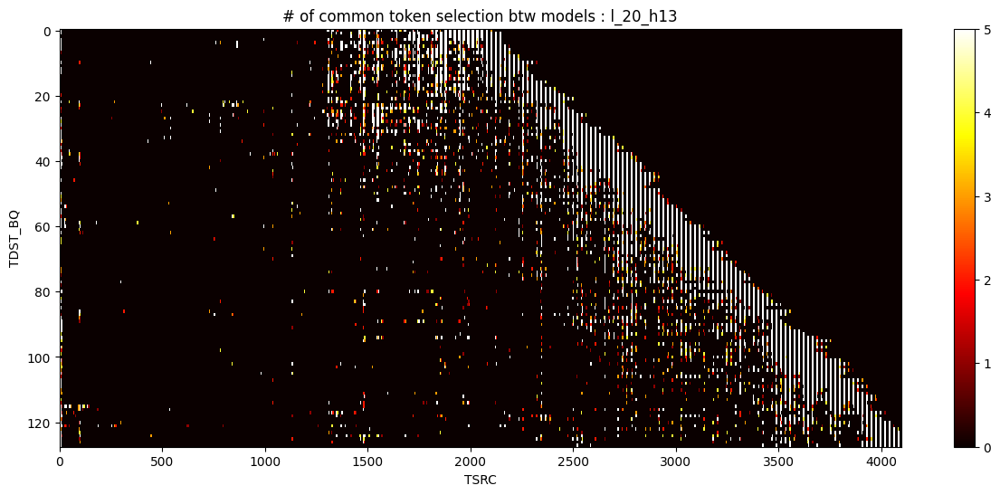

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


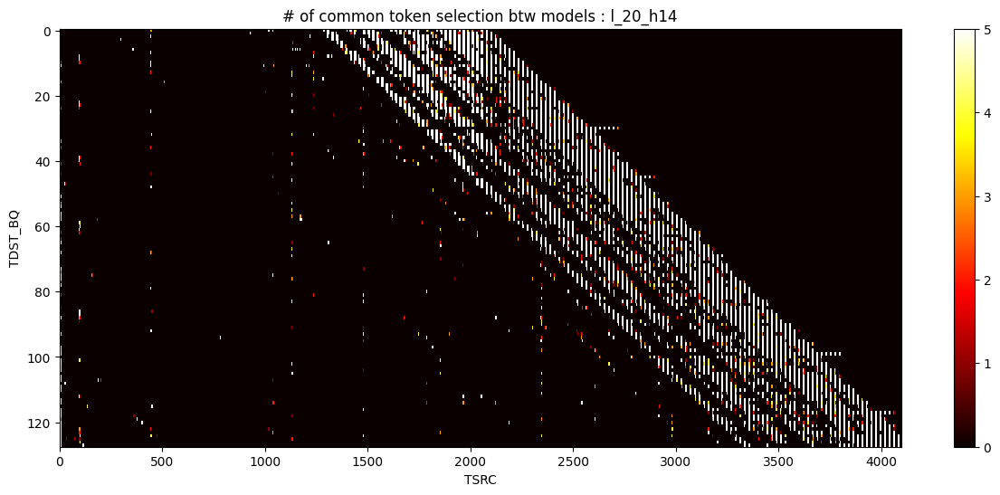

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


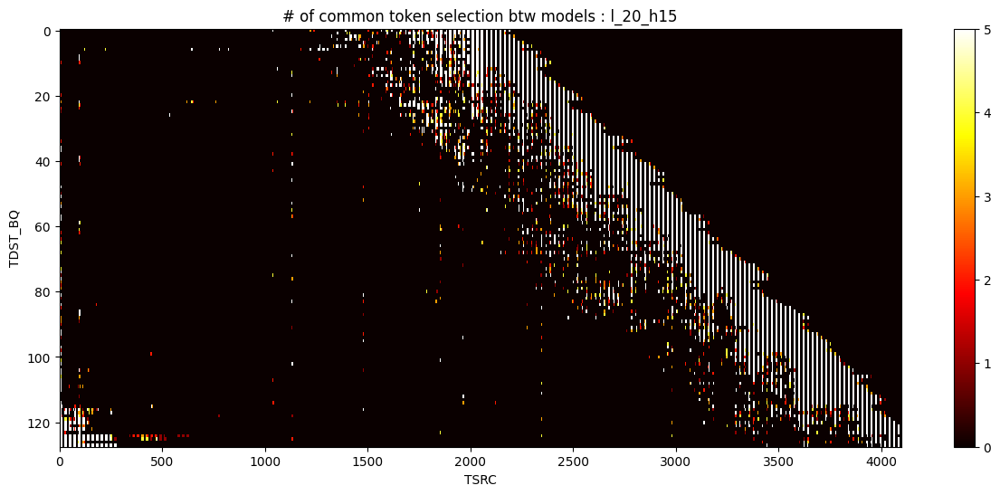

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


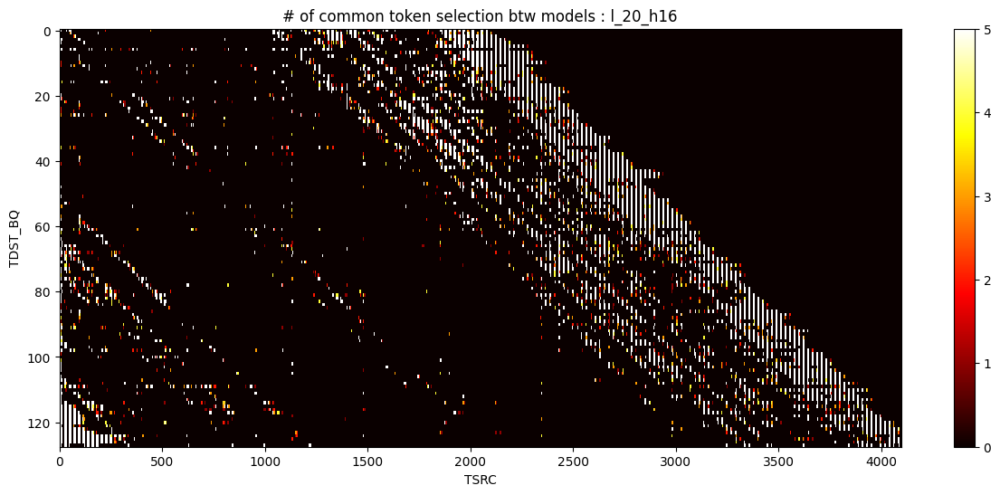

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


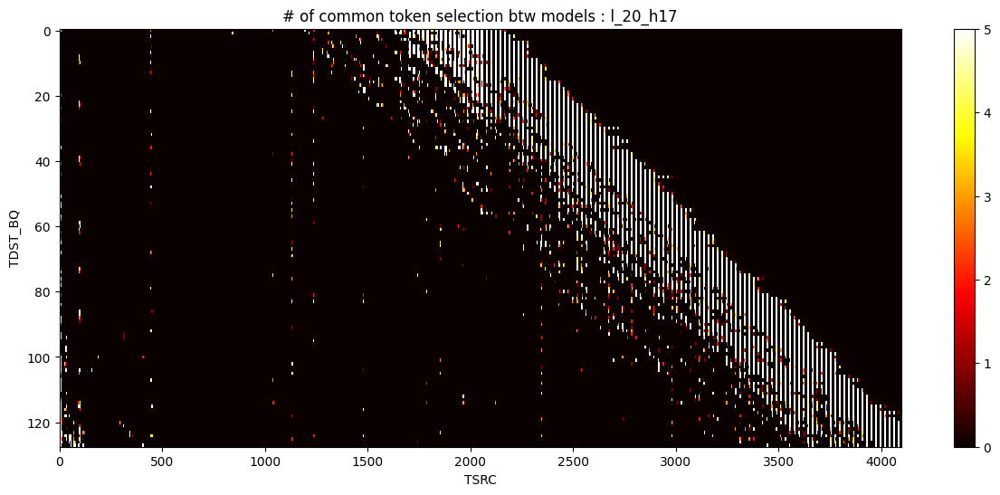

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


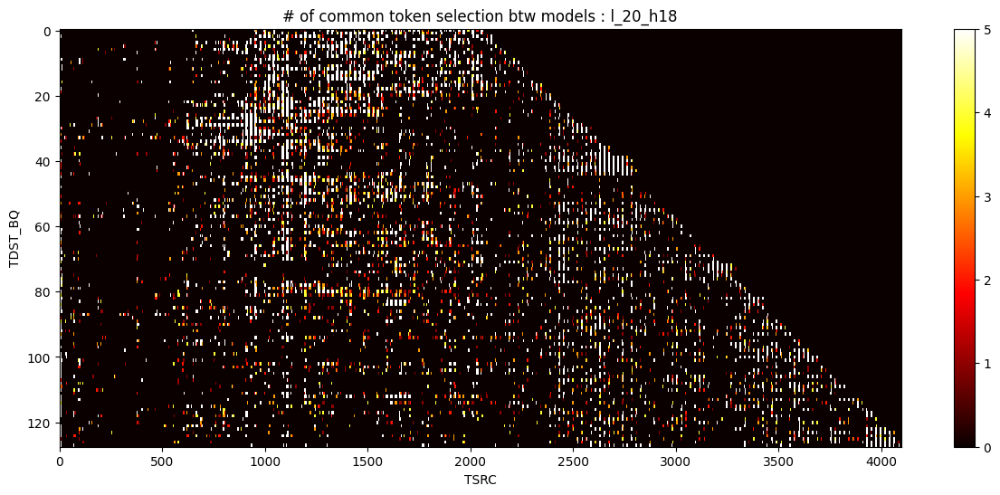

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


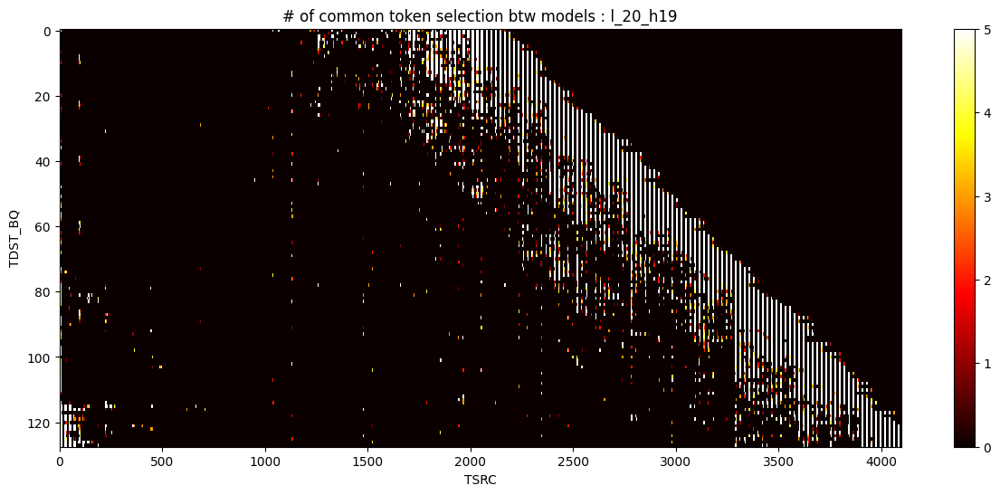

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


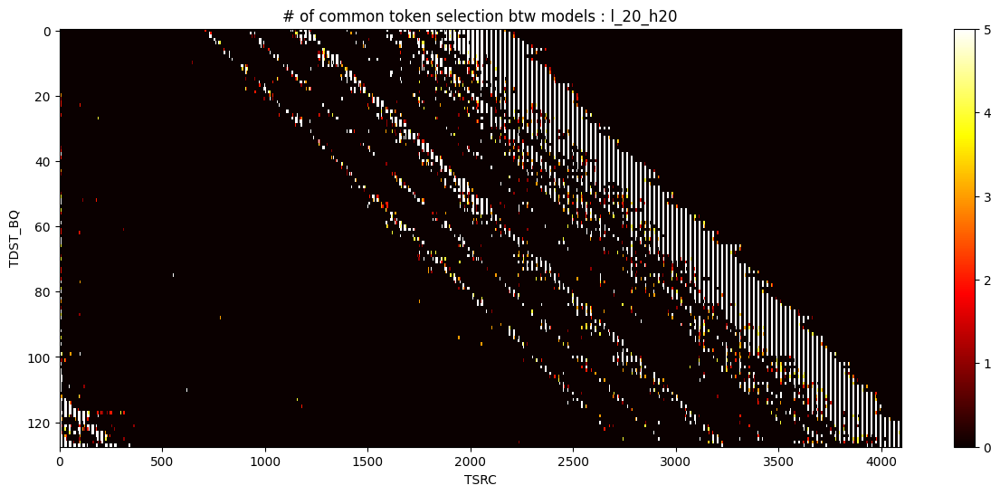

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


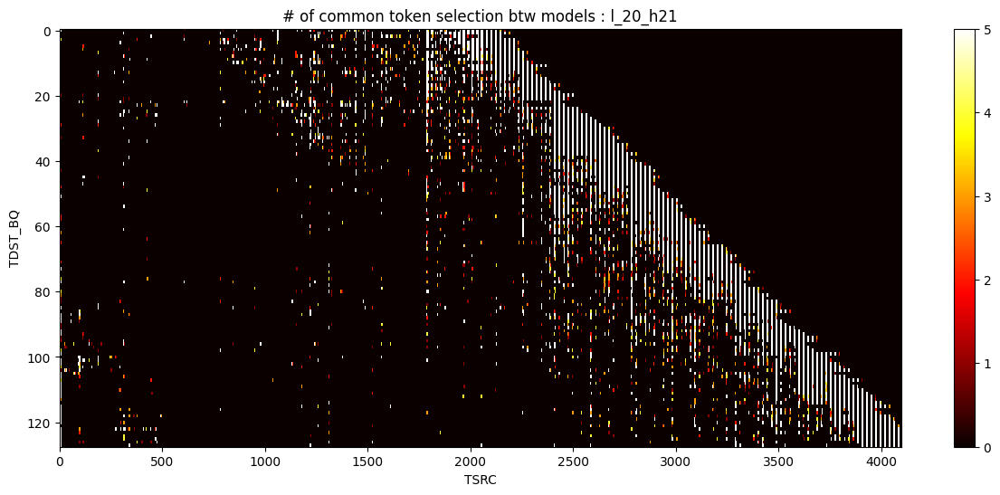

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


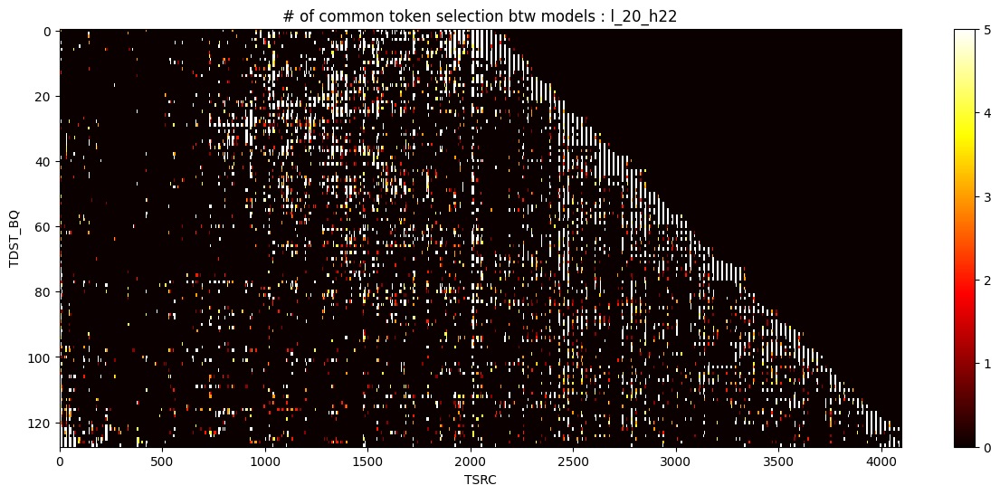

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


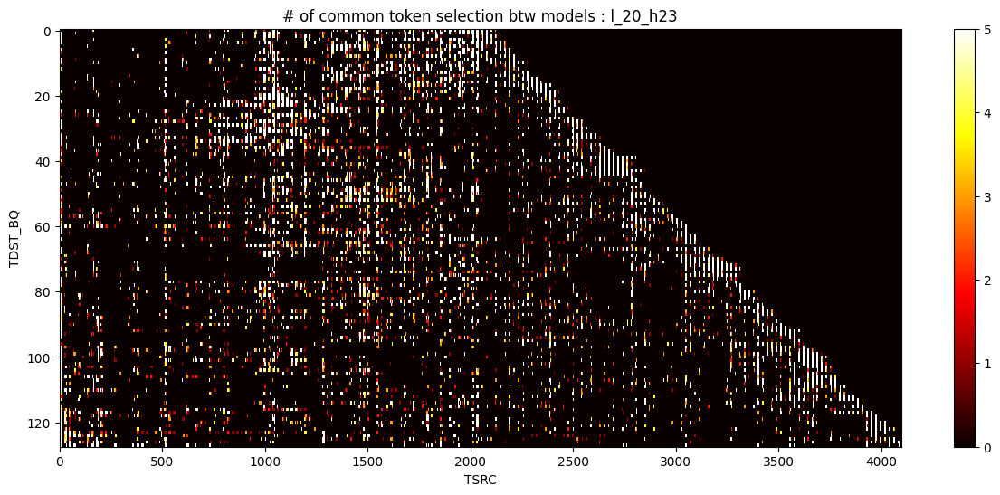

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


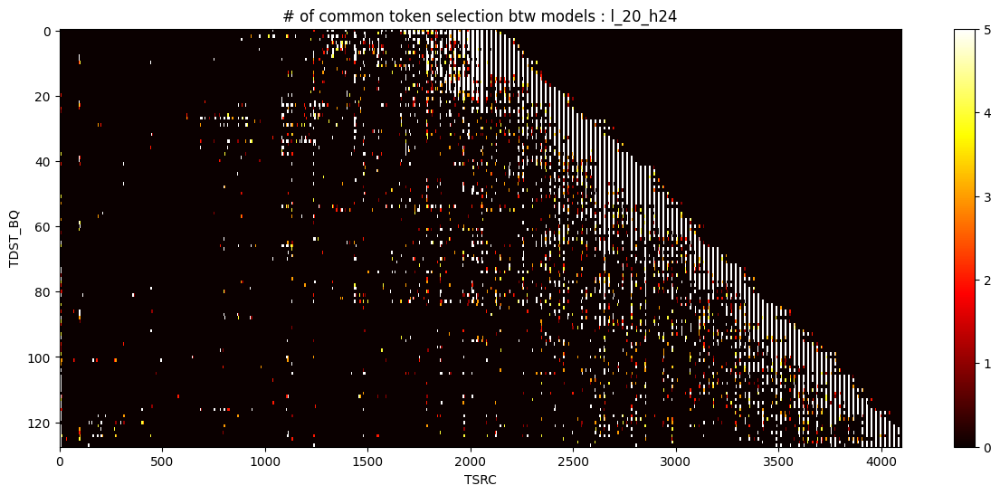

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


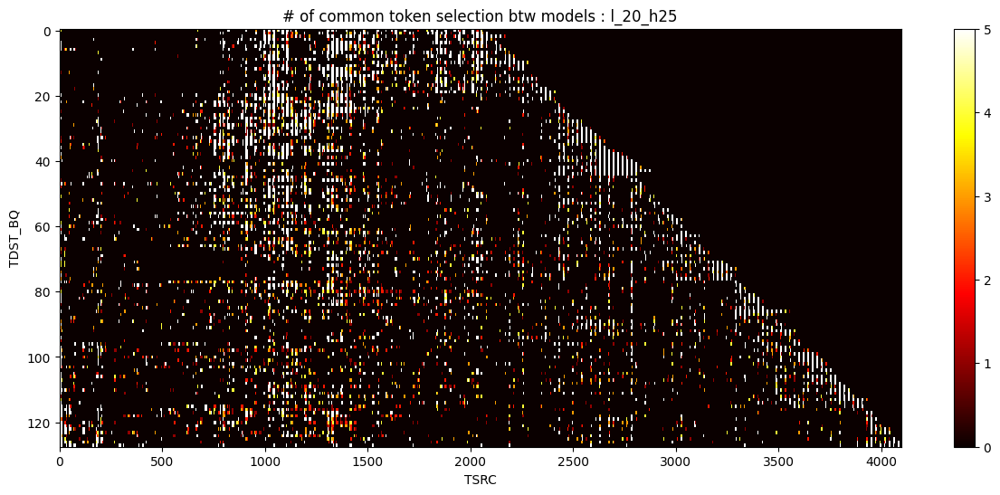

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


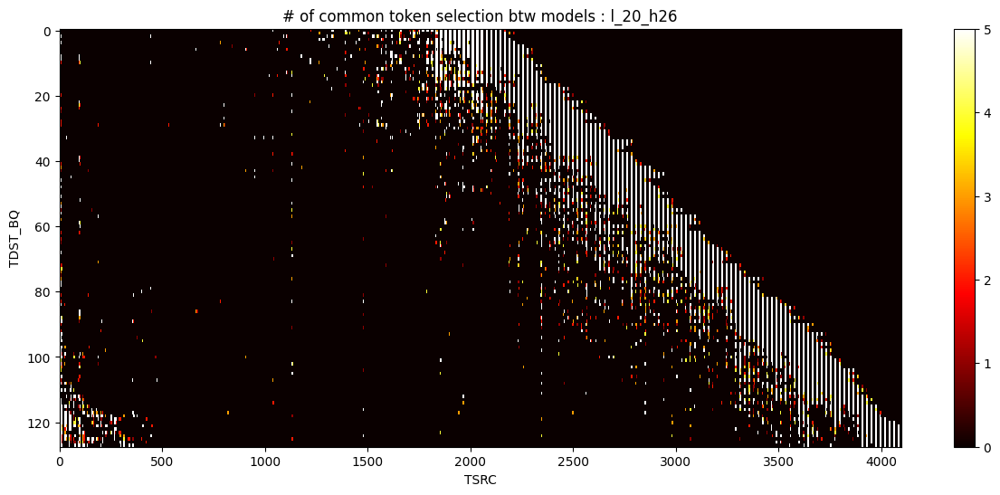

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


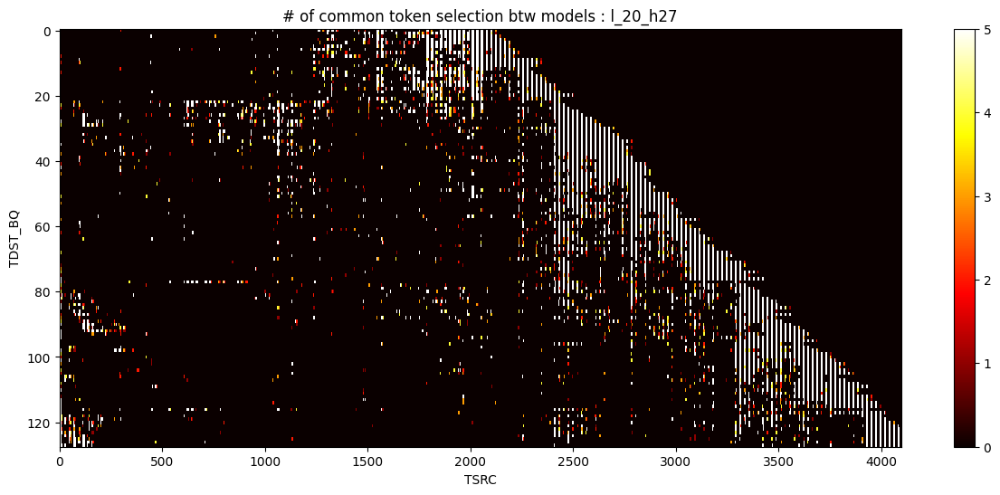

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


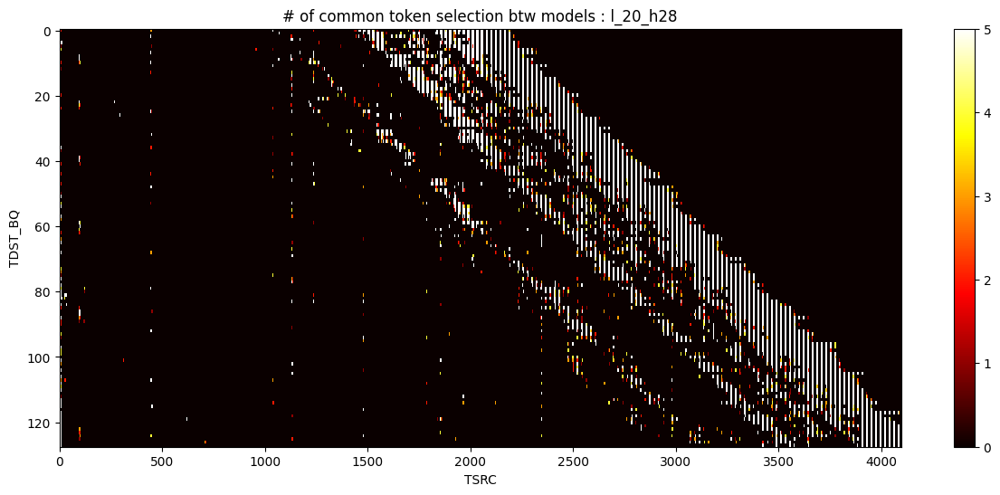

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


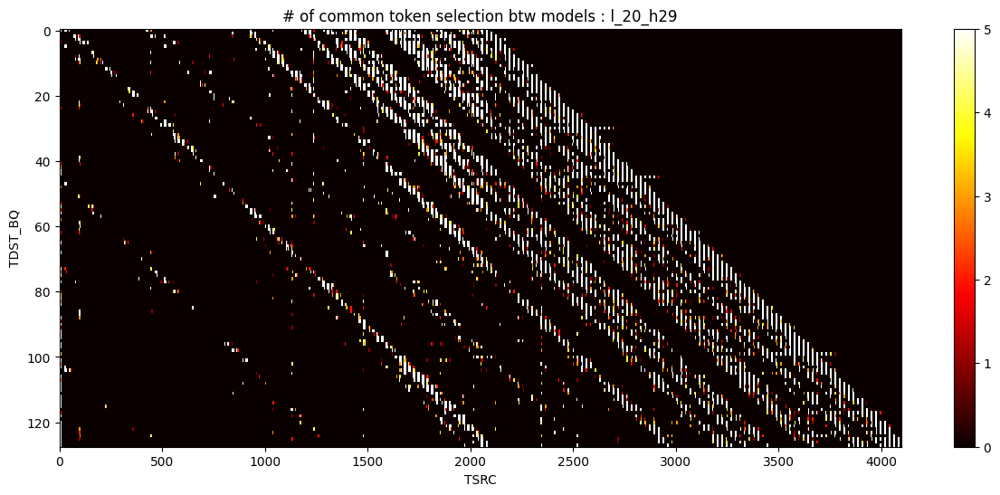

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


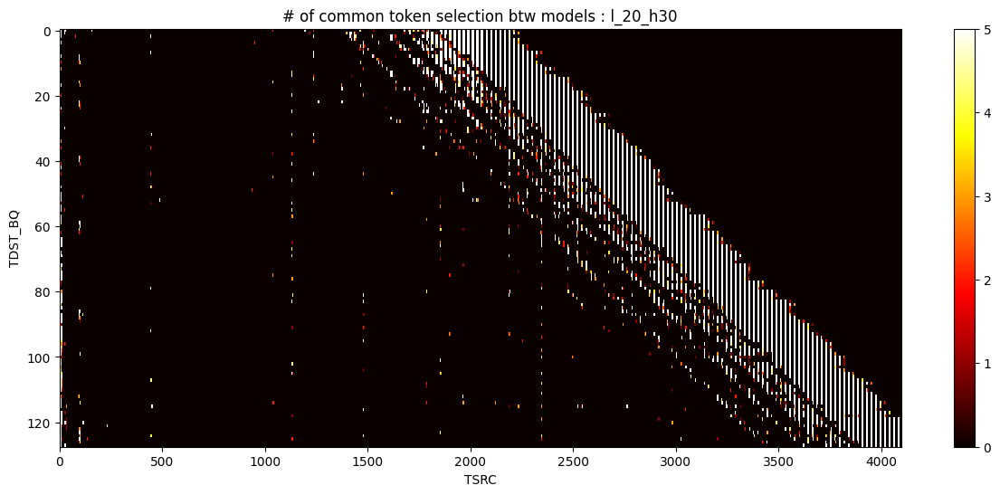

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


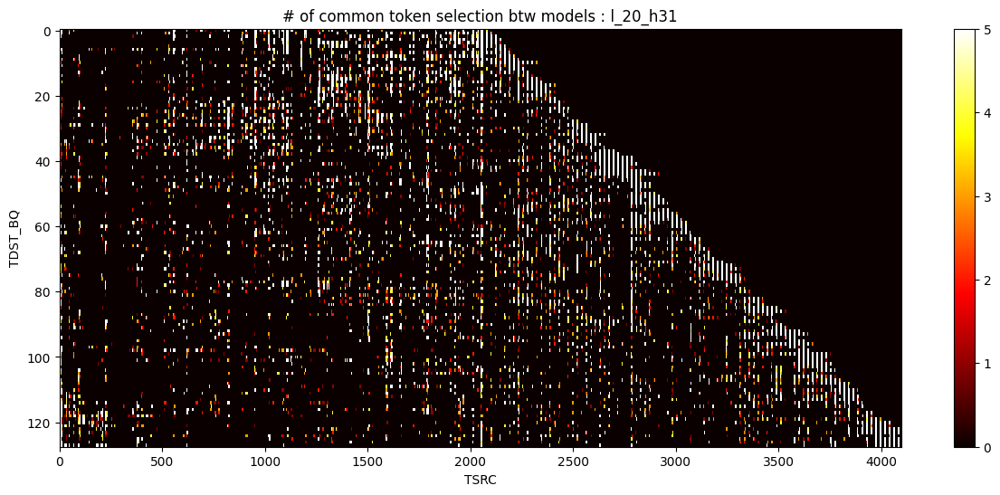

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


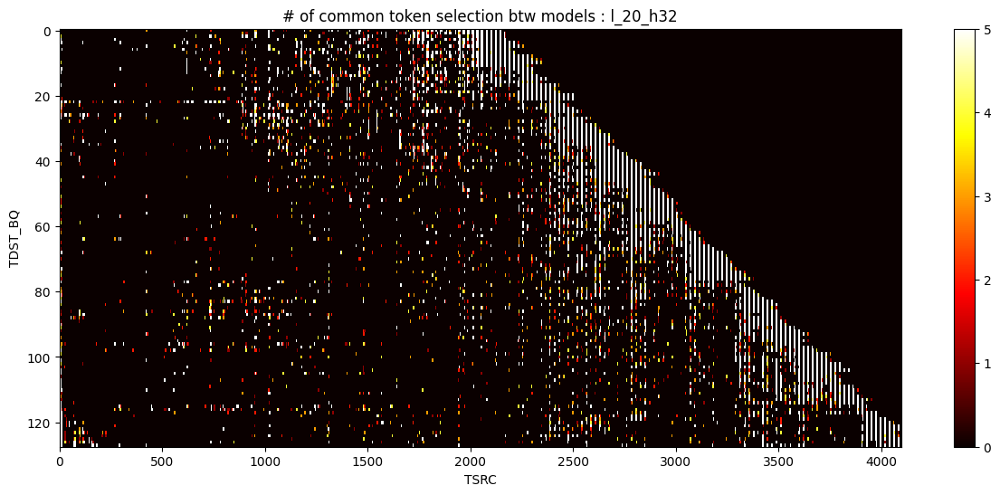

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


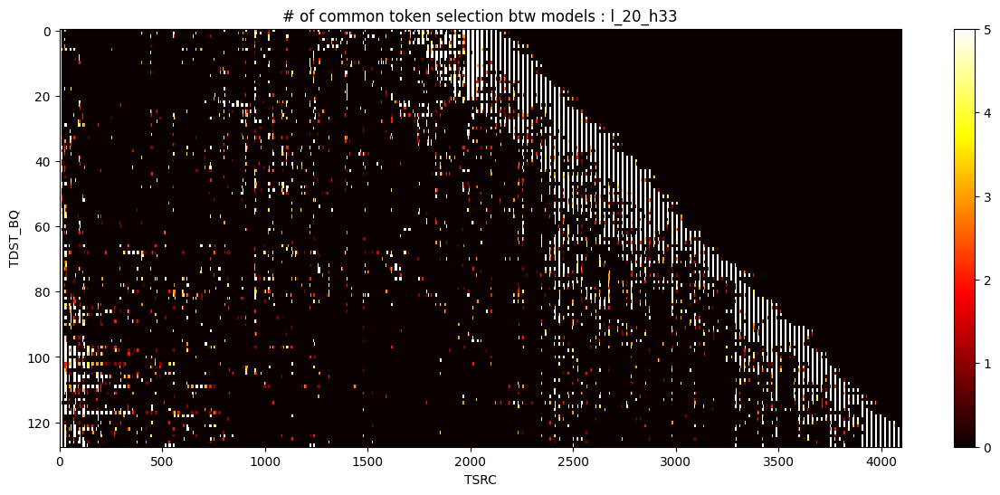

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


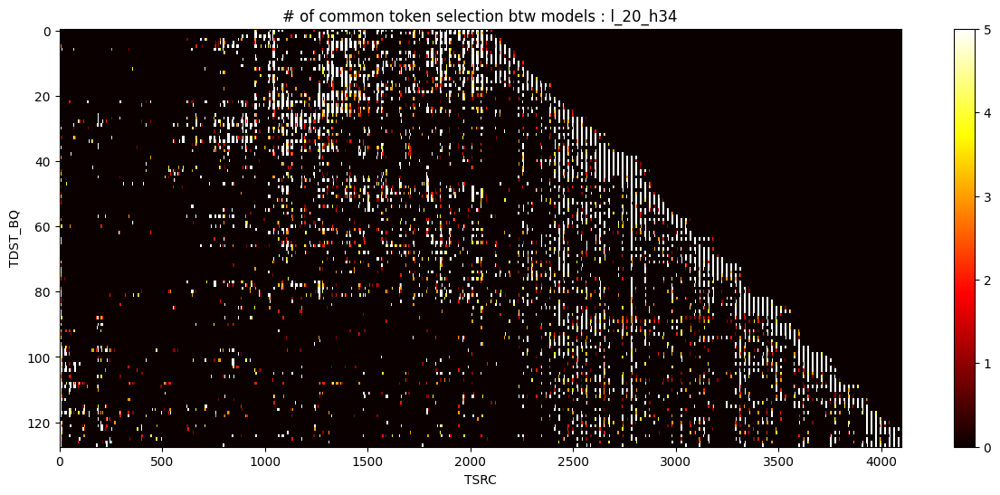

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


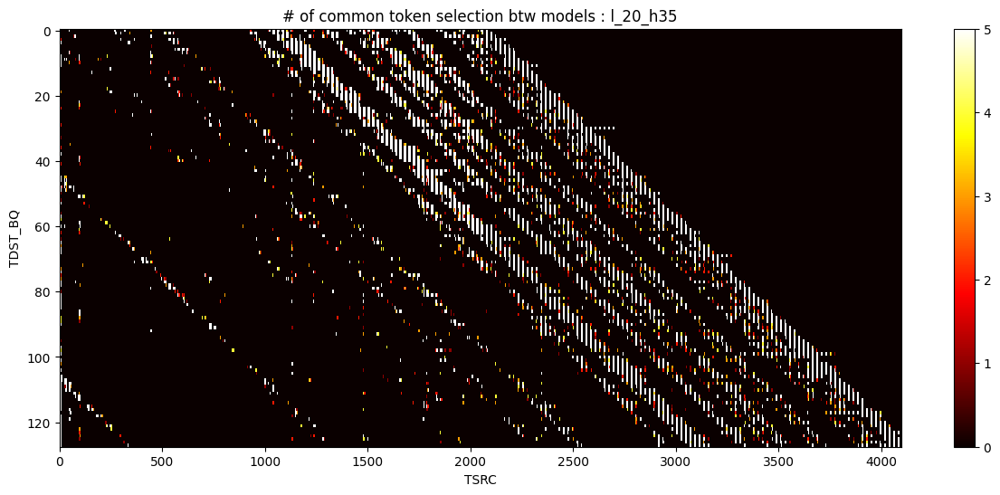

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


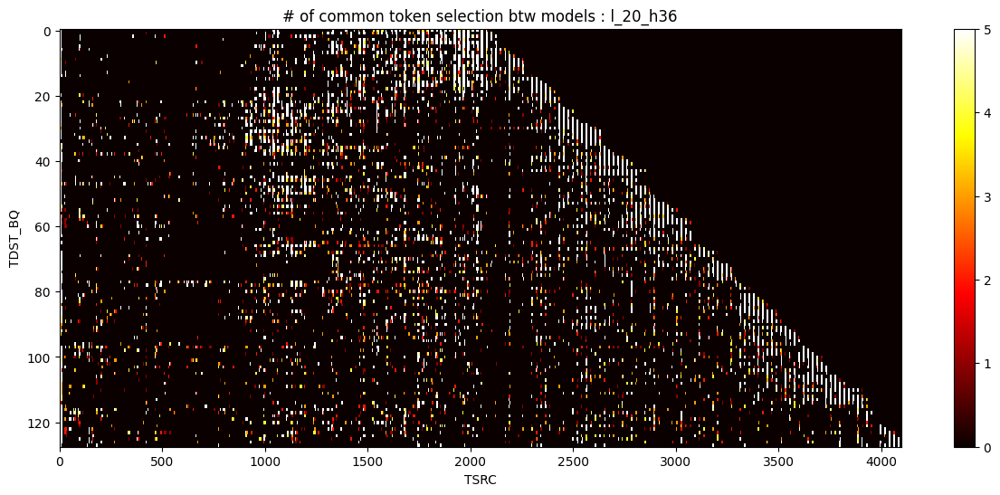

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


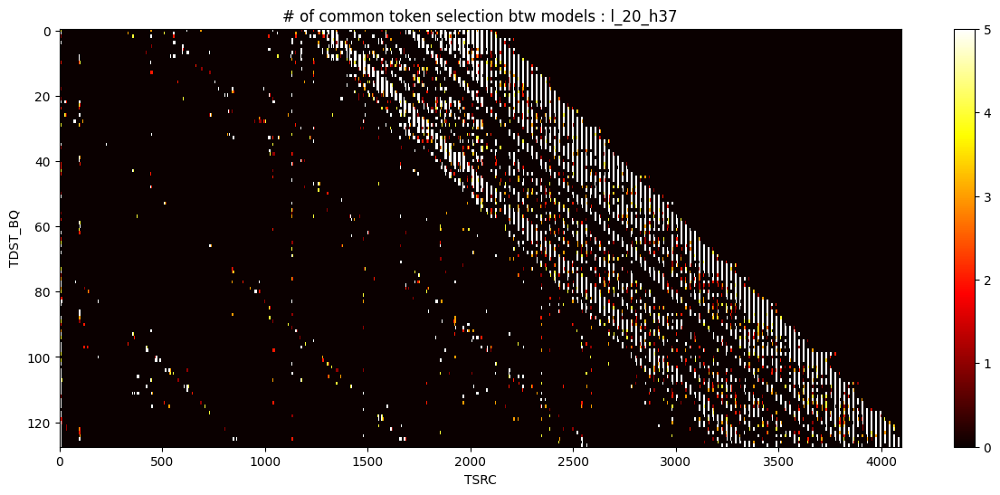

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


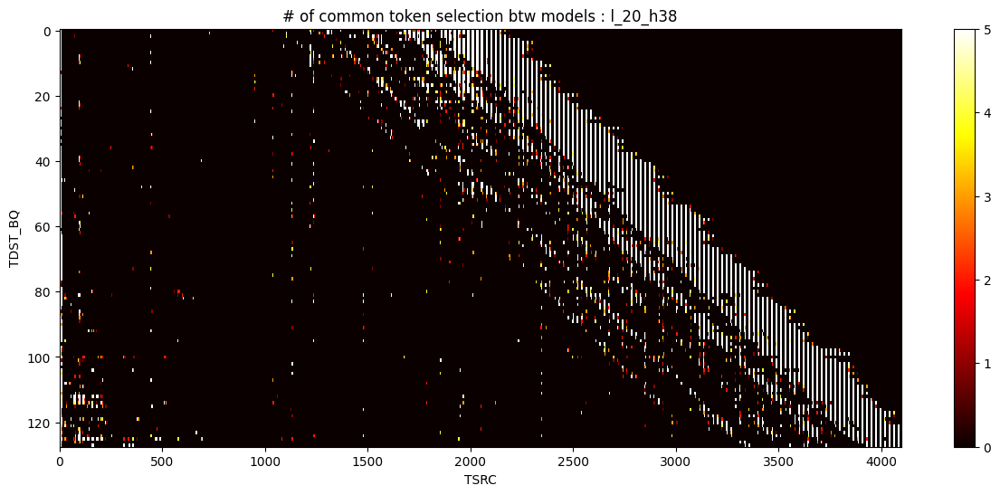

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


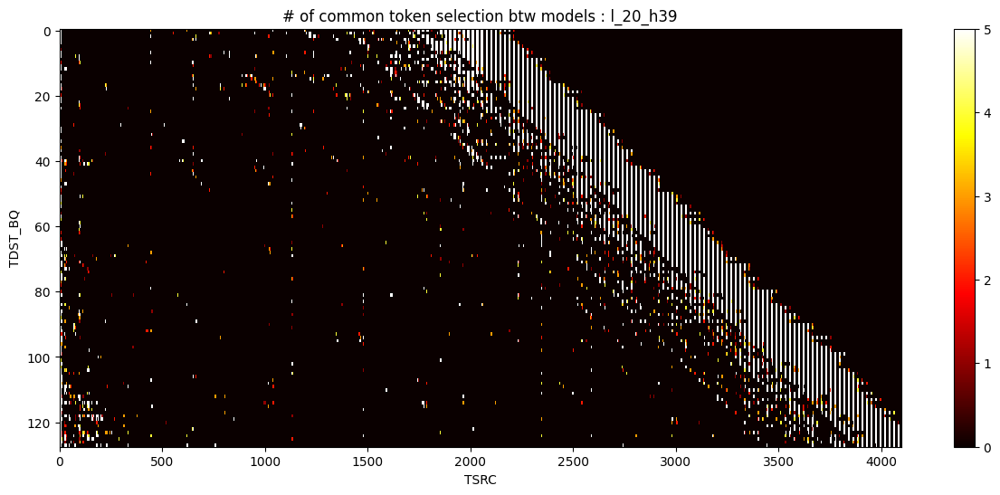

In [13]:
plot_per_layer(20)

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


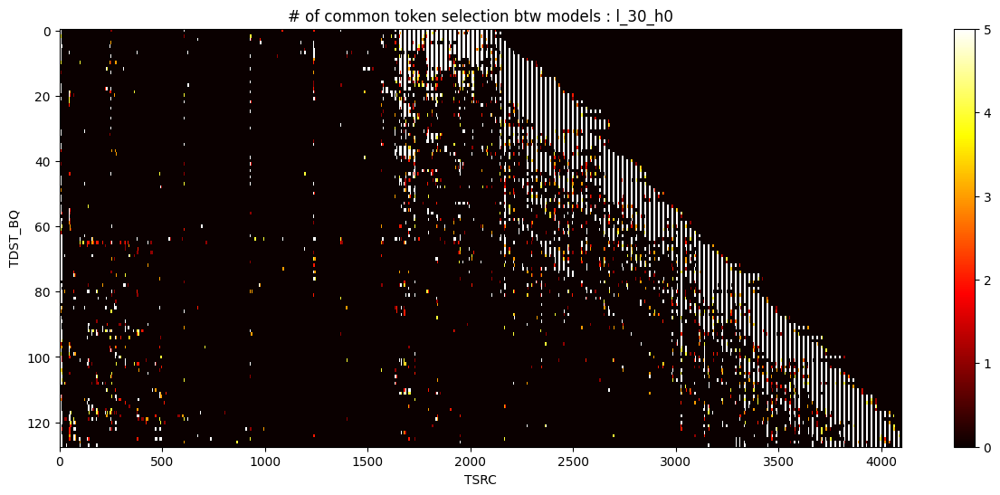

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 2., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


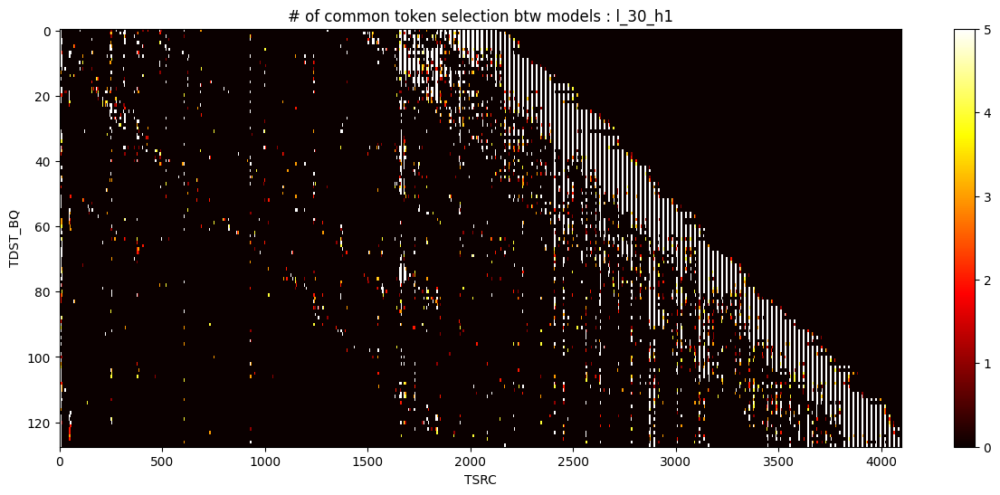

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


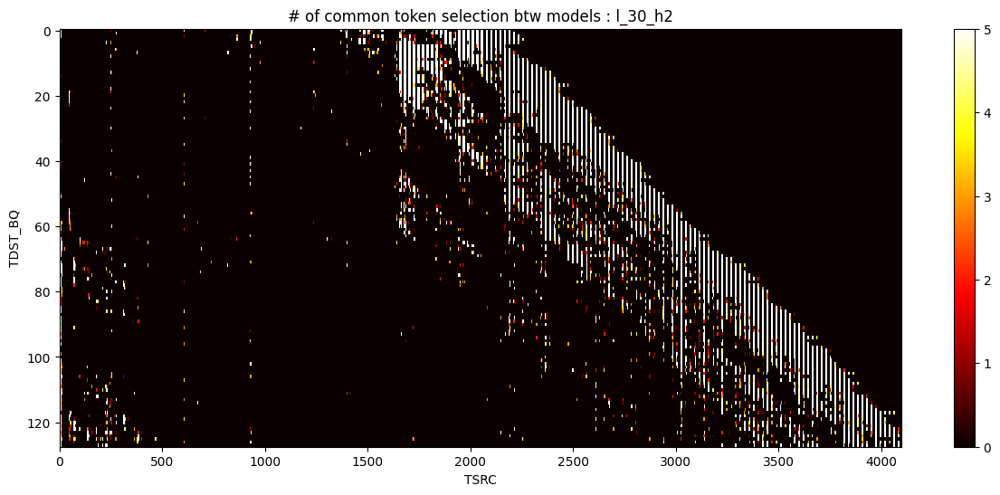

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


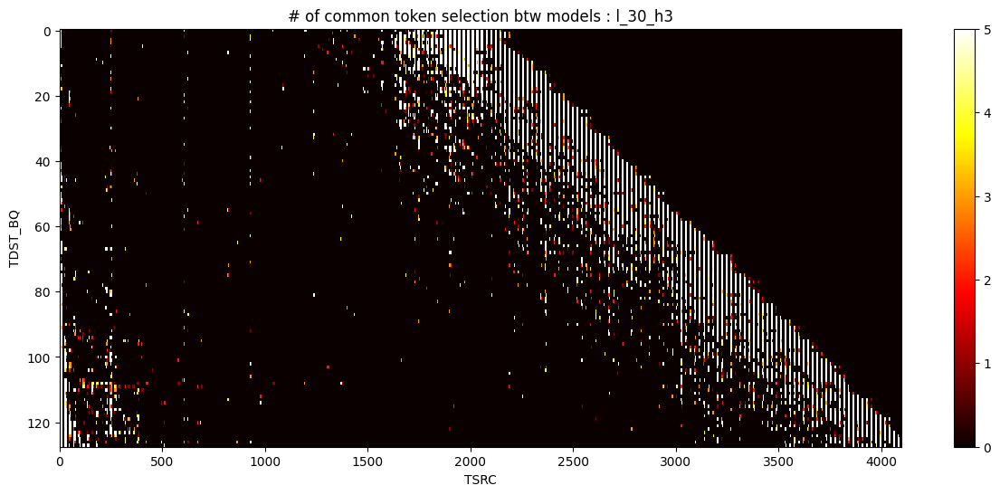

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


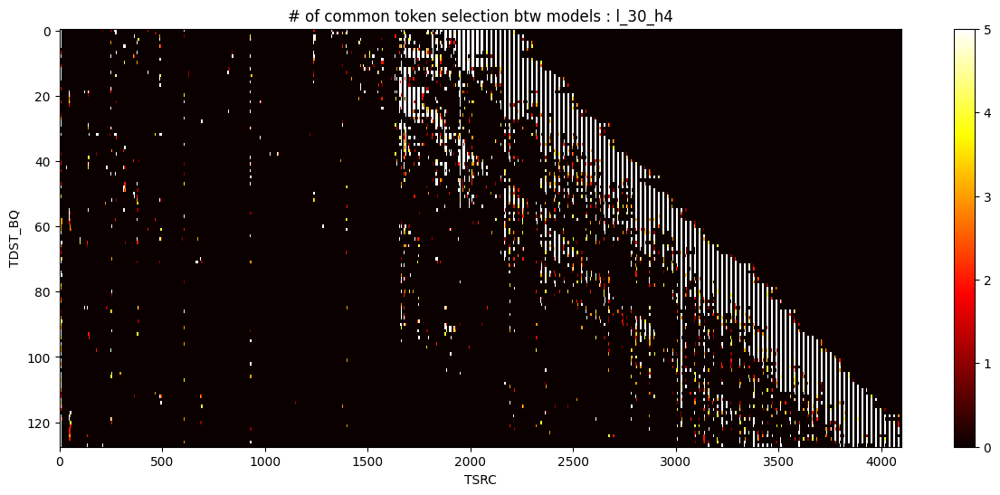

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


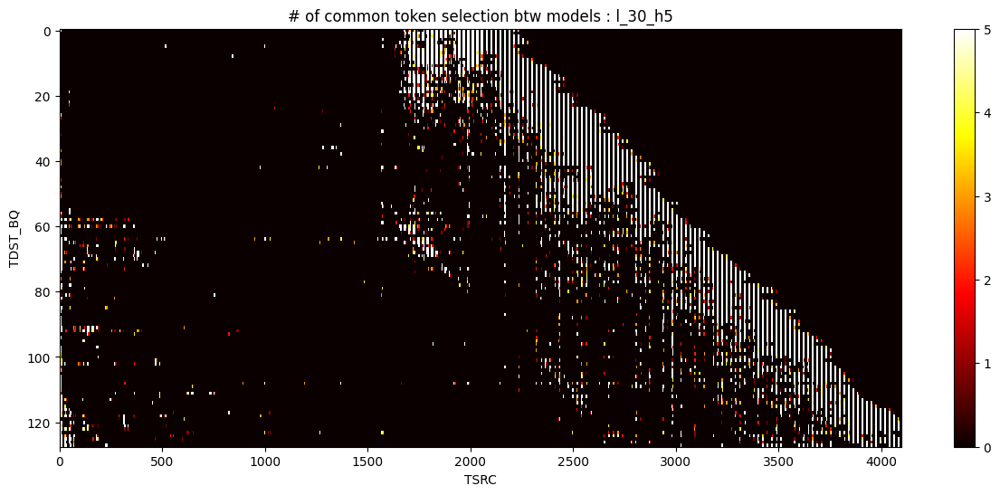

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


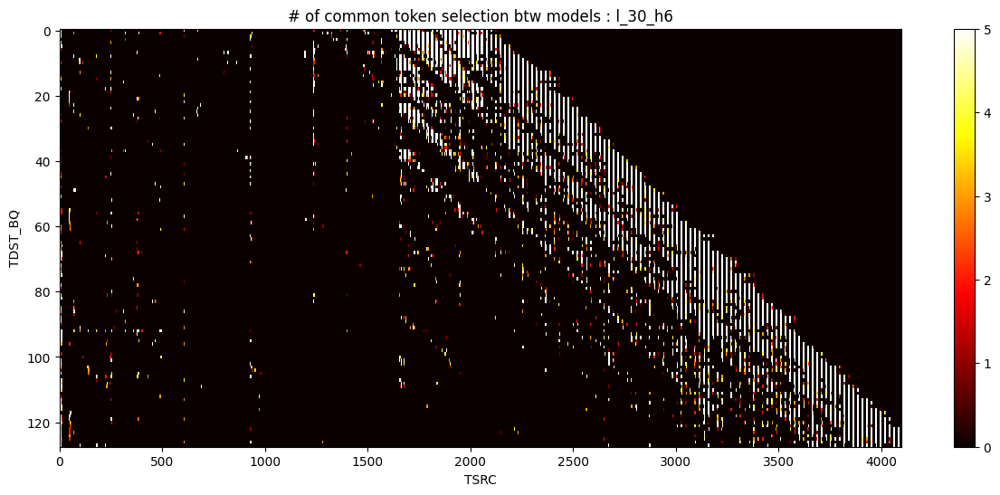

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


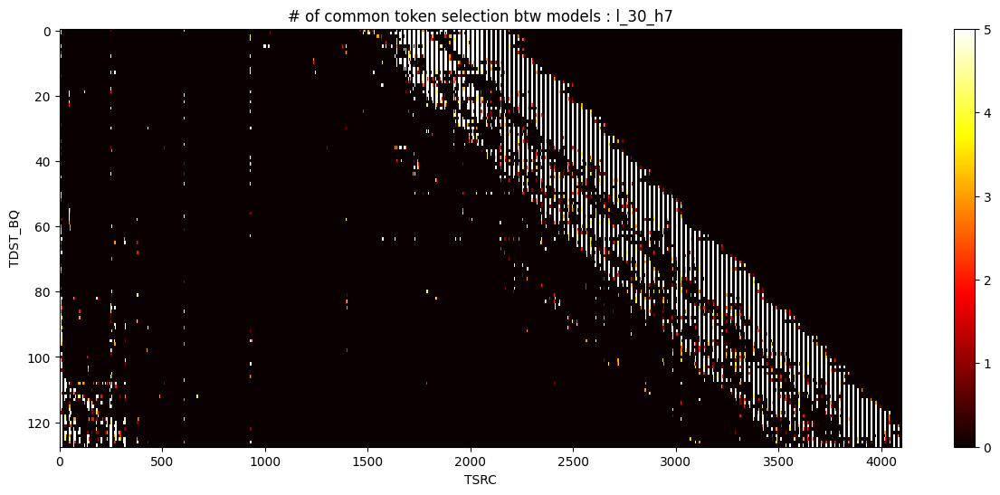

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


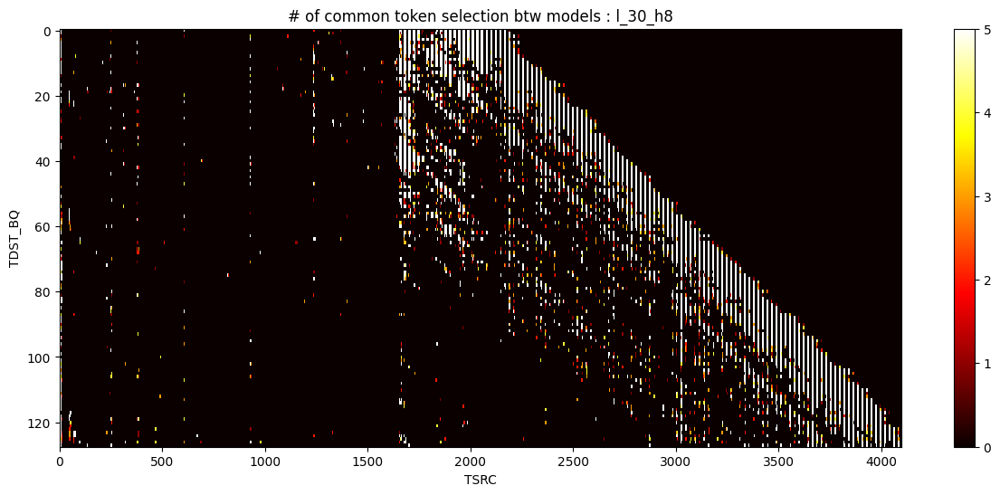

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


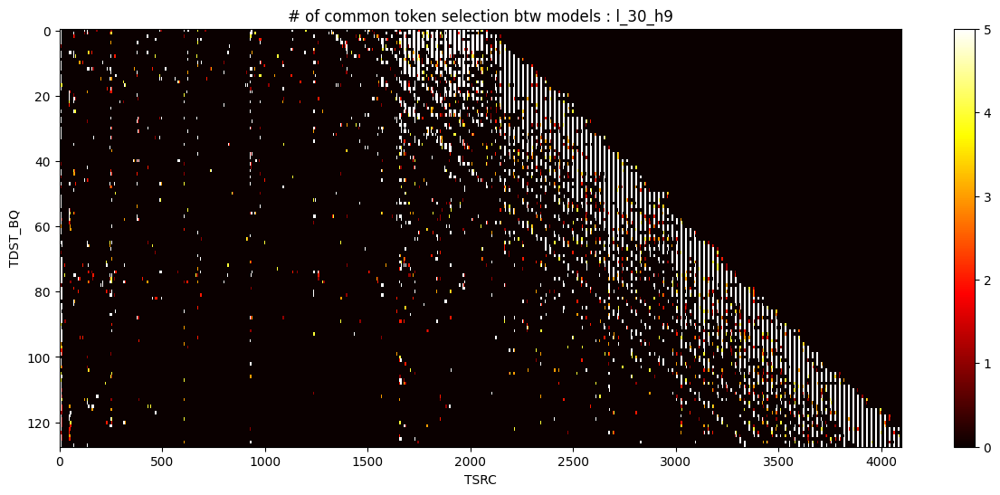

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


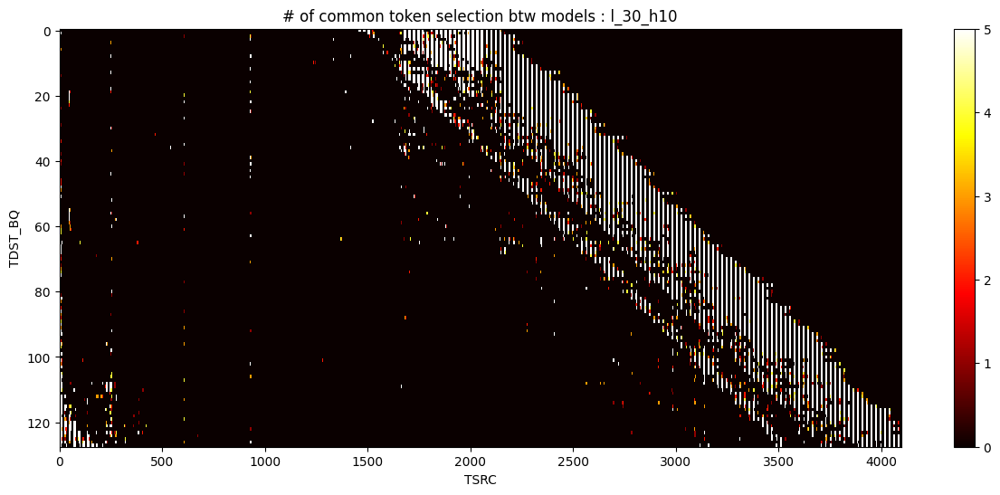

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


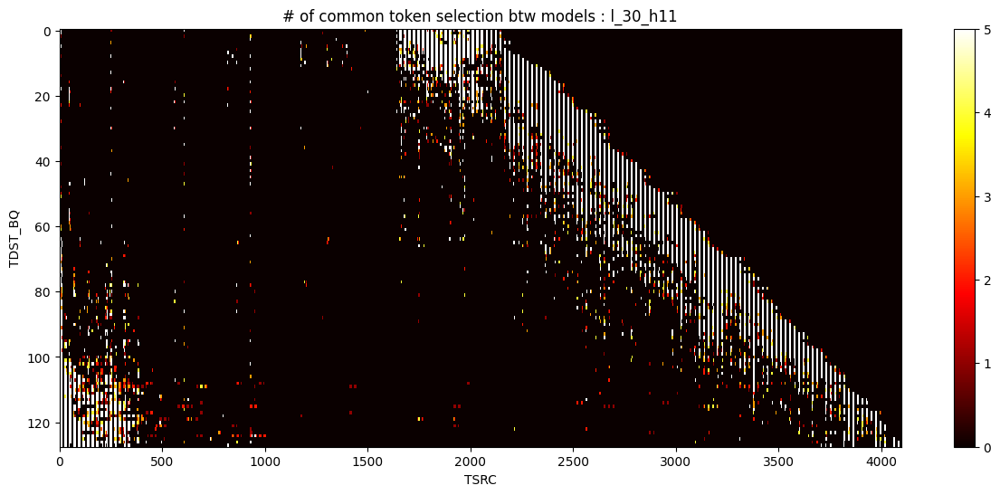

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


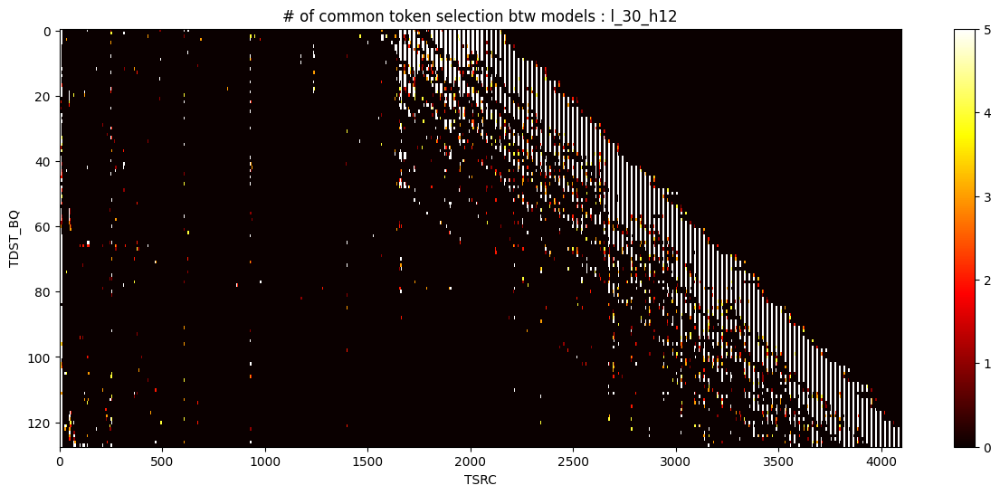

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


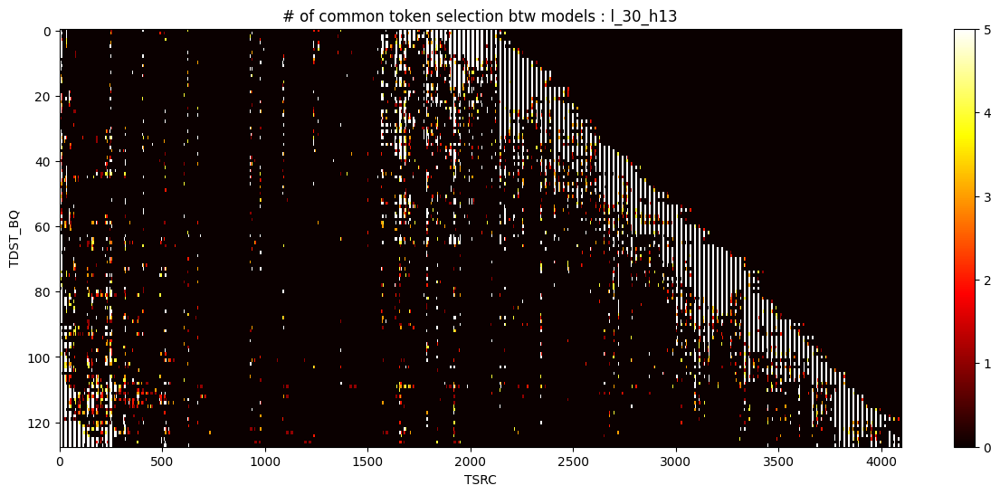

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


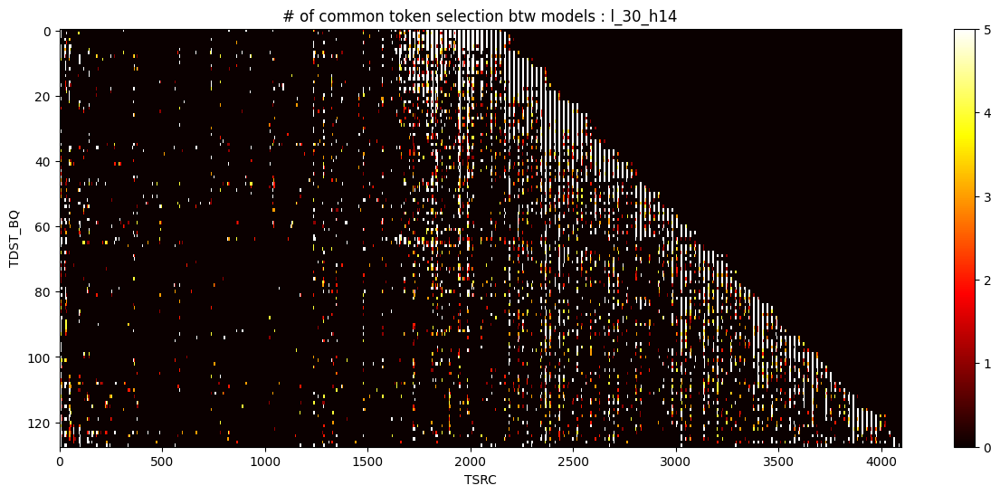

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


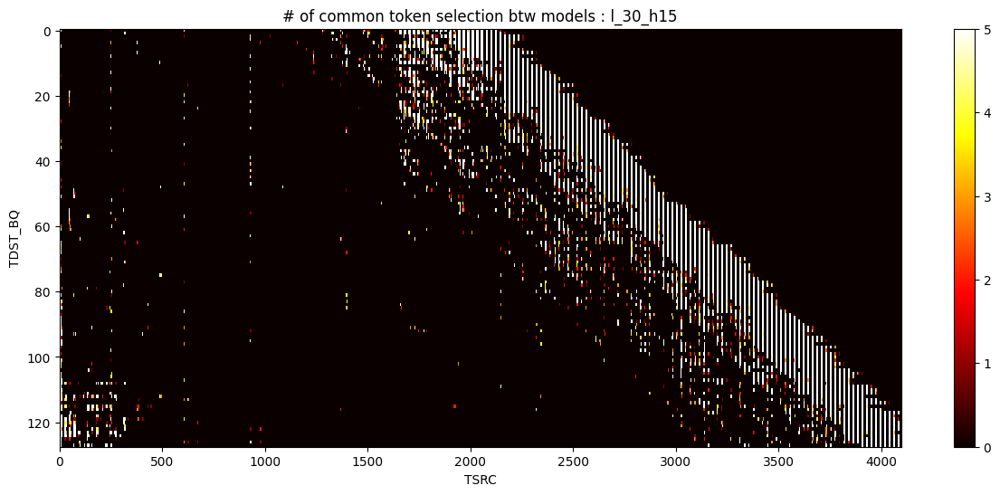

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


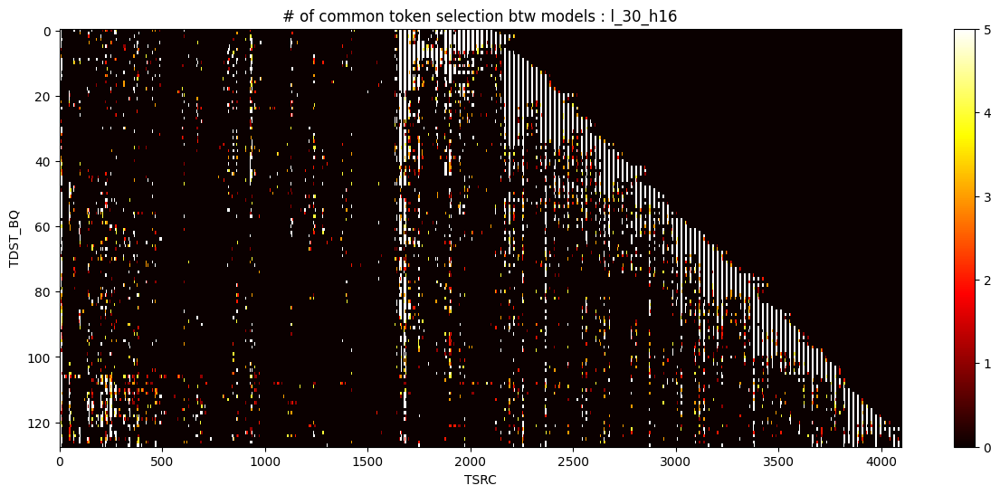

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


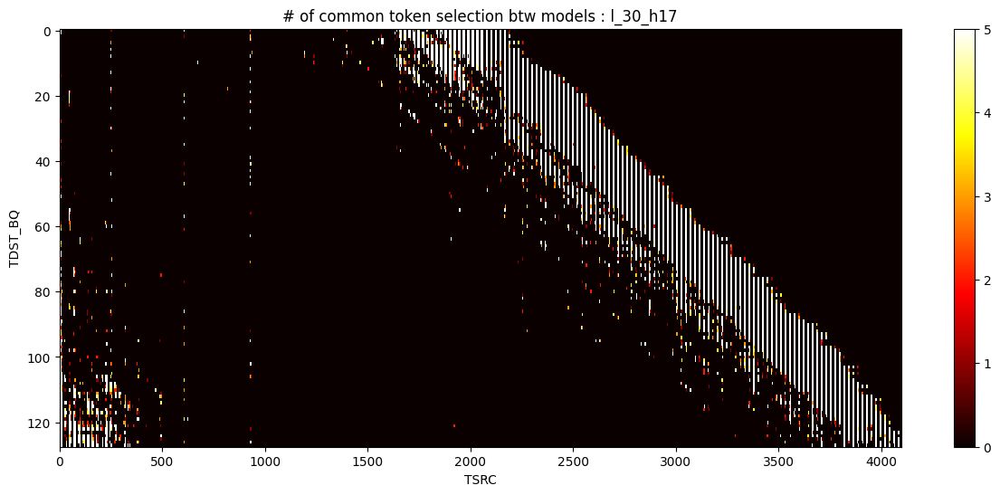

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


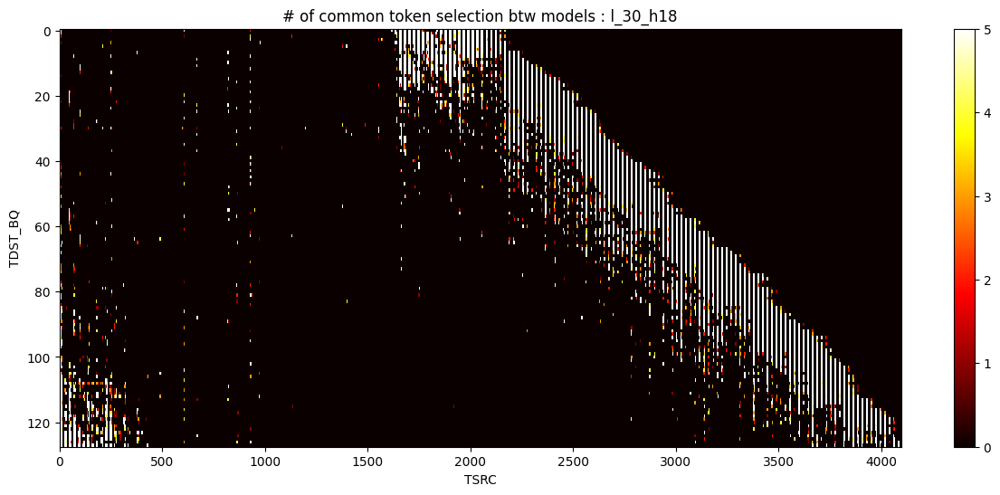

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 2., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


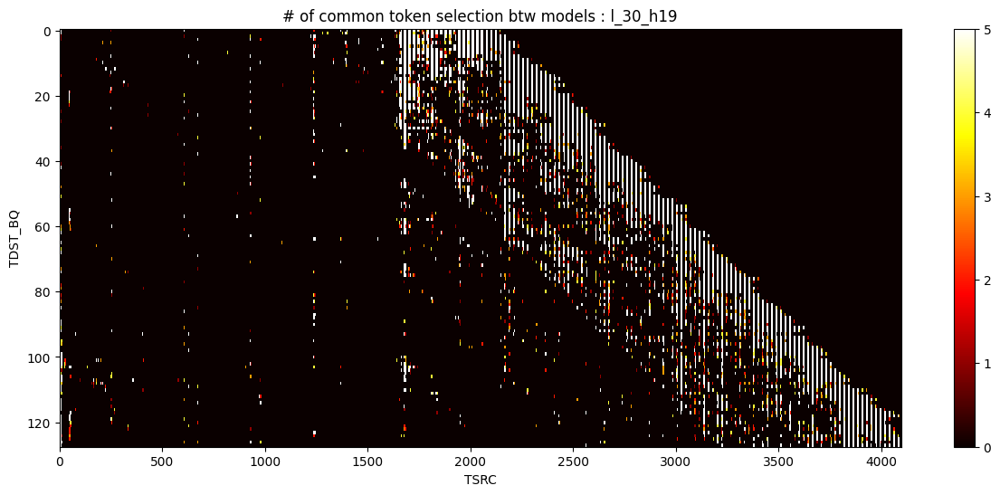

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


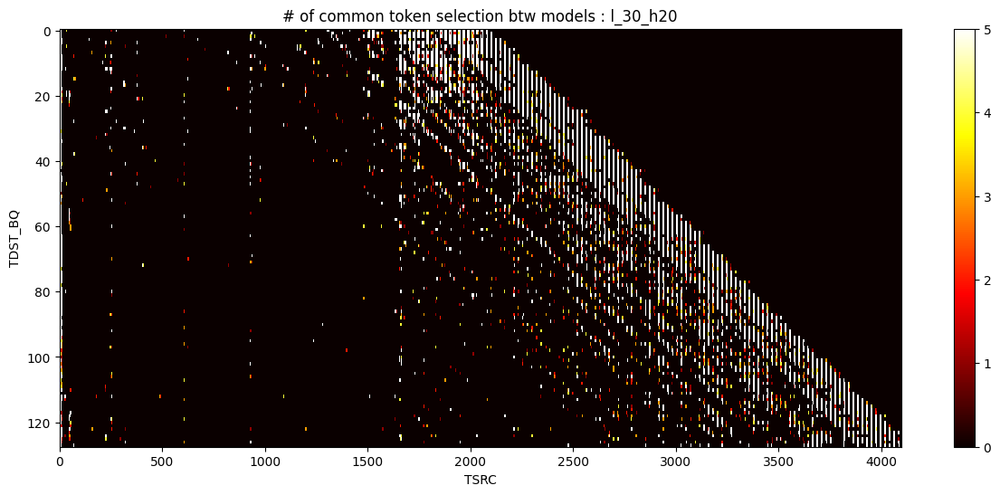

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


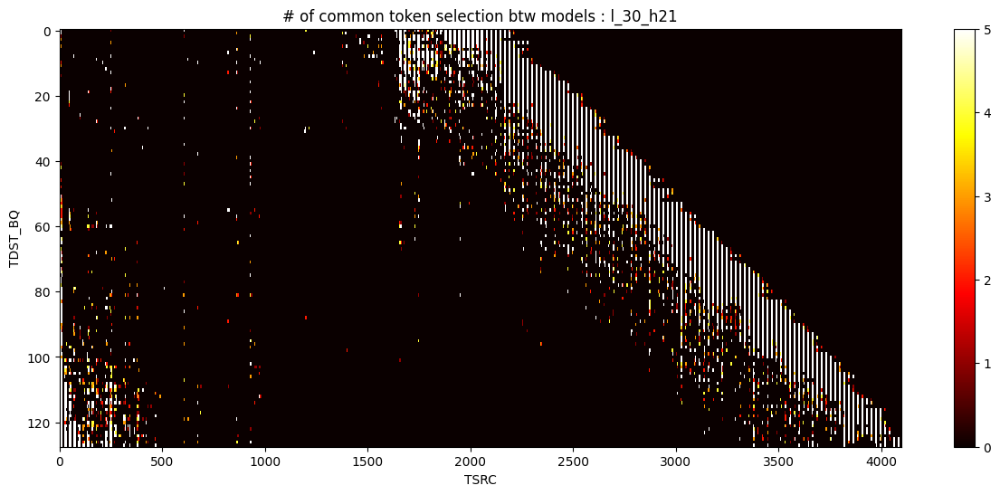

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


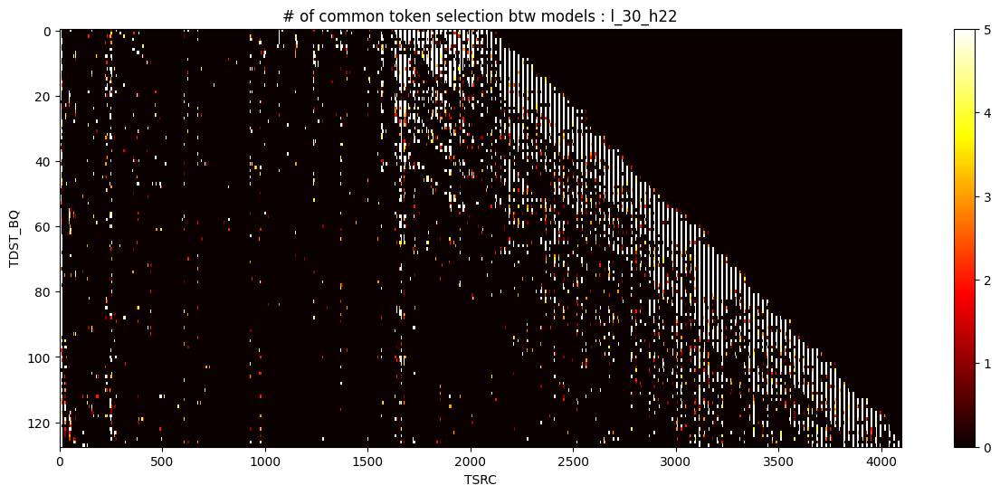

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


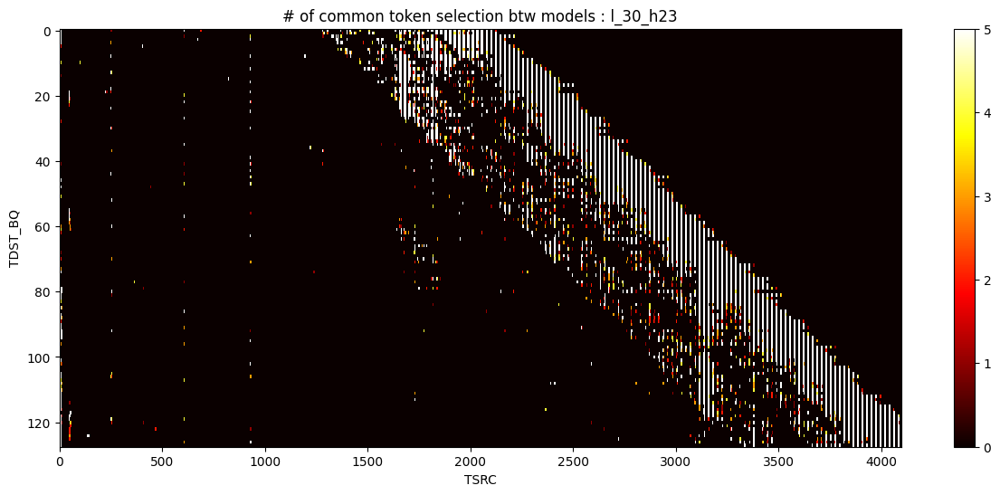

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


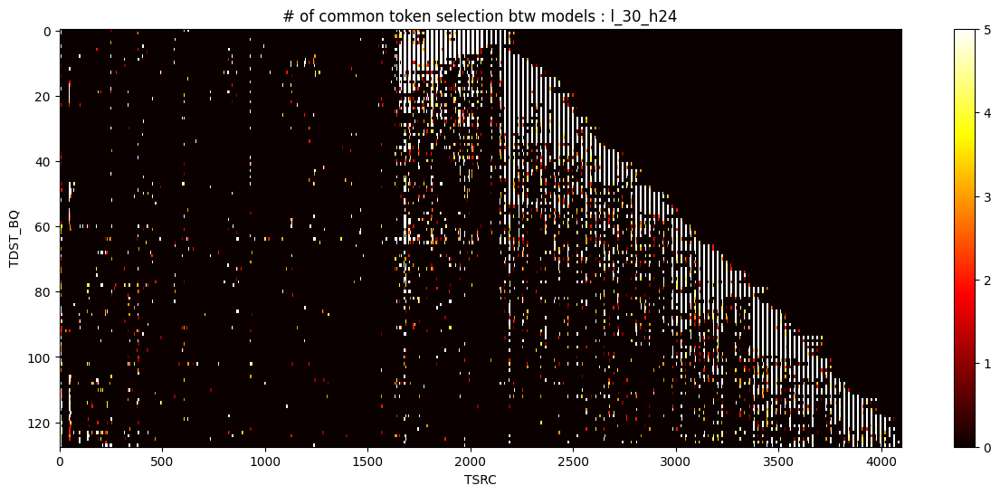

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


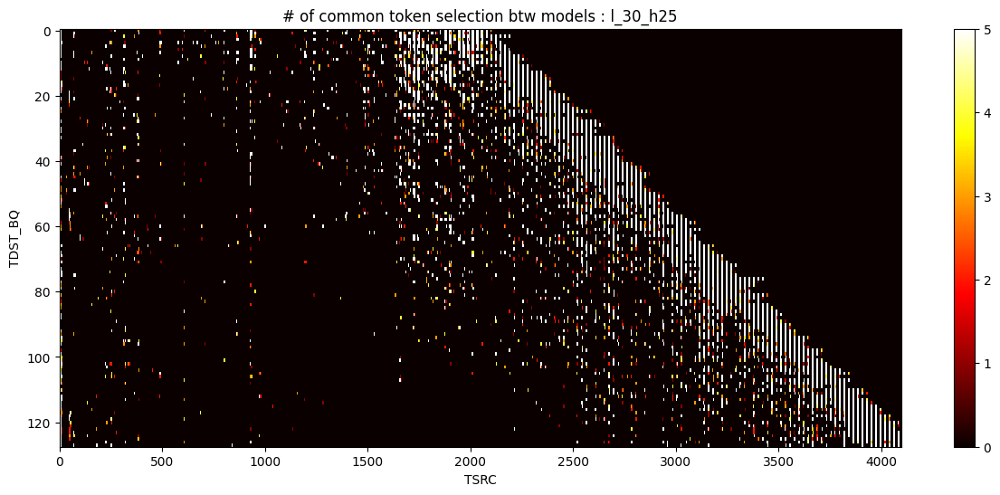

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


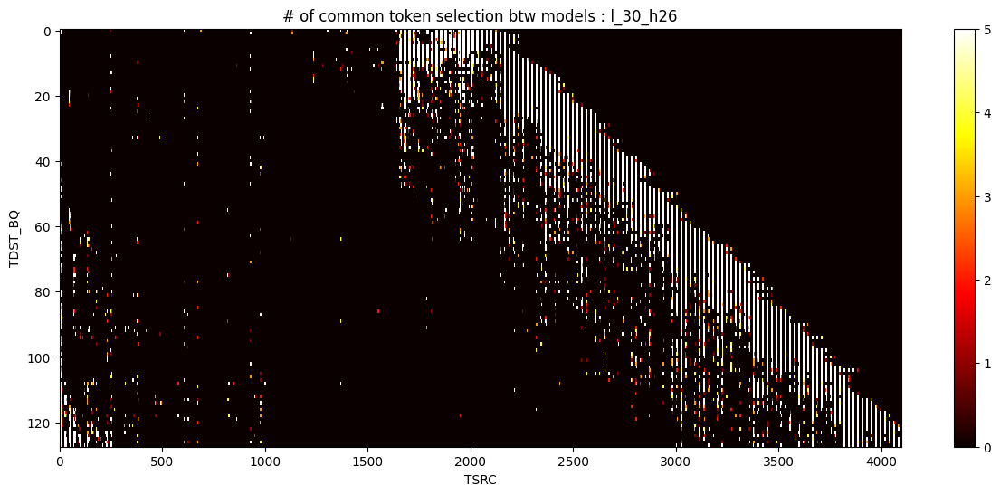

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


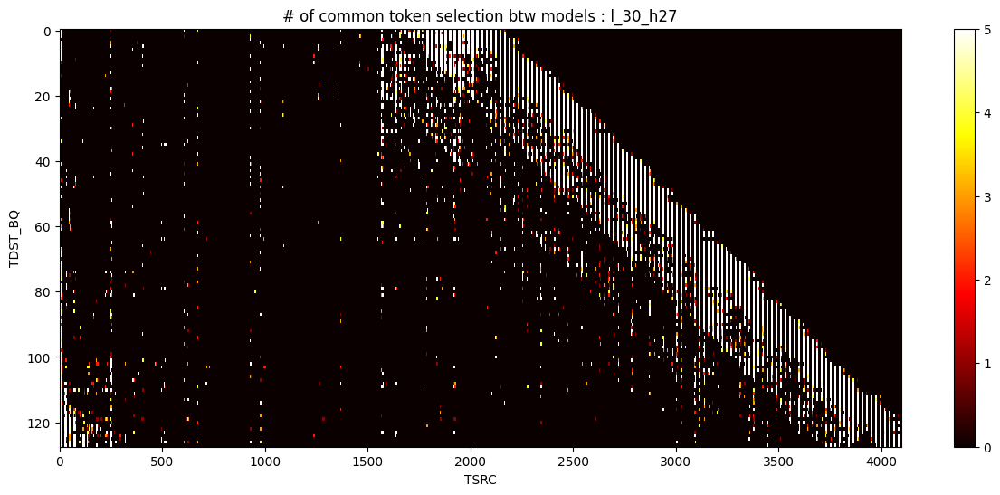

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


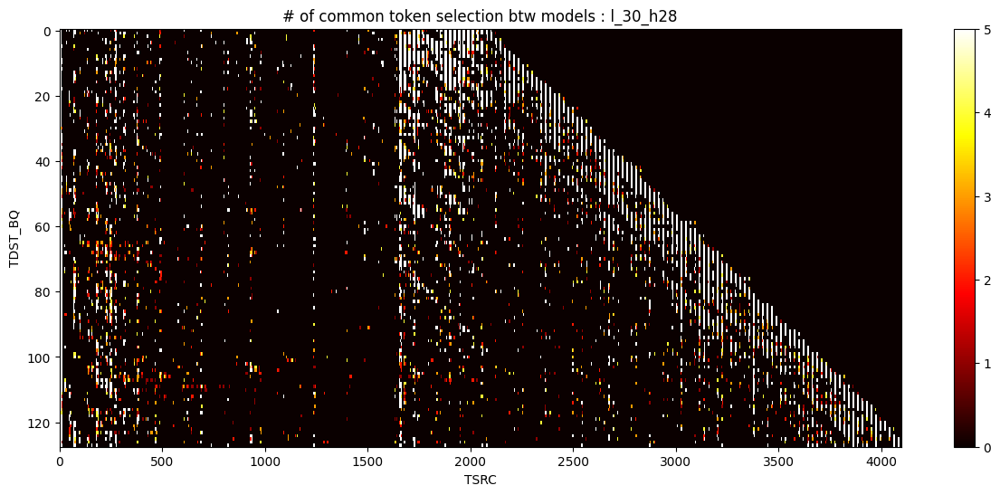

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


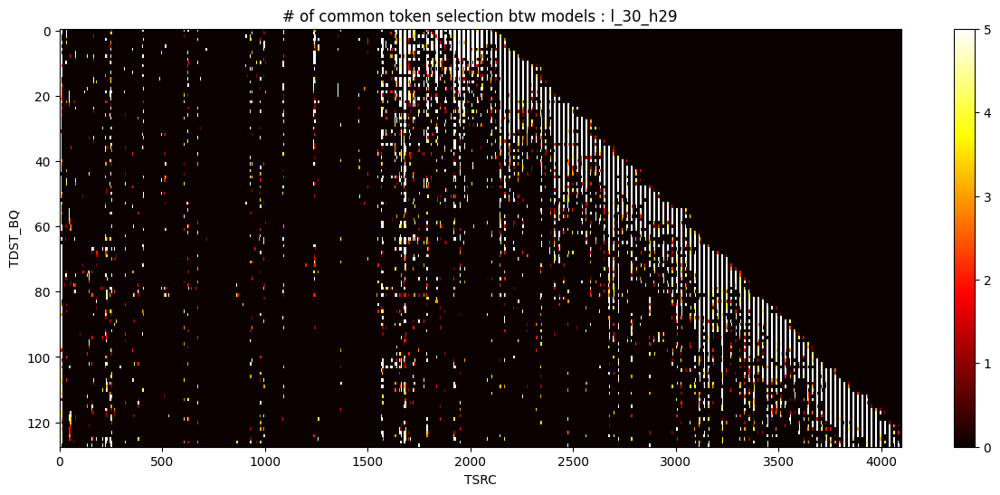

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


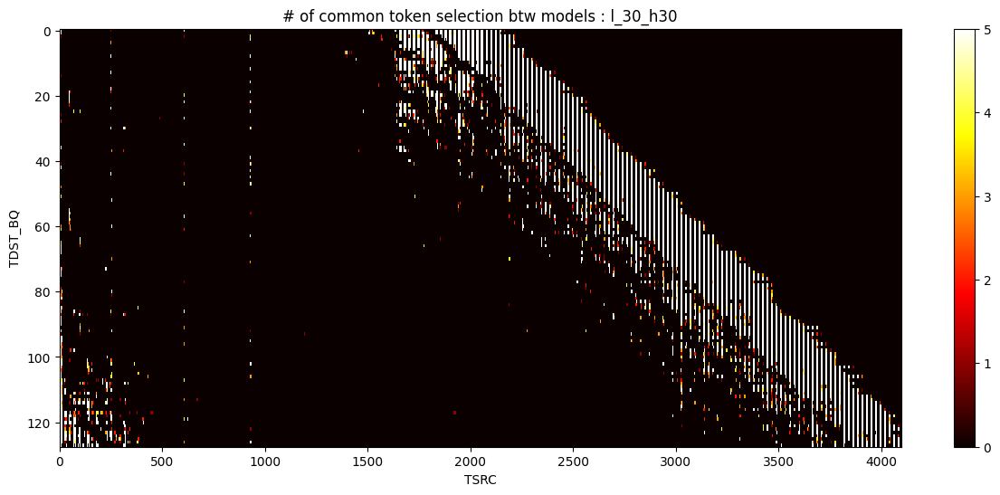

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


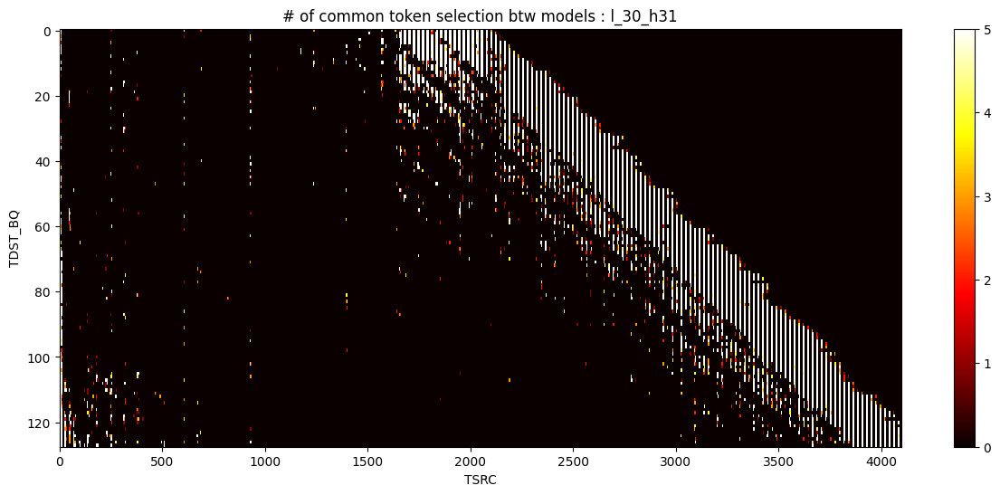

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


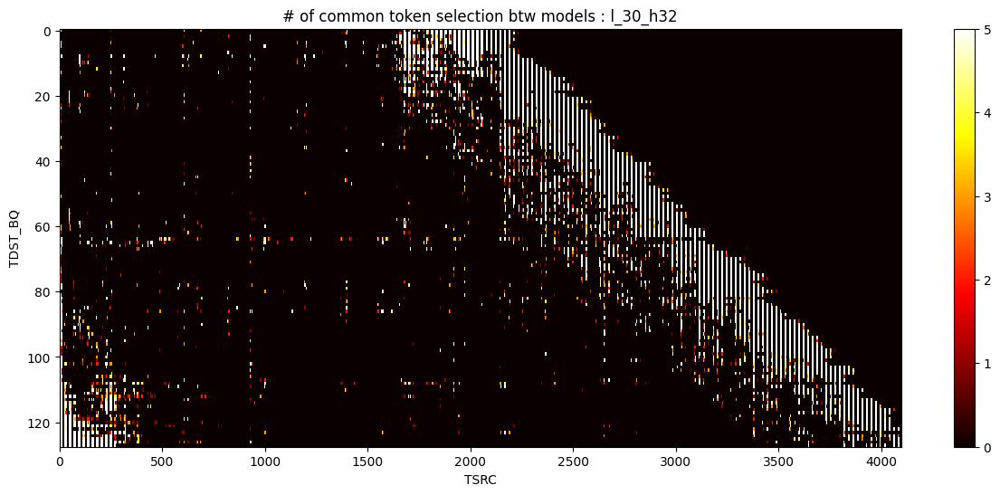

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


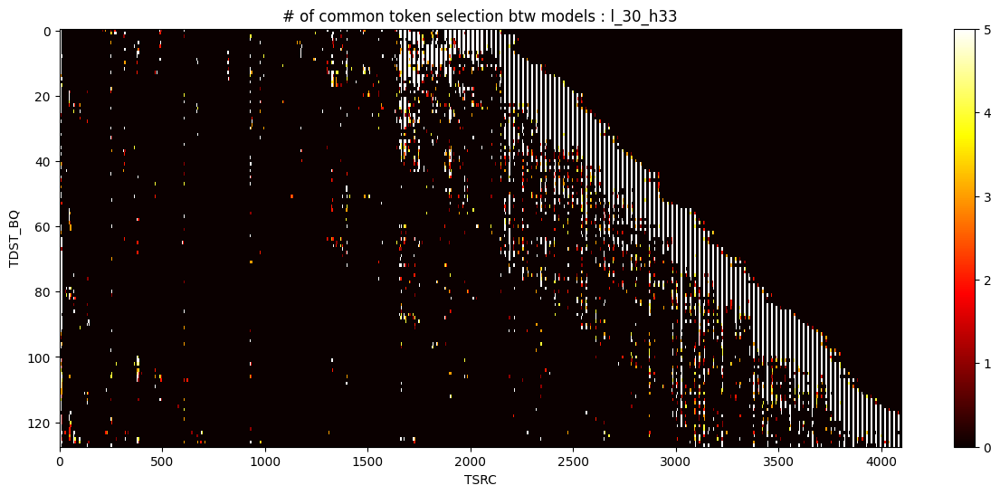

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


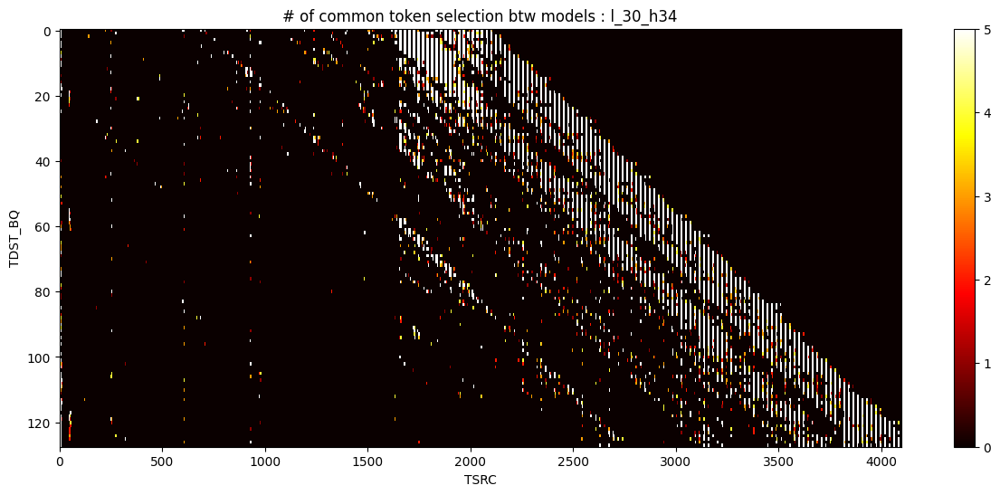

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


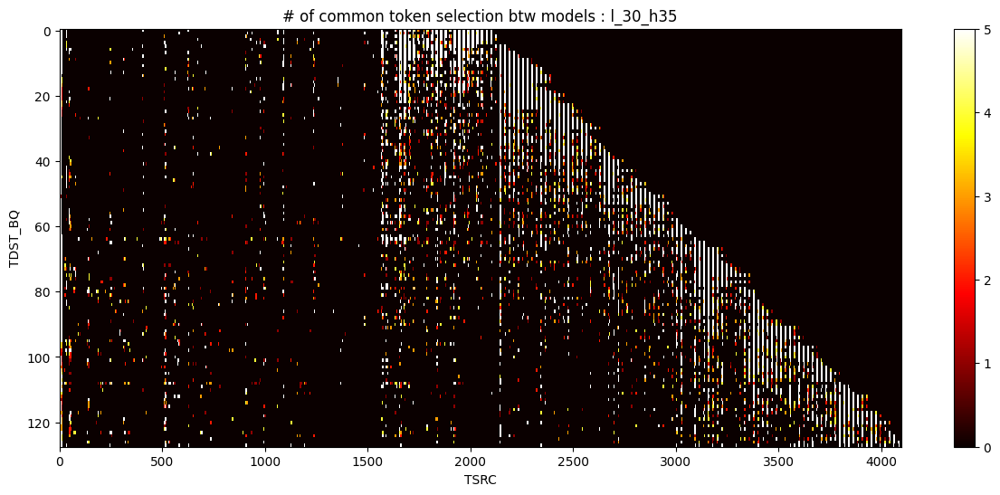

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


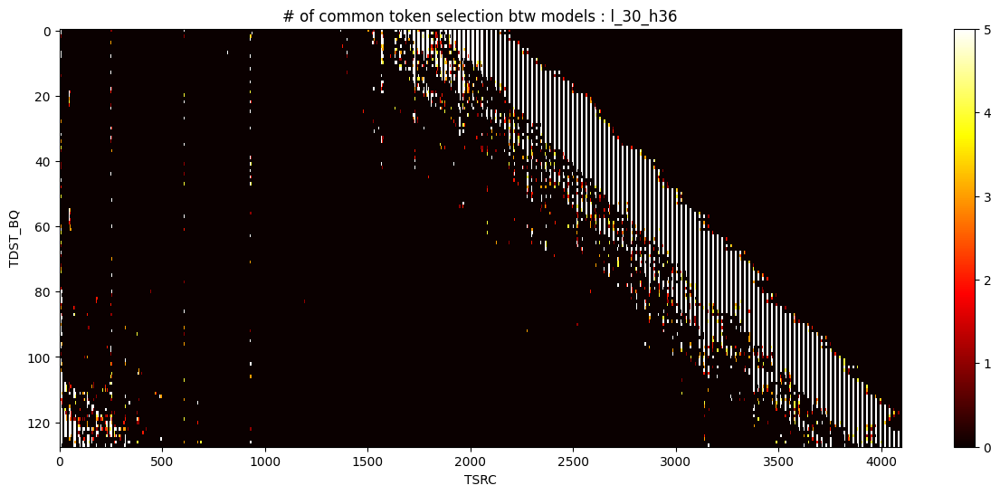

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


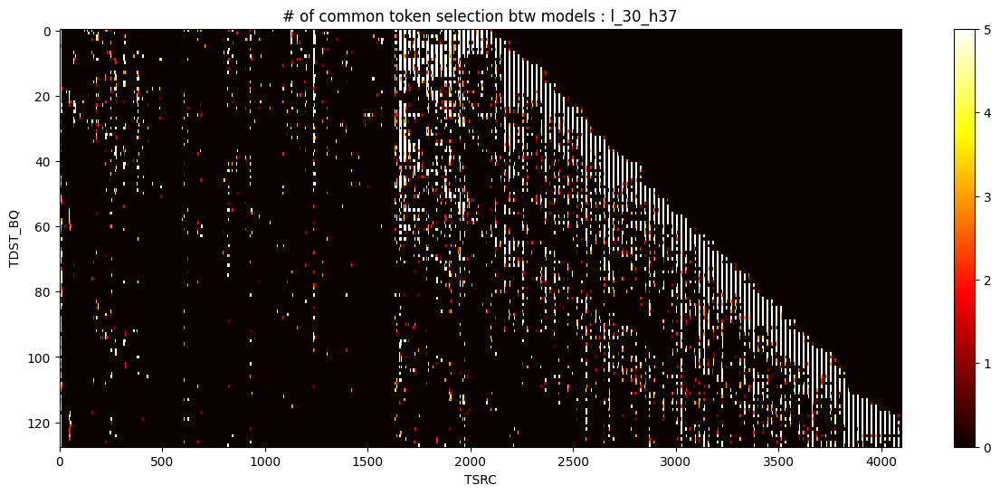

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


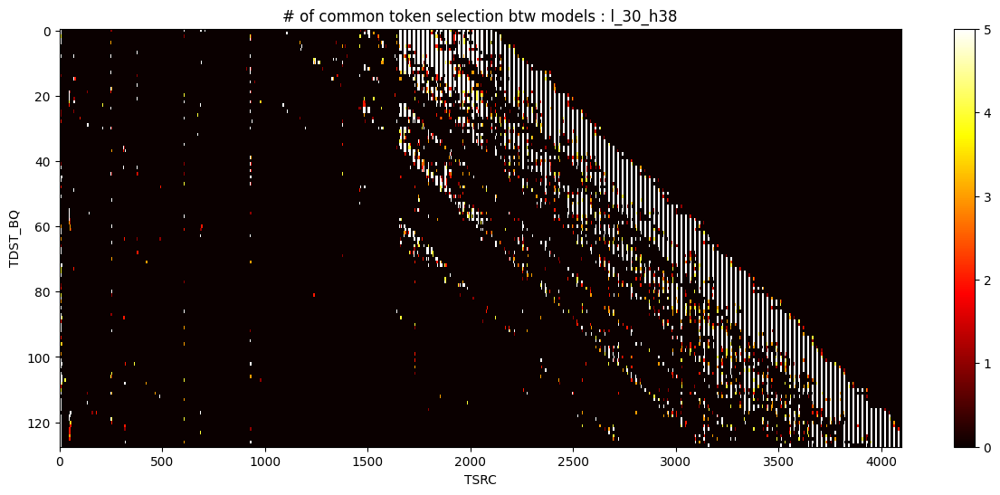

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


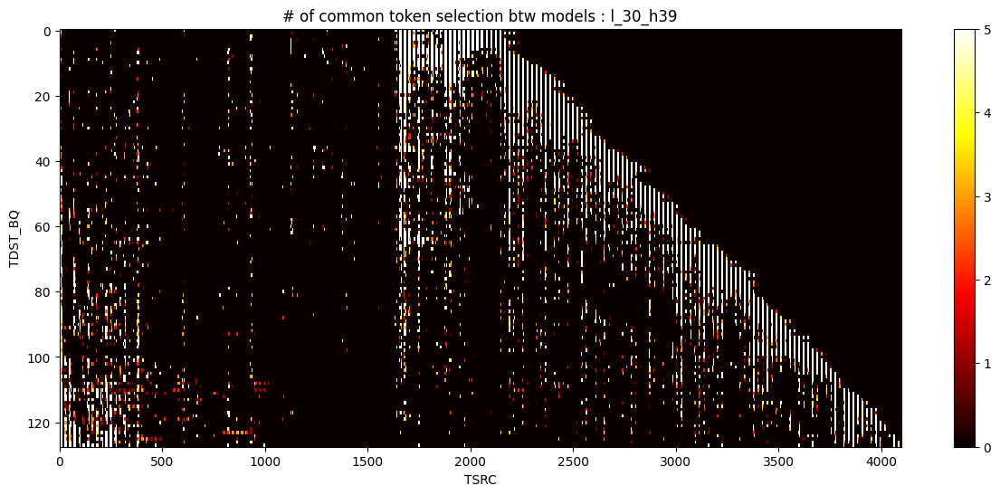

In [14]:
plot_per_layer(30)

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


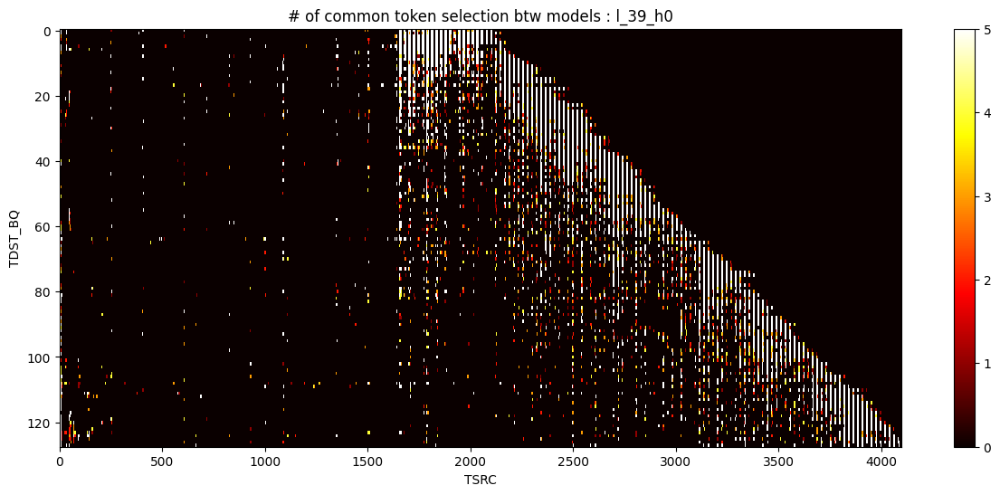

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


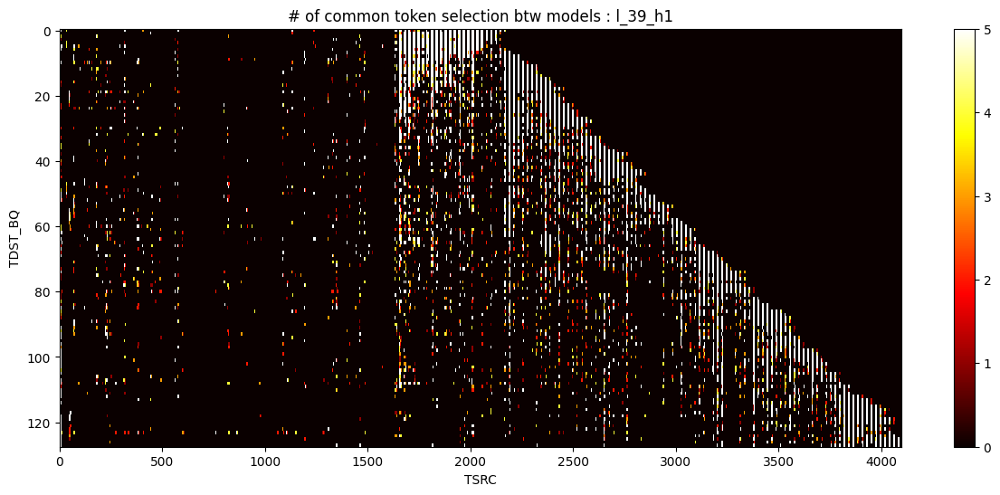

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


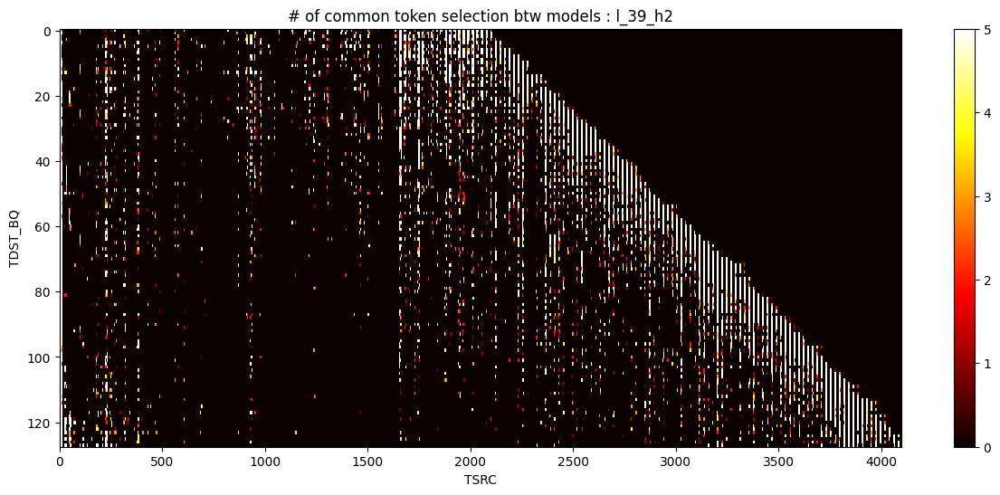

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


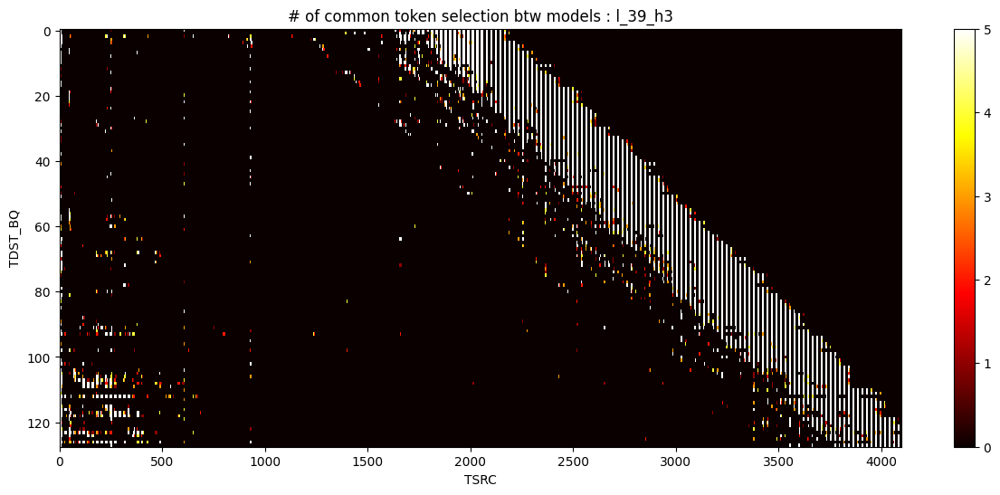

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


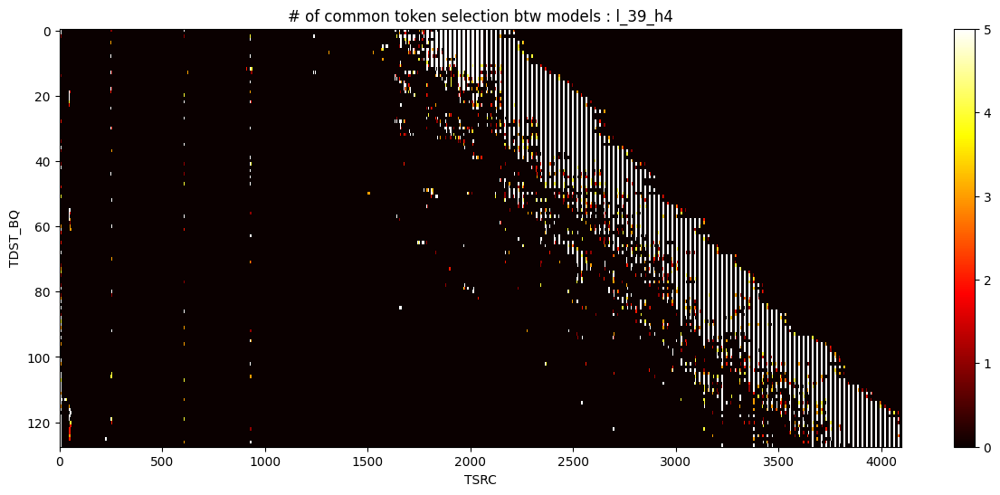

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


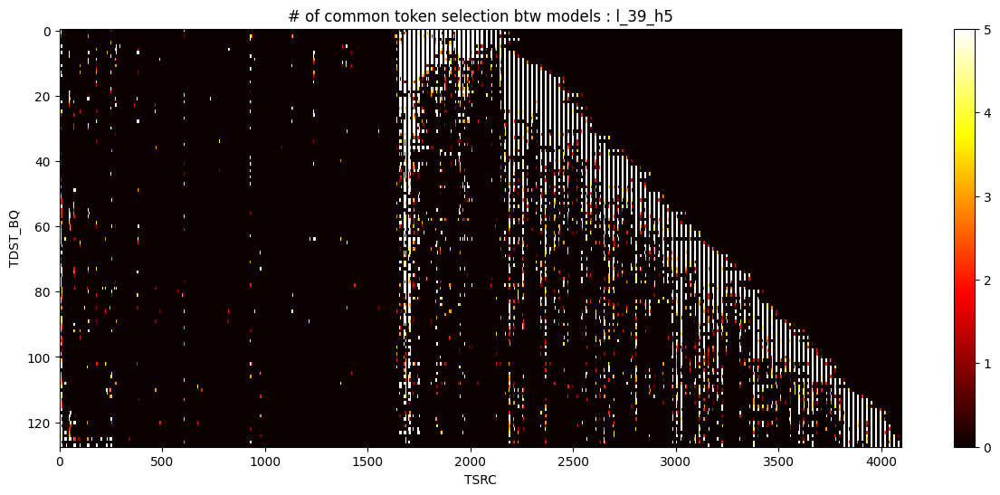

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


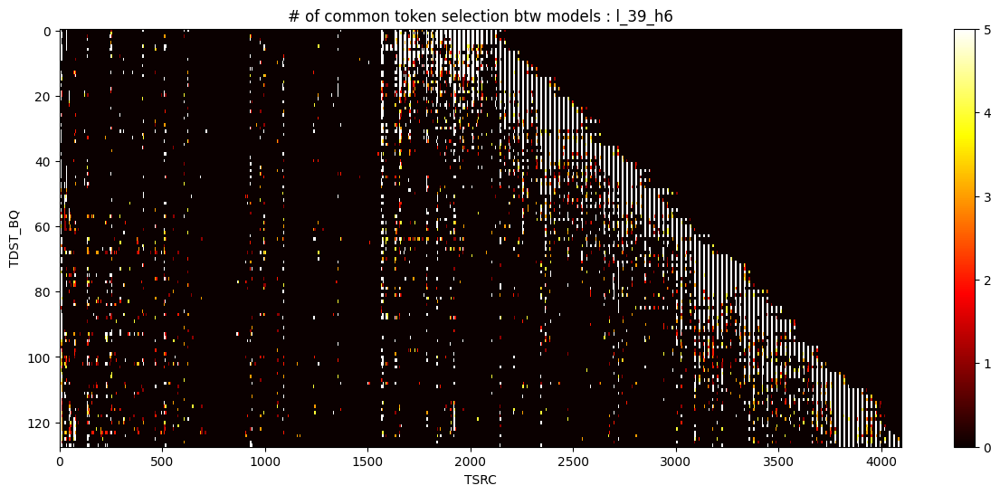

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


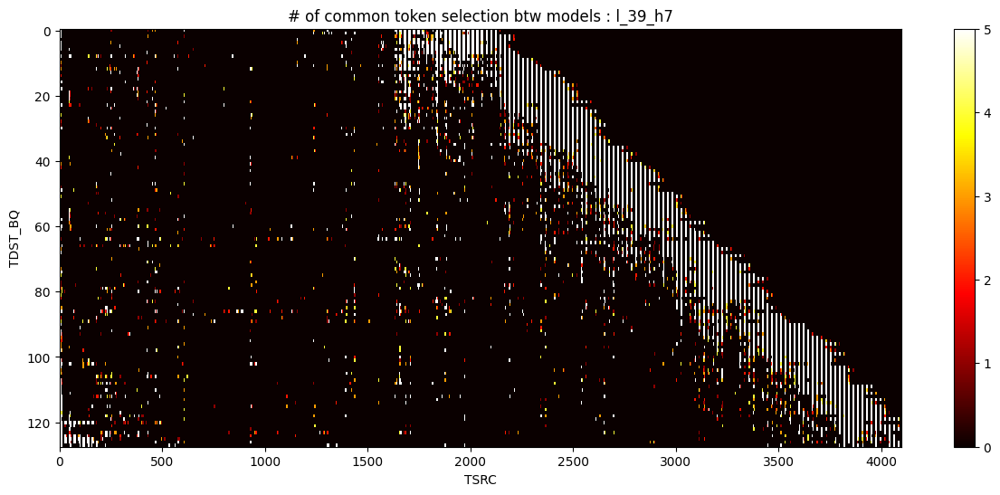

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.]])


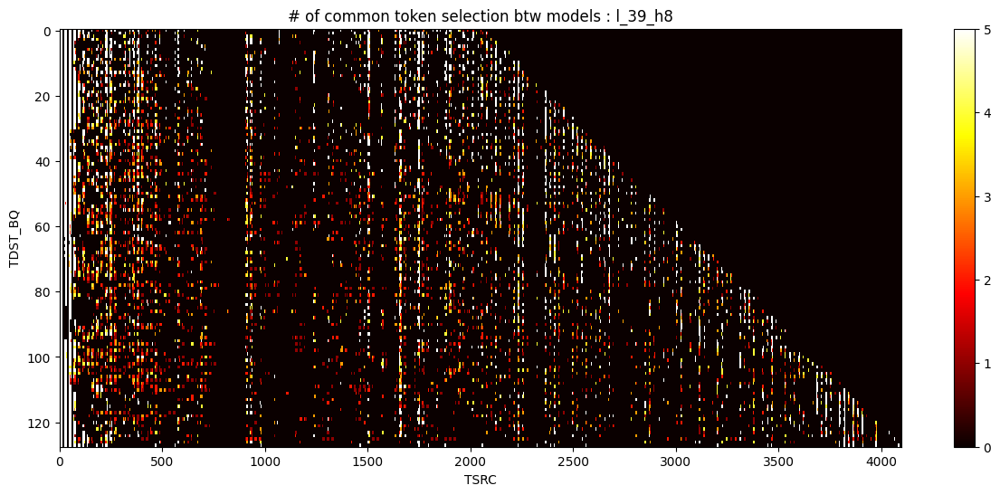

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


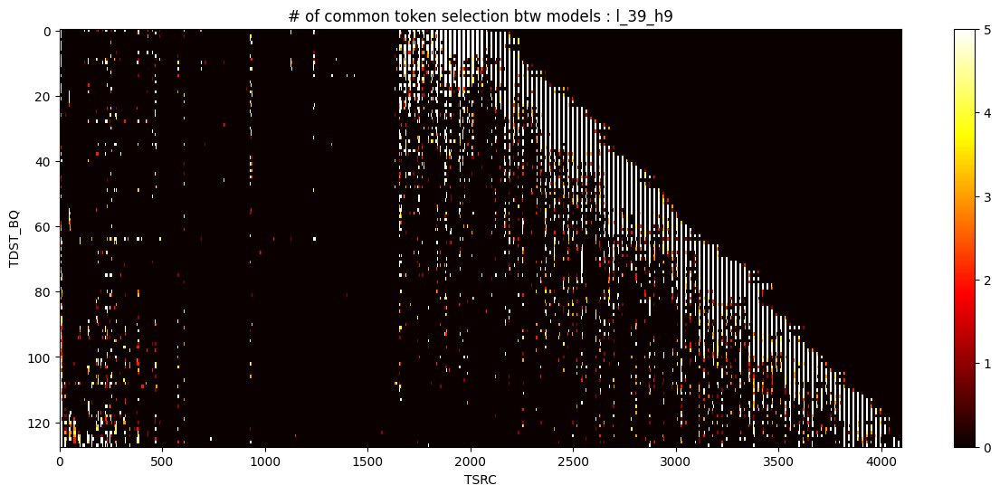

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


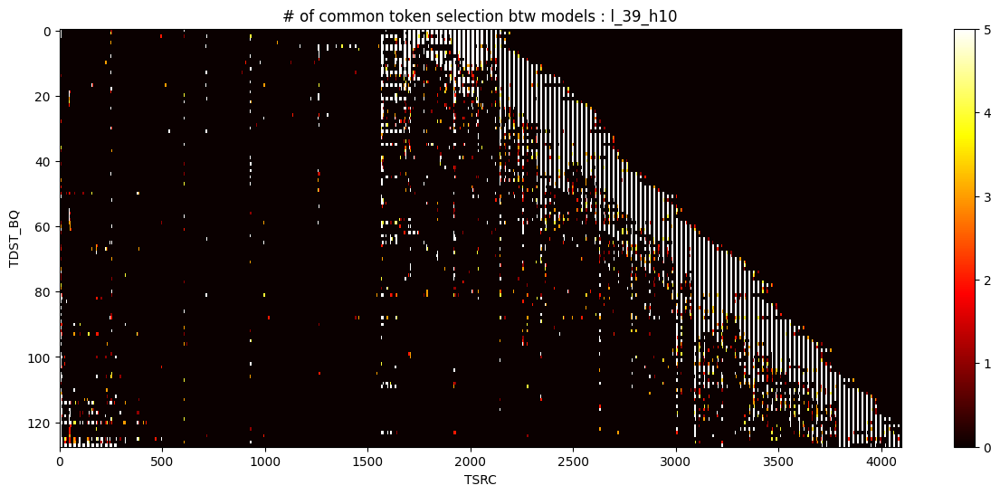

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


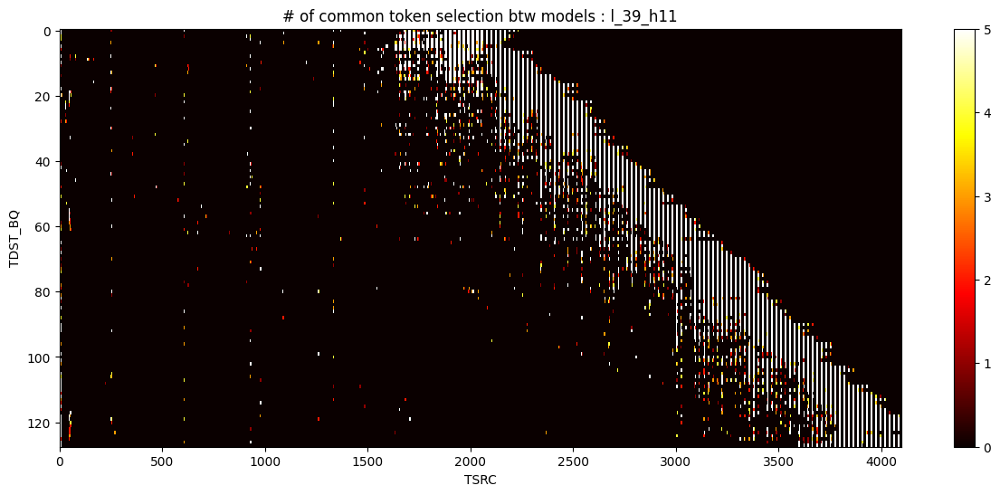

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


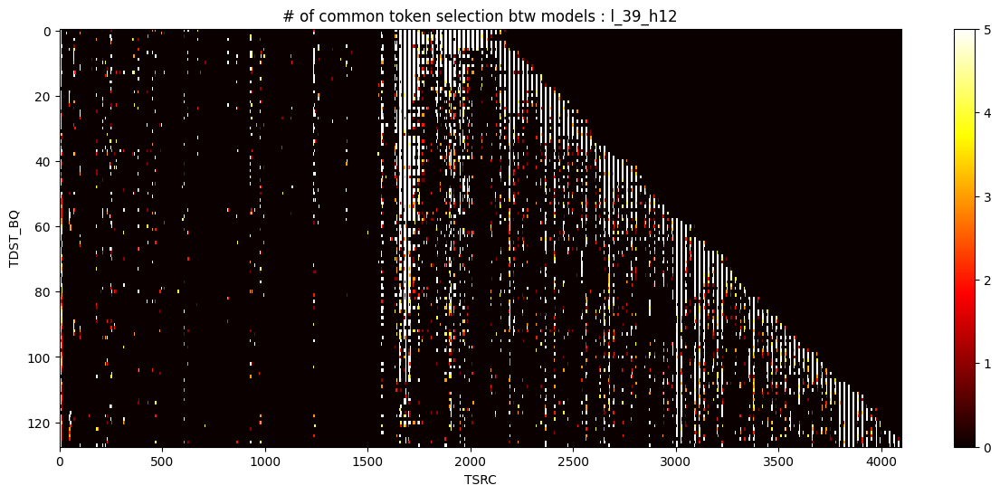

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


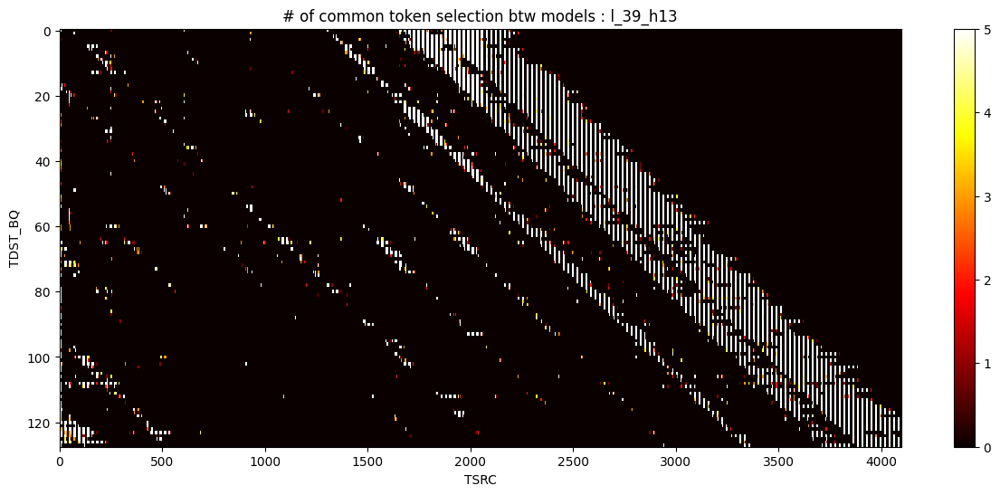

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


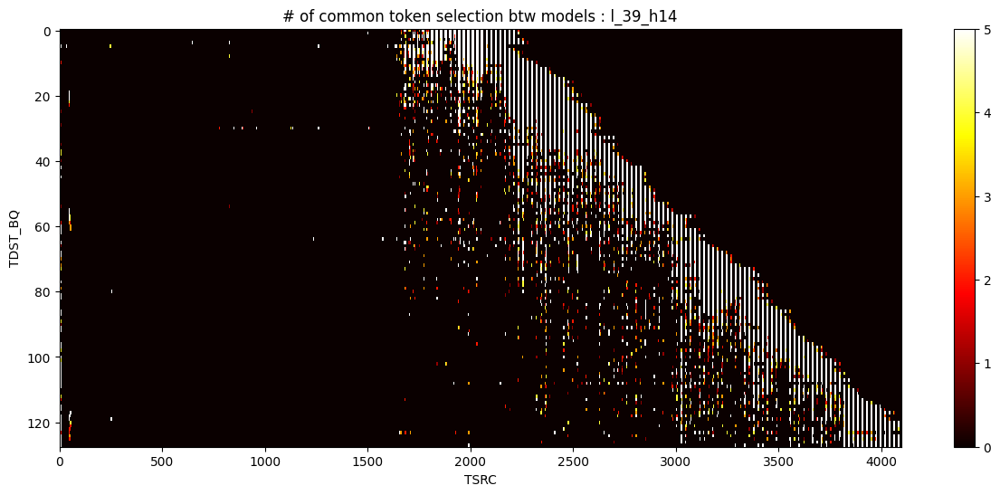

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


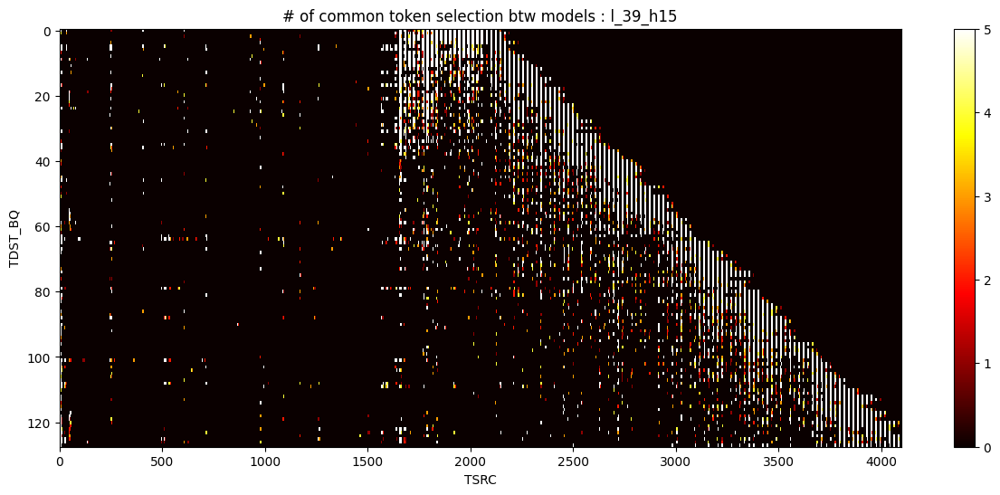

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


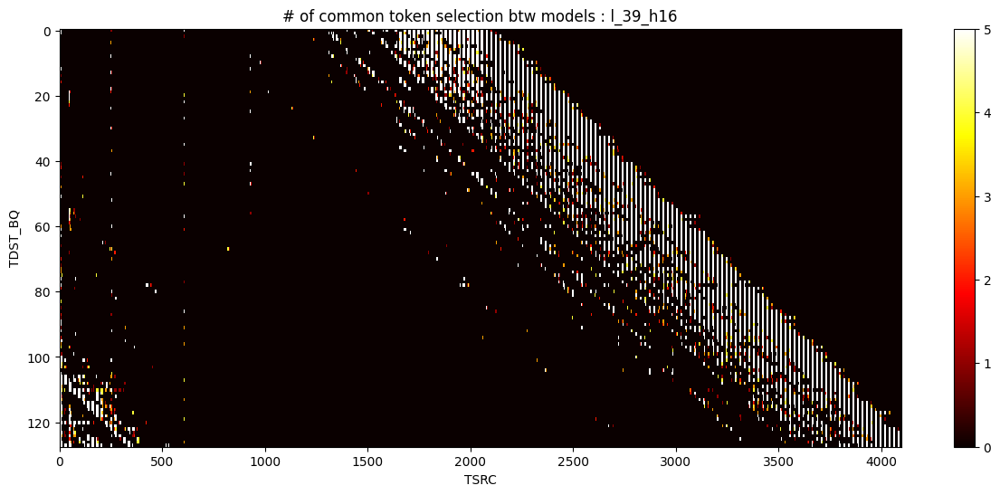

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


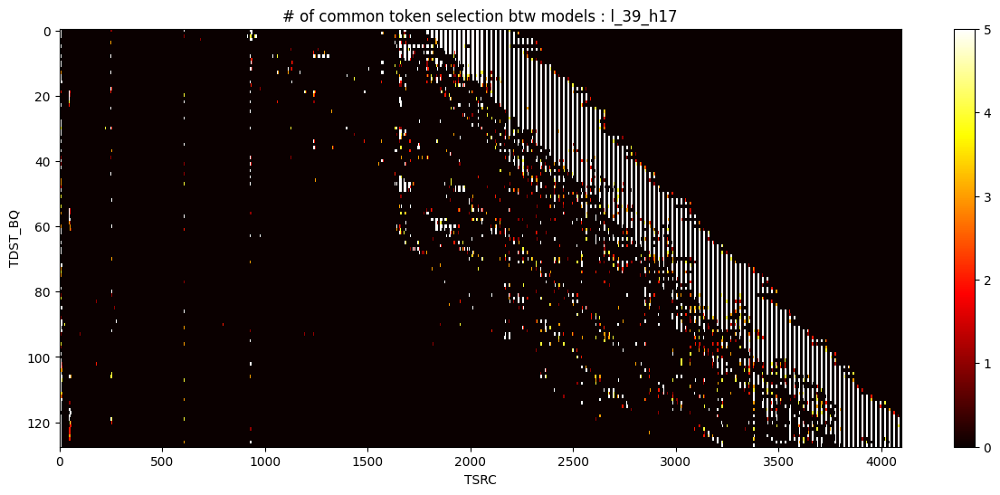

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


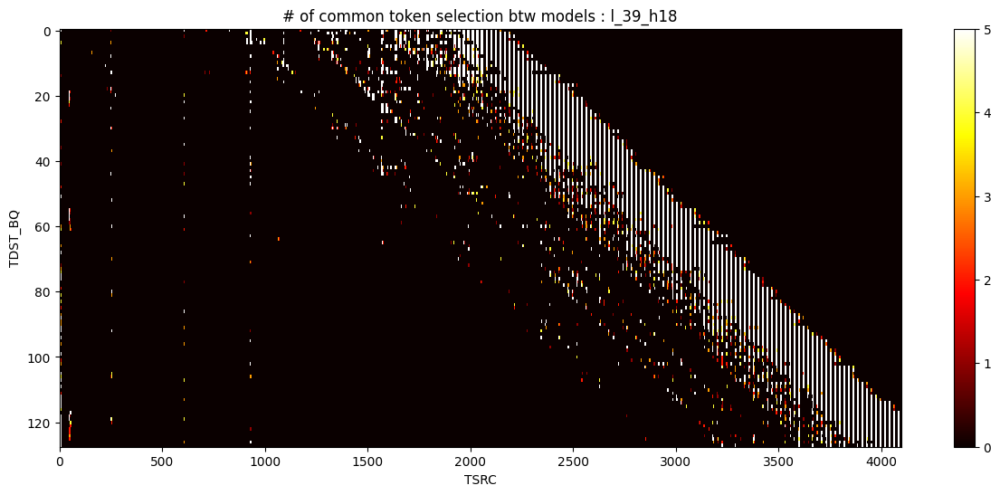

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


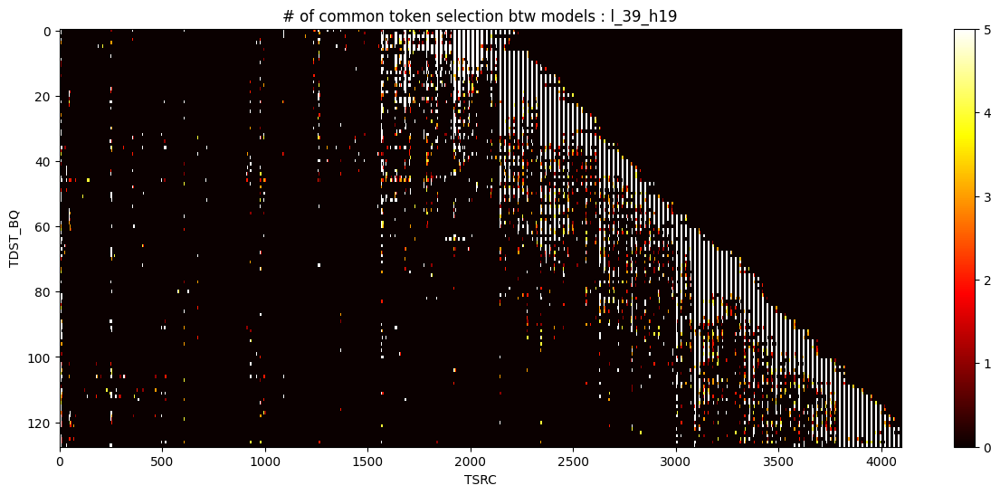

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


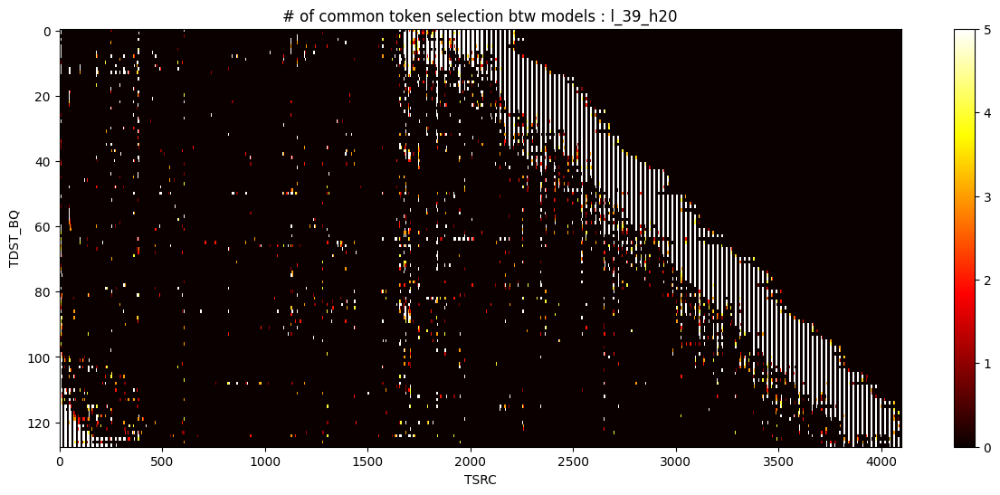

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


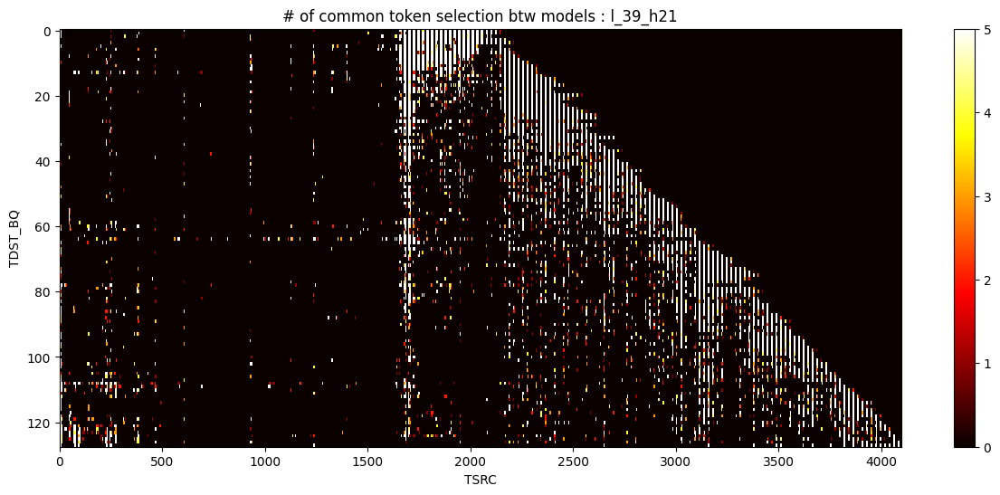

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 4., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


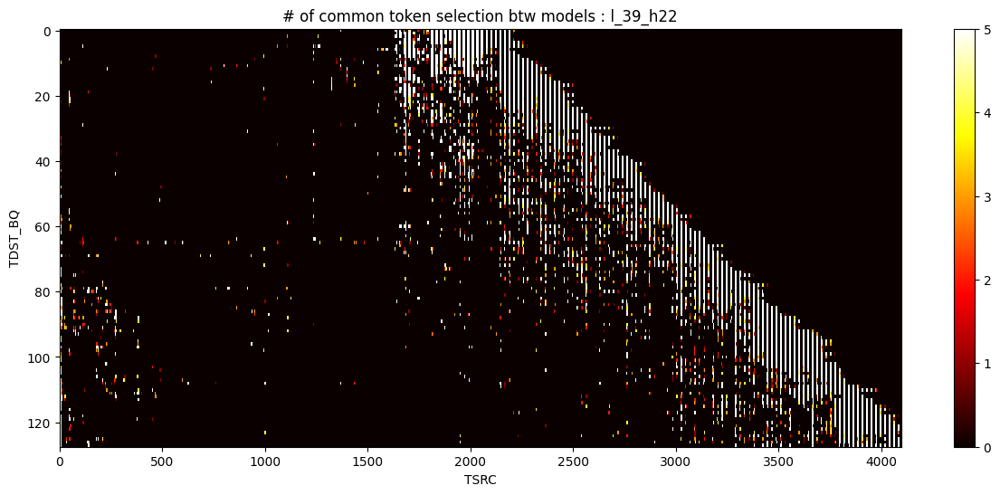

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


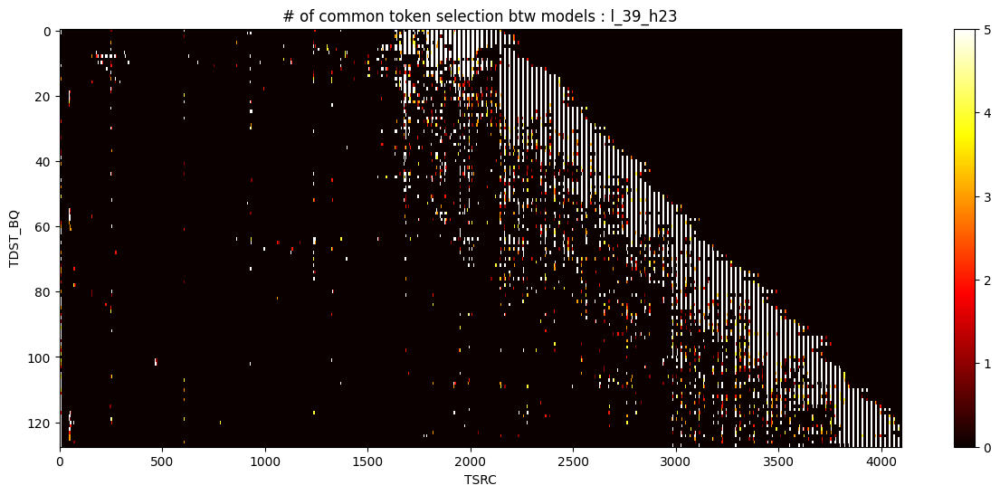

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 2., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


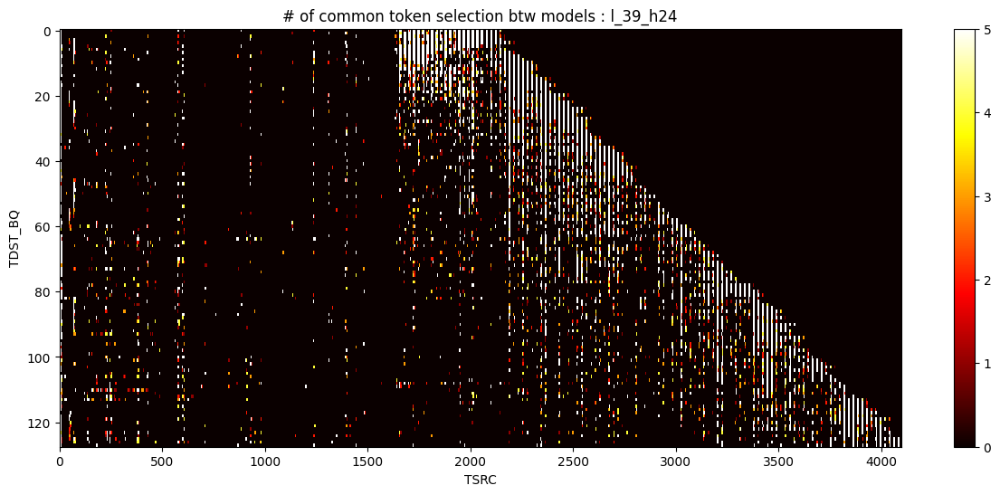

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


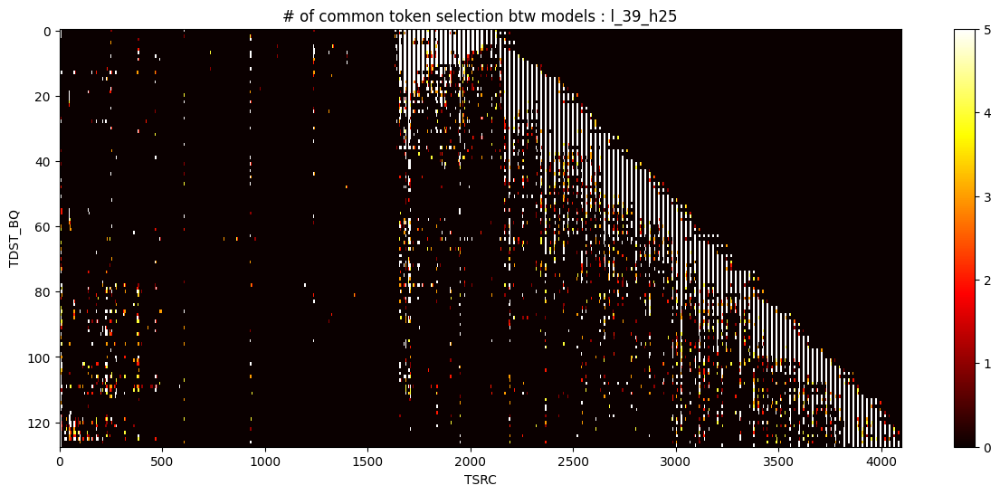

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


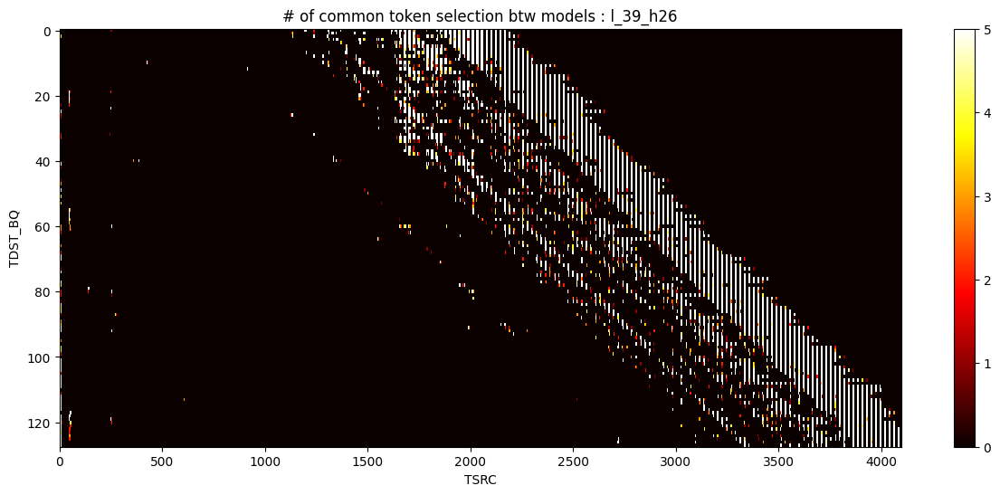

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


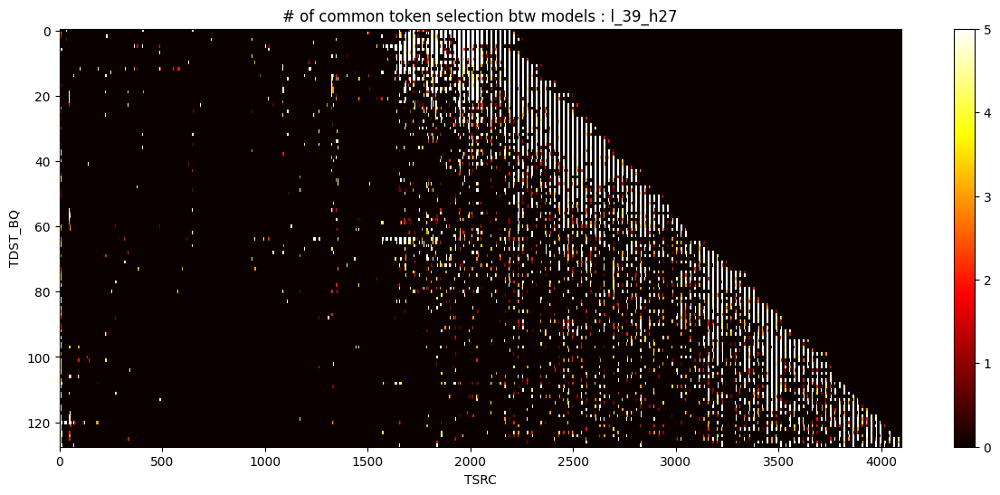

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


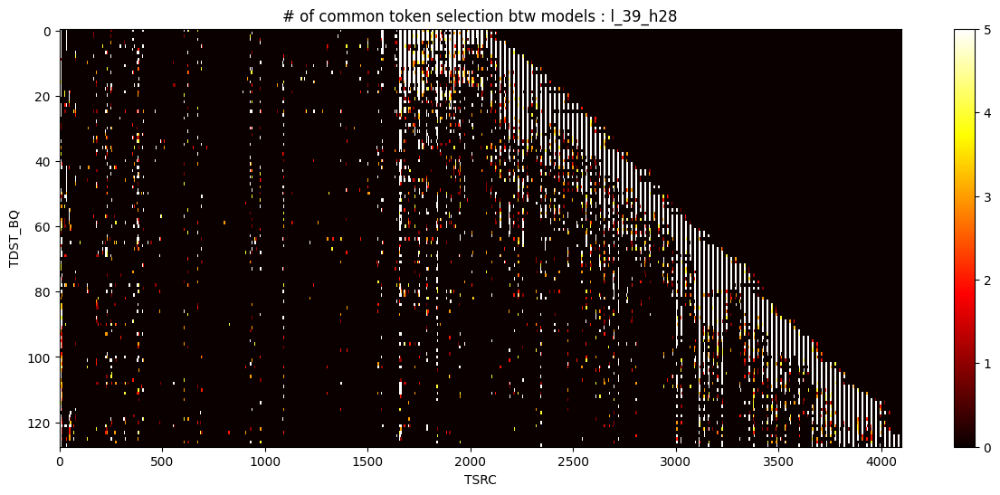

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


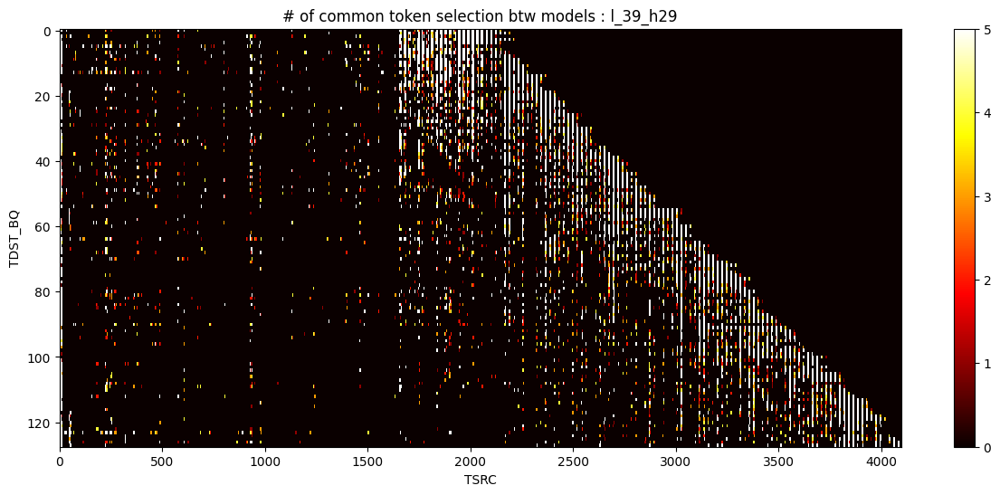

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


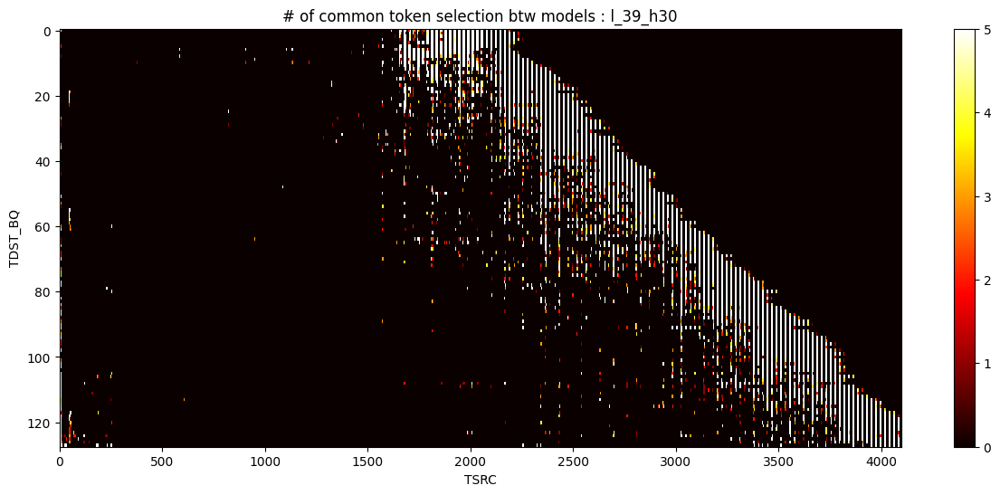

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


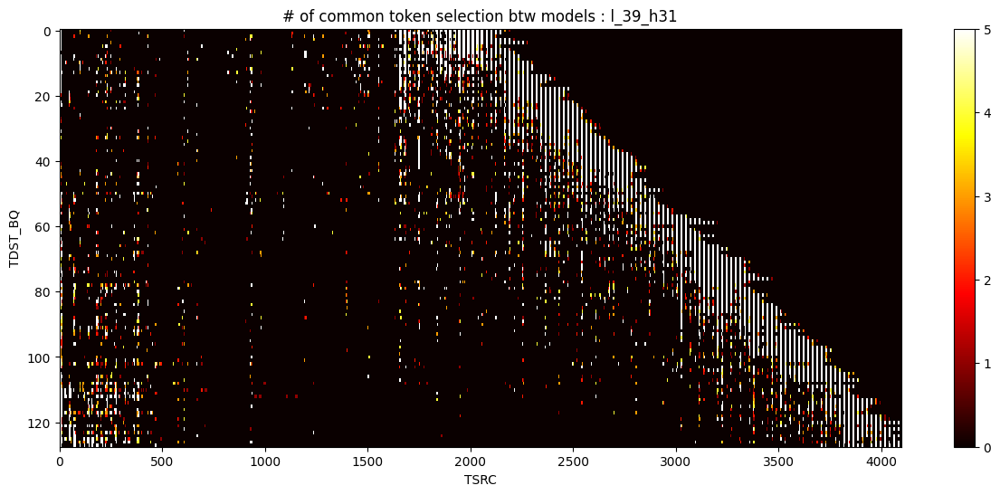

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


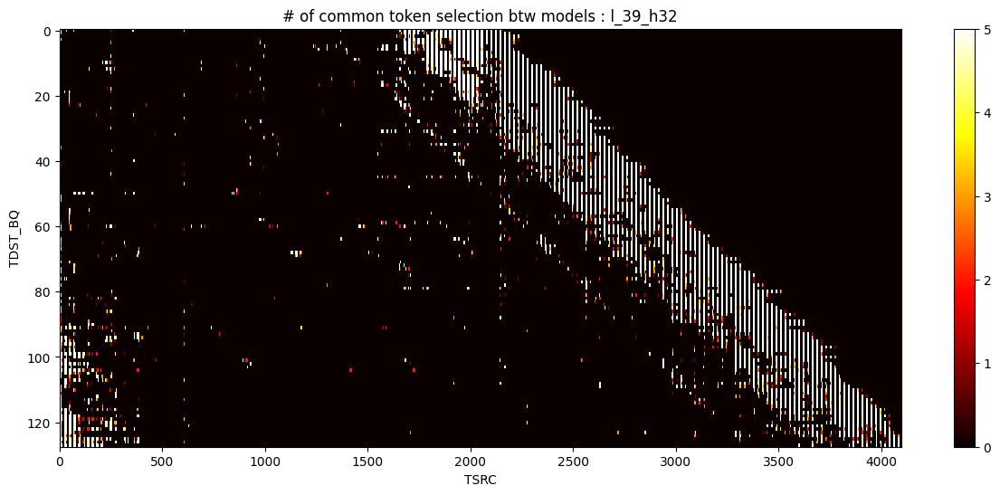

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 1., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


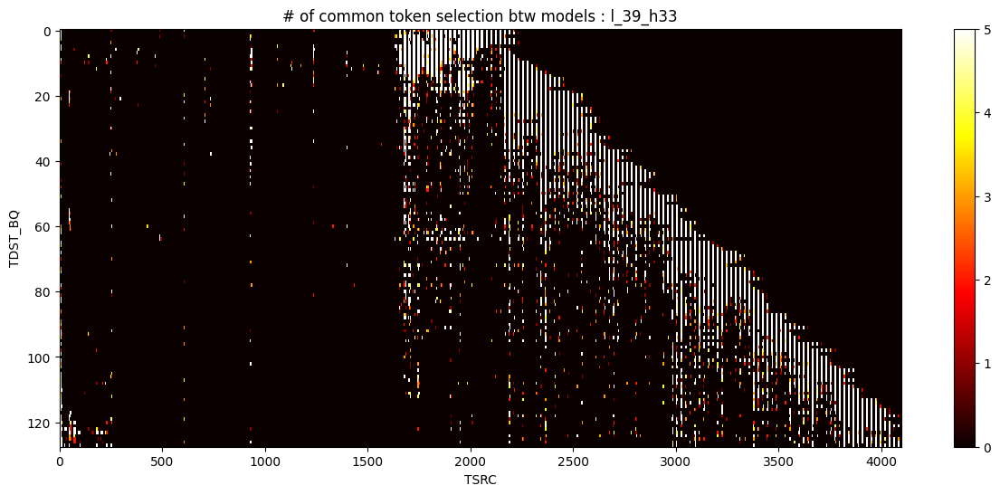

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


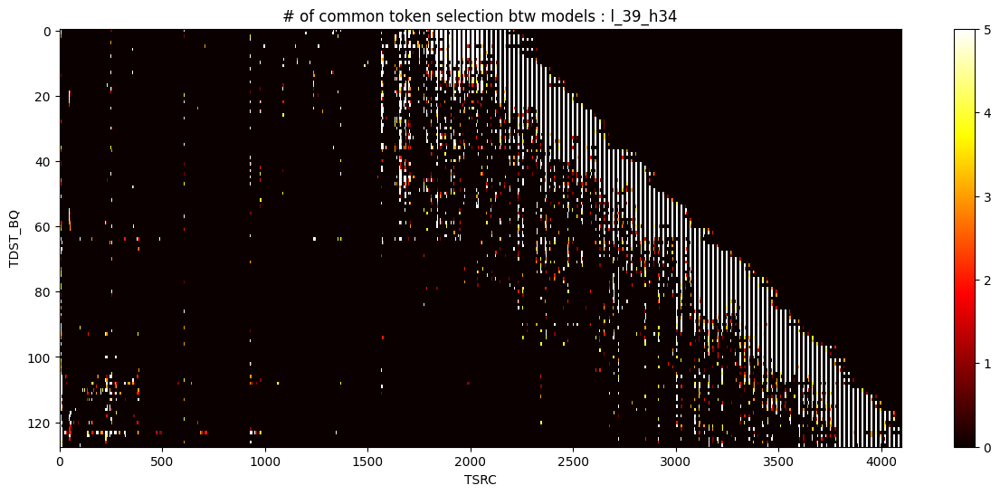

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


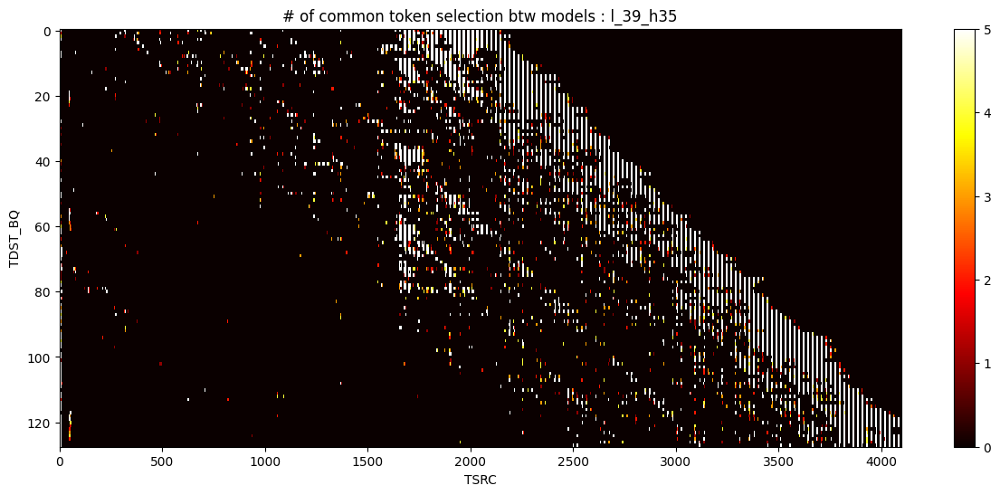

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


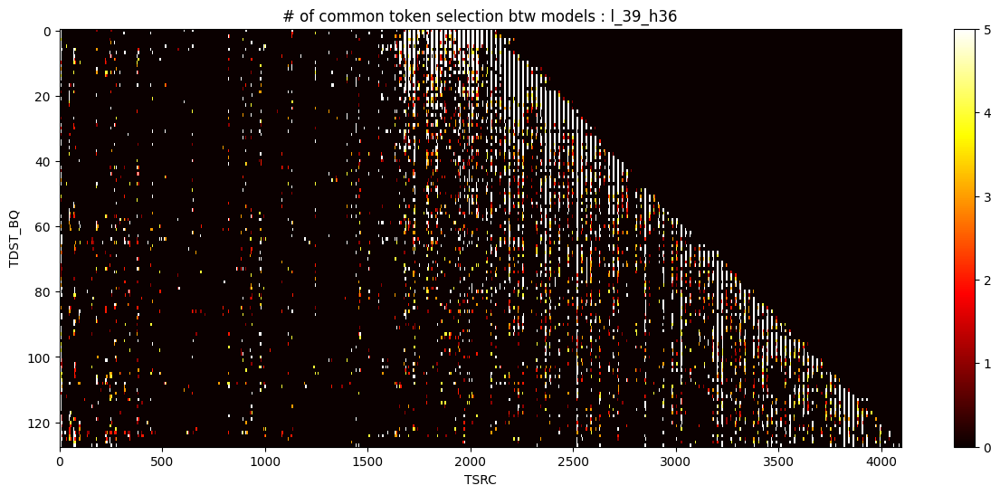

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


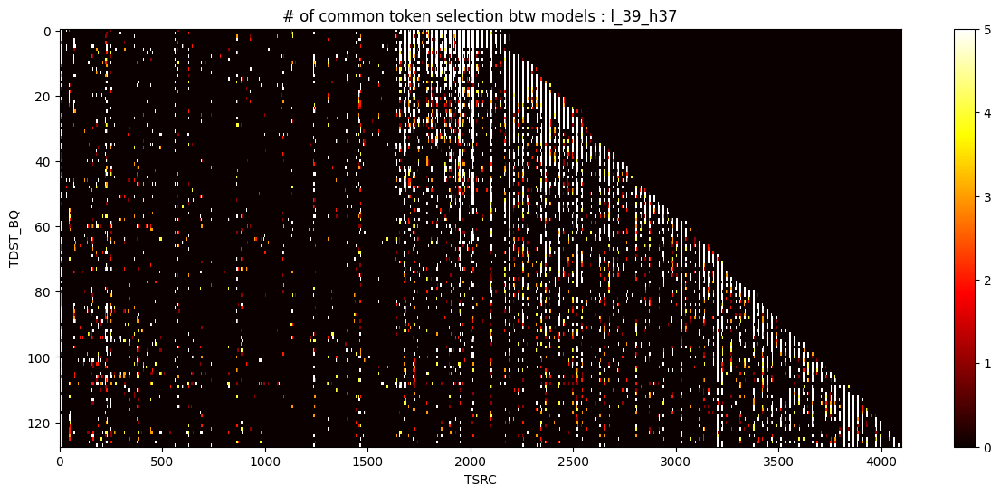

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


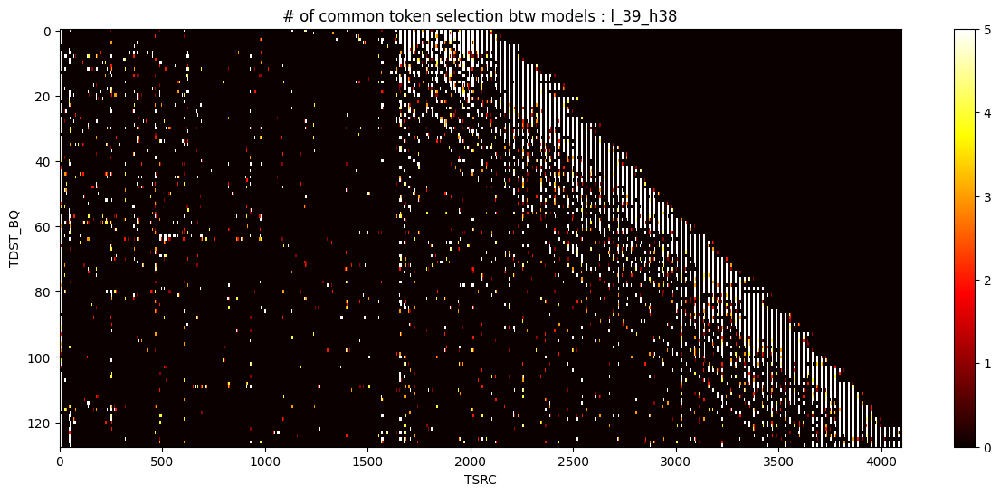

plot h :  {}
N hardcoded to : N=1
tensor([[5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        [5., 0., 5.,  ..., 0., 0., 0.],
        ...,
        [5., 0., 5.,  ..., 0., 3., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.],
        [5., 0., 5.,  ..., 0., 5., 0.]])


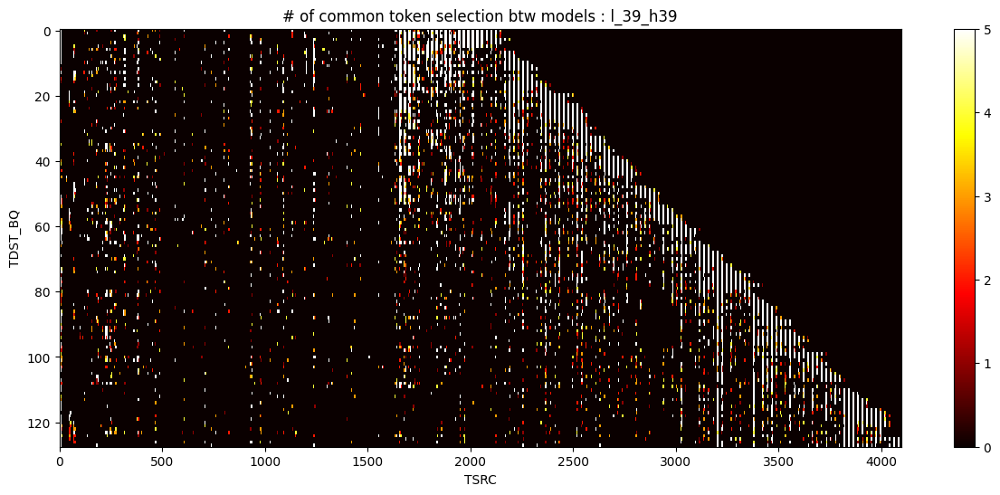

In [15]:
plot_per_layer(39)
